<a href="https://colab.research.google.com/github/siim2mary/Letsintern-projects/blob/main/HOTELBOOKINGPREDICTION3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**PROJECT-1**

---



# **HOTEL BOOKING PREDICTION**

---



Title: Hotel Booking Prediction System

**Introduction:**

---



In the dynamic landscape of the hospitality industry, managing hotel bookings efficiently is critical for ensuring optimal resource utilization and providing a seamless guest experience. The Hotel Booking Prediction System is designed to address the challenges associated with booking cancellations, enabling hotel managers to make data-driven decisions and enhance operational efficiency.

Objective:
The primary objective of the Hotel Booking Prediction System is to leverage predictive modeling techniques to forecast the likelihood of a booked hotel reservation being canceled. By harnessing the power of machine learning, the system aims to provide actionable insights to hotel management, empowering them to:

Proactively Manage Resources:

Anticipate and mitigate booking cancellations to optimize staff schedules, room allocations, and other resources, ensuring efficient operations.
Enhance Guest Experience:

Improve the overall guest experience by minimizing disruptions caused by cancellations, resulting in higher customer satisfaction and loyalty.
Strategically Plan Marketing and Promotions:

Utilize predictive insights to strategically plan marketing campaigns and promotions during periods with a higher likelihood of cancellations, attracting more bookings.
Optimize Pricing Strategies:

Adjust pricing strategies based on predicted cancellation rates, maximizing revenue during peak periods and minimizing losses during slower seasons.
Improve Revenue Management:

Develop more effective revenue management strategies by understanding and forecasting booking patterns, allowing for better pricing and inventory management.
Key Features:

Predictive Modeling:

Employ advanced machine learning algorithms to analyze historical booking data and predict the probability of a reservation being canceled.
Real-time Insights:

Provide real-time insights into current booking trends and potential cancellations, allowing hotel managers to make informed decisions promptly.
User-Friendly Interface:

Design an intuitive and user-friendly interface that enables hotel staff to access and interpret predictive analytics without extensive technical expertise.
Customizable Alerts:

Implement customizable alerts and notifications to notify hotel staff of potential cancellations, enabling timely response and intervention.
Integration with Booking Systems:

Seamlessly integrate with existing hotel booking systems to ensure a smooth flow of information and facilitate data-driven decision-making.
By achieving these objectives, the Hotel Booking Prediction System aims to transform the way hotels approach booking management, fostering a more proactive and strategic operational environment. The system serves as a valuable tool for hoteliers seeking to optimize their processes and deliver an exceptional guest experience.






**Models Used:**

---



In the context of a Hotel Booking Prediction System, various machine learning models can be employed to predict the likelihood of booking cancellations. The choice of models depends on the characteristics of the dataset, the complexity of the problem, and the specific goals of the prediction system. Here are some commonly used models for predicting hotel booking cancellations:

Logistic Regression:

Logistic Regression is a simple and interpretable model used for binary classification problems. It's effective in predicting the probability of a booking being canceled based on input features.
Random Forest:

Random Forest is an ensemble learning algorithm that combines multiple decision trees to improve predictive accuracy and handle complex relationships in the data. It is robust and less prone to overfitting.
Decision Trees:

Decision Trees are used for both classification and regression tasks. They are easy to interpret and can capture non-linear relationships in the data. However, they may be sensitive to overfitting.

Lasso Regression:

Lasso Regression is useful for feature selection and regularization. It can be employed to identify the most relevant features contributing to booking cancellations.
K-Nearest Neighbors (KNN):

KNN is a simple and effective algorithm that classifies data points based on the majority class of their neighbors. It is particularly useful when there are well-defined clusters in the data.
Naive Bayes:

Naive Bayes is a probabilistic classifier based on Bayes' theorem. It assumes that features are independent, making it computationally efficient and suitable for certain types of datasets.

In [ ]:
# Import necessary libraries

# Importing Python Libraries for Data Processing
import os,sys
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# Data Visualization Libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
import plotly.express as px
import plotly.graph_objects as go


# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

# Natural Language Processing (NLP) and Text Analysis Libraries
import re
import string

# Scikit-Learn (sklearn) Libraries for Machine Learning and Evaluations
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

#Models used
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
#from sklearn.ensemble import DecisionTreeClassifier
from sklearn.svm import SVC

#Evaluation Algorithms
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

#Dealing with imbalanced dataset
from imblearn.over_sampling import SMOTE


In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
path_to_file1= '/content/drive/MyDrive/hotel_bookings.csv'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import shutil

# Copy the file to the current working directory in Colab
shutil.copy(path_to_file1, './hotel_bookings.csv')


'./hotel_bookings.csv'

**IMPORT DATA SET**

---



In [ ]:
df= pd.read_csv("/content/hotel_bookings.csv")

In [ ]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,7/3/2015


In [ ]:
df.tail()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,9/6/2017
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,9/7/2017
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,9/7/2017
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,9/7/2017
119389,City Hotel,0,205,2017,August,35,29,2,7,2,...,No Deposit,9.0,NaN,0,Transient,151.20,0,2,Check-Out,9/7/2017


In [ ]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [ ]:
df.shape

(119390, 32)

In [ ]:
df['country'].value_counts()


PRT    48590
GBR    12129
FRA    10415
ESP     8568
DEU     7287
       ...  
DJI        1
BWA        1
HND        1
VGB        1
NAM        1
Name: country, Length: 177, dtype: int64

In [ ]:
print(type(df['country']))


<class 'pandas.core.series.Series'>


In [ ]:
!pip install autoviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.3/68.3 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 49.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 421.5/421.5 kB 38.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 69.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 103.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 97.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.9/255.9 MB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.3/87.3 kB 11.8 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of panel to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.8/20.8 MB 34.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.8/20.8 MB 30.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.8/

Imported v0.1.804. After importing autoviz, you must run '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (119390, 32)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  3
    Number of Integer-Categorical Columns =  13
    Number of String-Categorical Columns =  9
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  1
    Number of Numeric-Boolean Columns =  1
    Number of Discrete String Columns =  2
    Number of NLP String

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
agent,float64,13.824615,NA,1.000000,535.000000,"11800 missing values. Impute them with mean, median, mode, or a constant value such as 123."
adr,float64,0.000000,NA,-6.380000,5400.000000,Column has 2365 outliers greater than upper bound (229.22) or lower than lower bound(-22.03). Cap them or remove them.
children,float64,0.004686,NA,0.000000,10.000000,"4 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 8331 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them."
hotel,object,0.000000,0,,,No issue
lead_time,int64,0.000000,0,0.000000,737.000000,Column has 2375 outliers greater than upper bound (293.50) or lower than lower bound(-158.50). Cap them or remove them.
arrival_date_year,int64,0.000000,0,2015.000000,2017.000000,Possible date-time colum: transform before modeling step.
arrival_date_month,object,0.000000,0,,,No issue
arrival_date_week_number,int64,0.000000,0,1.000000,53.000000,No issue
arrival_date_day_of_month,int64,0.000000,0,1.000000,31.000000,No issue
stays_in_weekend_nights,int64,0.000000,0,0.000000,19.000000,Column has 217 outliers greater than upper bound (5.00) or lower than lower bound(-3.00). Cap them or remove them.


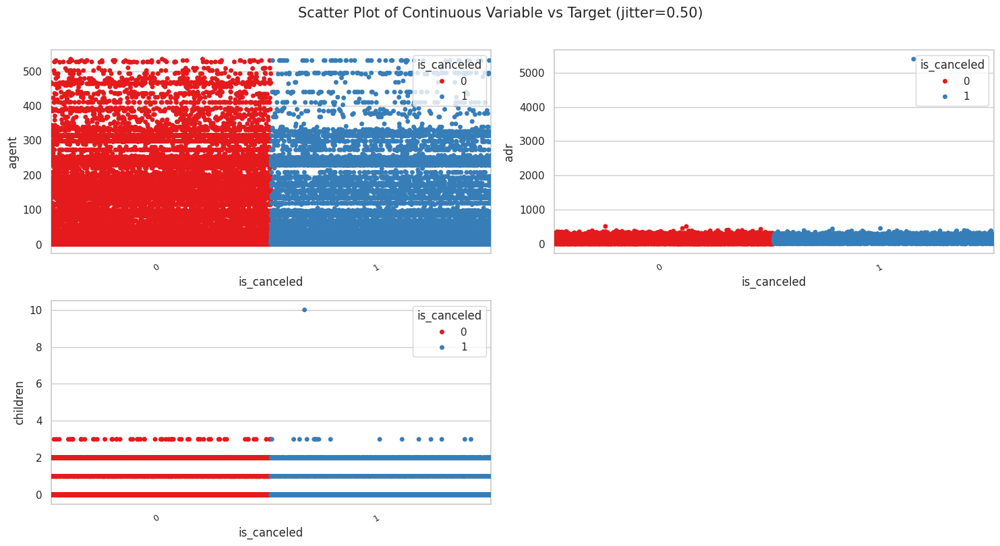

Total Number of Scatter Plots = 6


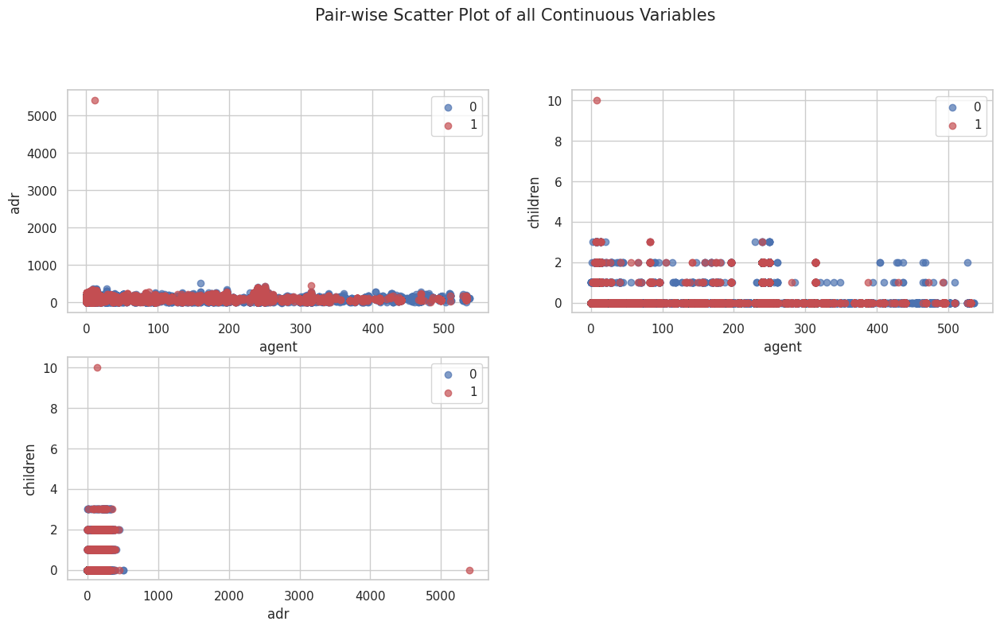

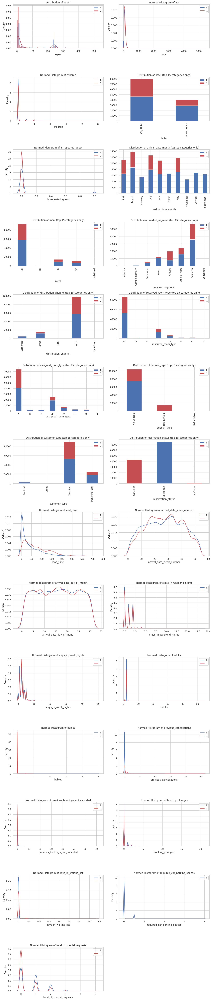

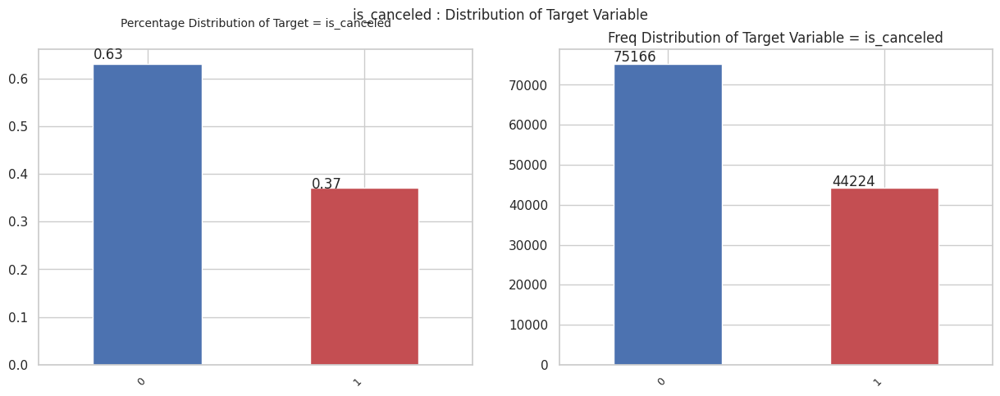

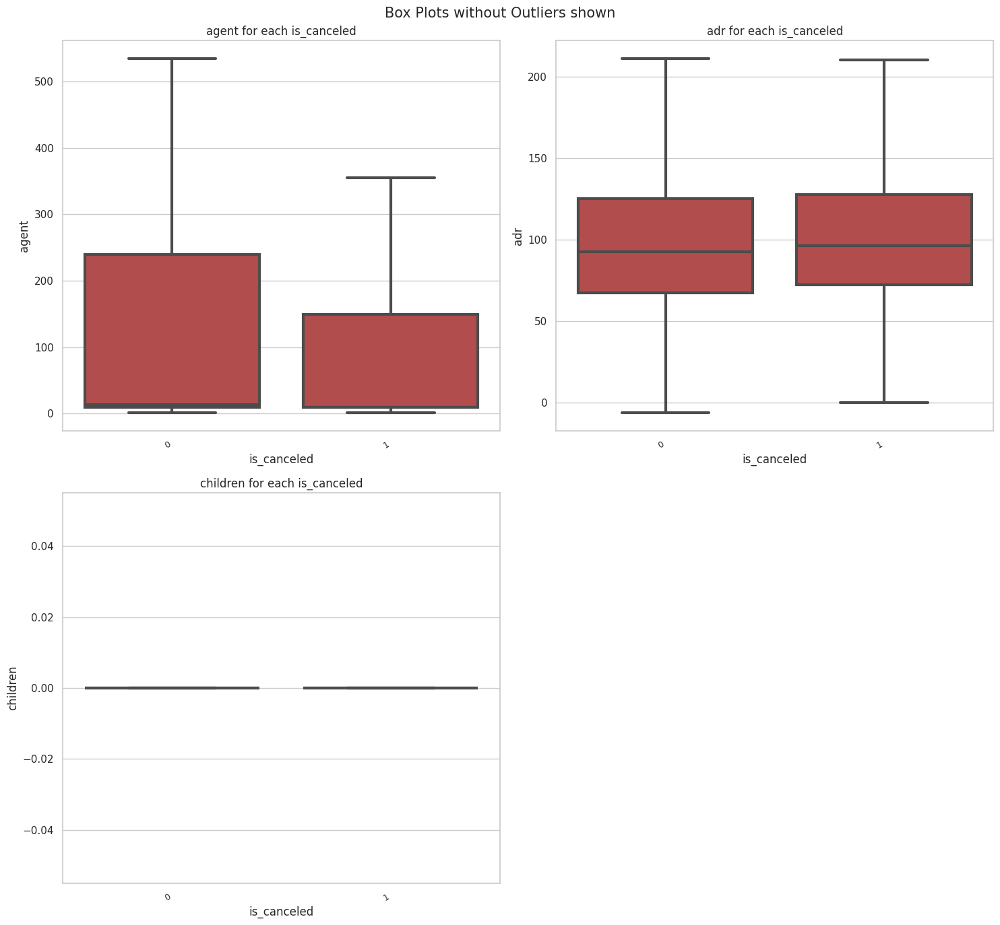

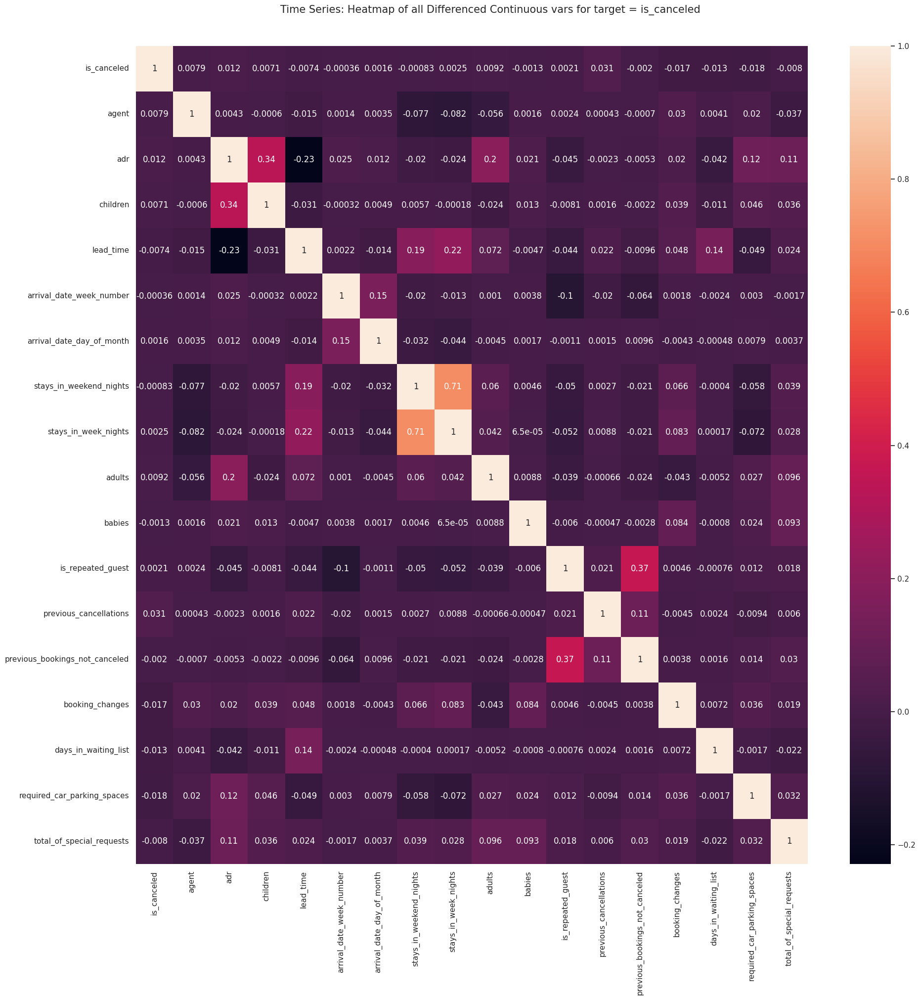

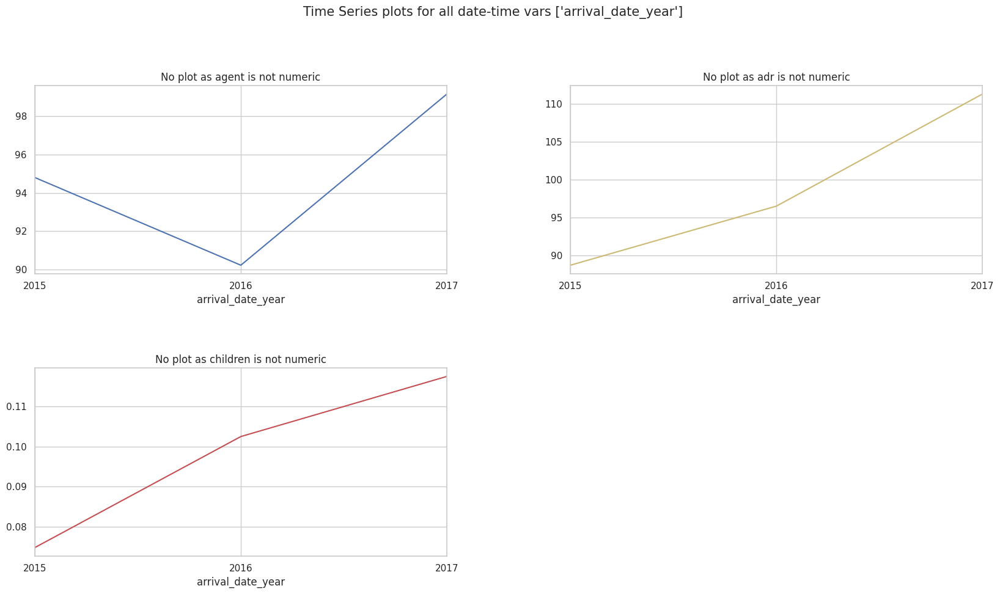

Could not draw some Time Series plots


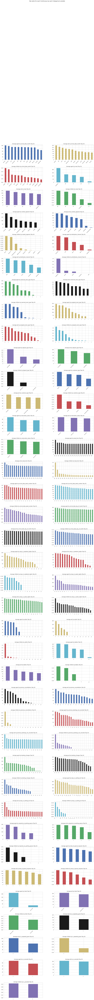

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

Could not draw wordcloud plot for country
Could not draw wordcloud plot for reservation_status_date
All Plots done
Time to run AutoViz = 111 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


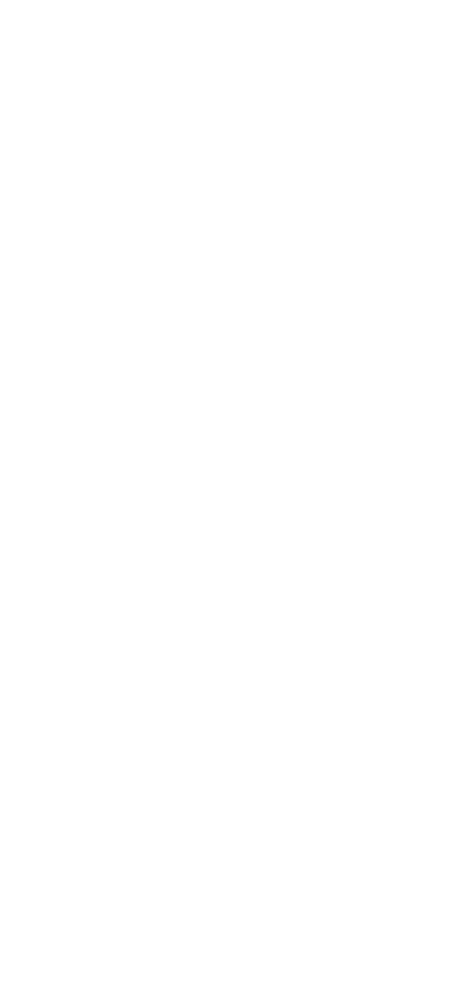

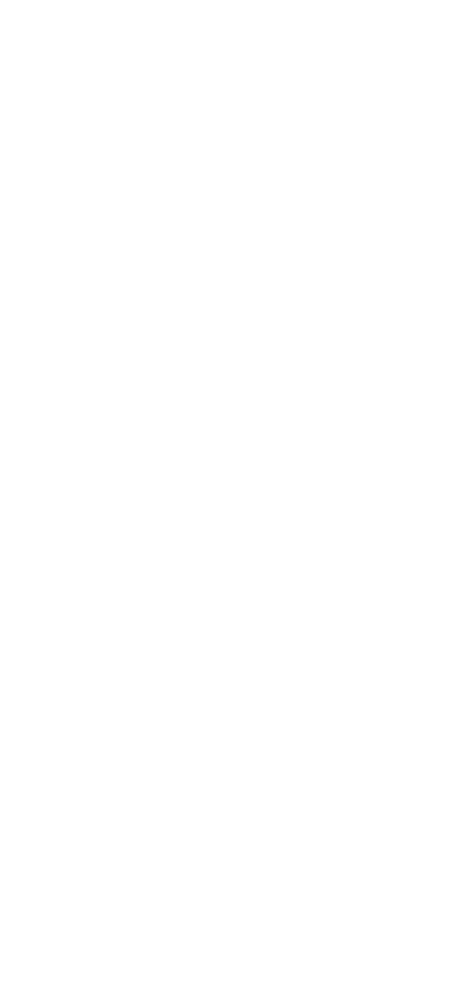

In [ ]:
from autoviz import AutoViz_Class
%matplotlib inline
AV = AutoViz_Class()

filename = "/content/hotel_bookings.csv"
target_variable = "is_canceled"

dft = AV.AutoViz(
    filename,
    sep=",",
    depVar=target_variable,
    dfte=None,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None
)

In [ ]:
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

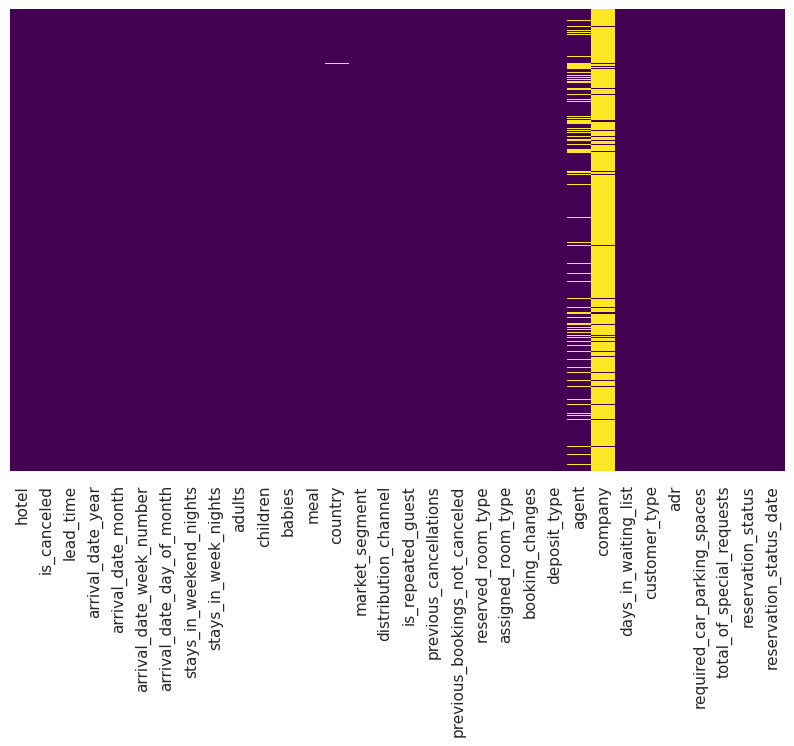

None

In [ ]:
# Create a heatmap of null values
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

# Display the heatmap
display(plt.show())

There are missing values

In [ ]:
df.isna().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [ ]:
df.duplicated().sum()

31994

There are null values in children,country,agent company and nan values also.There are duplicated values too.

In [ ]:
for column in df.columns:
    if df[column].duplicated().any():
        print(f"Column '{column}' has duplicates.")


Column 'hotel' has duplicates.
Column 'is_canceled' has duplicates.
Column 'lead_time' has duplicates.
Column 'arrival_date_year' has duplicates.
Column 'arrival_date_month' has duplicates.
Column 'arrival_date_week_number' has duplicates.
Column 'arrival_date_day_of_month' has duplicates.
Column 'stays_in_weekend_nights' has duplicates.
Column 'stays_in_week_nights' has duplicates.
Column 'adults' has duplicates.
Column 'children' has duplicates.
Column 'babies' has duplicates.
Column 'meal' has duplicates.
Column 'country' has duplicates.
Column 'market_segment' has duplicates.
Column 'distribution_channel' has duplicates.
Column 'is_repeated_guest' has duplicates.
Column 'previous_cancellations' has duplicates.
Column 'previous_bookings_not_canceled' has duplicates.
Column 'reserved_room_type' has duplicates.
Column 'assigned_room_type' has duplicates.
Column 'booking_changes' has duplicates.
Column 'deposit_type' has duplicates.
Column 'agent' has duplicates.
Column 'company' has d

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [ ]:
df['country'].value_counts()

PRT    48590
GBR    12129
FRA    10415
ESP     8568
DEU     7287
ITA     3766
IRL     3375
BEL     2342
BRA     2224
NLD     2104
USA     2097
CHE     1730
CN      1279
AUT     1263
SWE     1024
CHN      999
POL      919
ISR      669
RUS      632
NOR      607
ROU      500
FIN      447
DNK      435
AUS      426
AGO      362
LUX      287
MAR      259
TUR      248
HUN      230
ARG      214
JPN      197
CZE      171
IND      152
KOR      133
GRC      128
DZA      103
SRB      101
HRV      100
MEX       85
EST       83
IRN       83
LTU       81
ZAF       80
BGR       75
NZL       74
COL       71
UKR       68
MOZ       67
CHL       65
SVK       65
THA       59
SVN       57
ISL       57
LVA       55
ARE       51
CYP       51
TWN       51
SAU       48
PHL       40
TUN       39
SGP       39
IDN       35
NGA       34
EGY       32
URY       32
LBN       31
PER       29
HKG       29
MYS       28
ECU       27
VEN       26
BLR       26
CPV       24
GEO       22
JOR       21
KAZ       19
CRI       19

In [ ]:
df['agent'].value_counts()

9.0      31961
240.0    13922
1.0       7191
14.0      3640
7.0       3539
6.0       3290
250.0     2870
241.0     1721
28.0      1666
8.0       1514
3.0       1336
37.0      1230
19.0      1061
40.0      1039
314.0      927
21.0       875
229.0      786
242.0      780
83.0       696
29.0       683
171.0      607
12.0       578
85.0       554
20.0       540
96.0       537
243.0      514
30.0       484
134.0      482
298.0      472
27.0       450
15.0       402
26.0       401
11.0       395
22.0       382
56.0       375
273.0      349
177.0      347
86.0       338
58.0       335
5.0        330
119.0      304
196.0      301
34.0       294
44.0       292
138.0      287
315.0      284
38.0       274
10.0       260
236.0      247
16.0       246
17.0       241
115.0      225
251.0      220
68.0       211
42.0       211
191.0      198
175.0      195
195.0      193
154.0      193
156.0      190
168.0      184
152.0      183
208.0      173
143.0      172
326.0      165
2.0        162
31.0      

In [ ]:
df['company'].value_counts()

40.0     927
223.0    784
67.0     267
45.0     250
153.0    215
174.0    149
219.0    141
281.0    138
154.0    133
405.0    119
233.0    114
51.0      99
94.0      87
47.0      72
135.0     66
169.0     65
242.0     62
331.0     61
348.0     59
498.0     58
110.0     52
38.0      51
20.0      50
280.0     48
342.0     48
91.0      48
62.0      47
197.0     47
68.0      46
218.0     43
270.0     43
195.0     38
202.0     38
148.0     37
9.0       37
113.0     36
307.0     36
204.0     34
269.0     33
308.0     33
238.0     33
86.0      32
72.0      30
385.0     30
43.0      29
343.0     29
365.0     29
144.0     27
221.0     27
178.0     27
46.0      26
337.0     25
418.0     25
366.0     24
424.0     24
179.0     24
227.0     24
507.0     23
81.0      23
477.0     23
78.0      22
88.0      22
407.0     22
286.0     21
216.0     21
523.0     19
209.0     19
150.0     19
122.0     18
292.0     18
396.0     18
251.0     18
163.0     17
143.0     17
290.0     17
31.0      17
103.0     16

In [ ]:
df['children'].value_counts()

0.0     110796
1.0       4861
2.0       3652
3.0         76
10.0         1
Name: children, dtype: int64

In [ ]:
import pandas as pd

# List of columns to check for special characters
columns_to_check = df.columns

# Regular expression pattern for detecting special characters
special_char_pattern = r'[^a-zA-Z0-9\s.]'

# Check each column for special characters
for column in columns_to_check:
    has_special_chars = df[column].astype(str).str.contains(special_char_pattern).any()
    if has_special_chars:
        print(f"Column '{column}' contains special characters.")
    else:
        print(f"Column '{column}' does not contain special characters.")


Column 'hotel' does not contain special characters.
Column 'is_canceled' does not contain special characters.
Column 'lead_time' does not contain special characters.
Column 'arrival_date_year' does not contain special characters.
Column 'arrival_date_month' does not contain special characters.
Column 'arrival_date_week_number' does not contain special characters.
Column 'arrival_date_day_of_month' does not contain special characters.
Column 'stays_in_weekend_nights' does not contain special characters.
Column 'stays_in_week_nights' does not contain special characters.
Column 'adults' does not contain special characters.
Column 'children' does not contain special characters.
Column 'babies' does not contain special characters.
Column 'meal' does not contain special characters.
Column 'country' does not contain special characters.
Column 'market_segment' contains special characters.
Column 'distribution_channel' contains special characters.
Column 'is_repeated_guest' does not contain spe

In [ ]:
import pandas as pd

# Assuming 'df' is your DataFrame and 'country' is the column you want to check
special_chars_df = df[df['country'].str.contains('[^a-zA-Z0-9]', na=False)]

# Display rows with special characters
print(special_chars_df)


Empty DataFrame
Columns: [hotel, is_canceled, lead_time, arrival_date_year, arrival_date_month, arrival_date_week_number, arrival_date_day_of_month, stays_in_weekend_nights, stays_in_week_nights, adults, children, babies, meal, country, market_segment, distribution_channel, is_repeated_guest, previous_cancellations, previous_bookings_not_canceled, reserved_room_type, assigned_room_type, booking_changes, deposit_type, agent, company, days_in_waiting_list, customer_type, adr, required_car_parking_spaces, total_of_special_requests, reservation_status, reservation_status_date]
Index: []


**HANDLING MISSING VALUES**

---



In [ ]:
df['country'] = df['country'].fillna(df['country'].mode()[0])

**HANDLING MISSING VALUES FOR NUMERICAL DATATYPES**

---



In [ ]:
df['agent'] = df['agent'].fillna(df['agent'].median())

In [ ]:
df['company'] = df['company'].fillna(df['company'].median())

In [ ]:
df['children'] = df['children'].fillna(df['children'].median())

In [ ]:
df.isnull().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
company                           0
days_in_waiting_list              0
customer_type                     0
adr                         

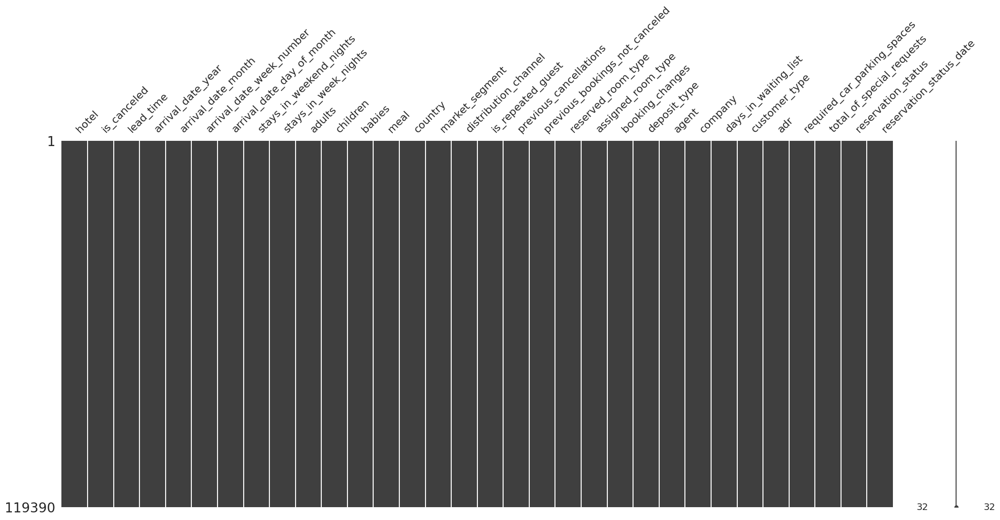

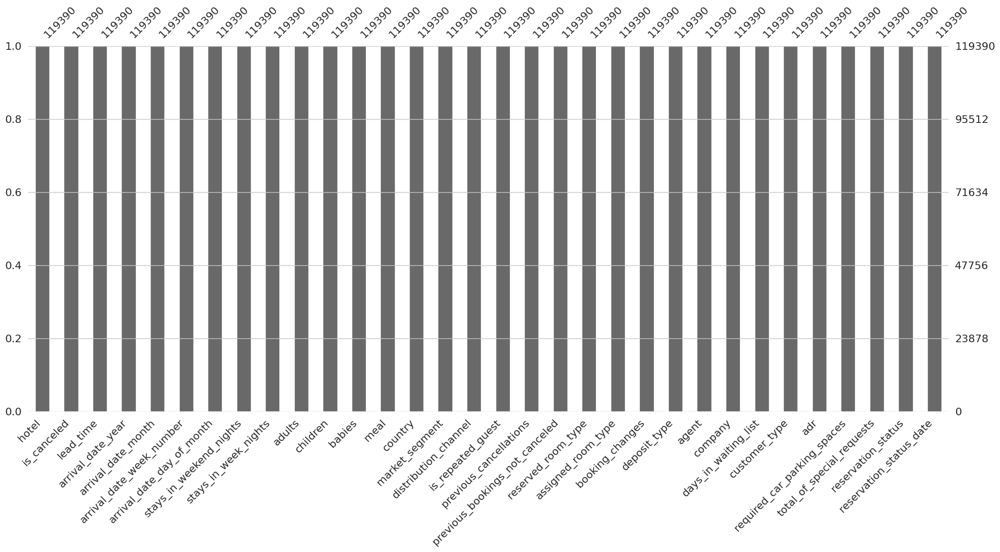

In [ ]:
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt

# Visualize missing values using the matrix plot
msno.matrix(df)
plt.show()

# Optionally, you can also use the bar plot
msno.bar(df)
plt.show()


Now there are no null values

In [ ]:
df.isna().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
company                           0
days_in_waiting_list              0
customer_type                     0
adr                         

In [ ]:
df.isnull().sum()/len(df)*100

hotel                             0.0
is_canceled                       0.0
lead_time                         0.0
arrival_date_year                 0.0
arrival_date_month                0.0
arrival_date_week_number          0.0
arrival_date_day_of_month         0.0
stays_in_weekend_nights           0.0
stays_in_week_nights              0.0
adults                            0.0
children                          0.0
babies                            0.0
meal                              0.0
country                           0.0
market_segment                    0.0
distribution_channel              0.0
is_repeated_guest                 0.0
previous_cancellations            0.0
previous_bookings_not_canceled    0.0
reserved_room_type                0.0
assigned_room_type                0.0
booking_changes                   0.0
deposit_type                      0.0
agent                             0.0
company                           0.0
days_in_waiting_list              0.0
customer_typ

In [ ]:
df.isna().any()

hotel                             False
is_canceled                       False
lead_time                         False
arrival_date_year                 False
arrival_date_month                False
arrival_date_week_number          False
arrival_date_day_of_month         False
stays_in_weekend_nights           False
stays_in_week_nights              False
adults                            False
children                          False
babies                            False
meal                              False
country                           False
market_segment                    False
distribution_channel              False
is_repeated_guest                 False
previous_cancellations            False
previous_bookings_not_canceled    False
reserved_room_type                False
assigned_room_type                False
booking_changes                   False
deposit_type                      False
agent                             False
company                           False


There are no NAN values too .

In [ ]:
df.duplicated().sum()

32013

Columns with duplicated values

---



In [ ]:
import pandas as pd

# Assuming 'df' is your DataFrame
duplicated_columns = df.columns[df.duplicated().any()]

# Display columns with duplicated values
print("Columns with Duplicated Values:", duplicated_columns)


Columns with Duplicated Values: [['hotel' 'is_canceled' 'lead_time' 'arrival_date_year'
  'arrival_date_month' 'arrival_date_week_number'
  'arrival_date_day_of_month' 'stays_in_weekend_nights'
  'stays_in_week_nights' 'adults' 'children' 'babies' 'meal' 'country'
  'market_segment' 'distribution_channel' 'is_repeated_guest'
  'previous_cancellations' 'previous_bookings_not_canceled'
  'reserved_room_type' 'assigned_room_type' 'booking_changes'
  'deposit_type' 'agent' 'company' 'days_in_waiting_list' 'customer_type'
  'adr' 'required_car_parking_spaces' 'total_of_special_requests'
  'reservation_status' 'reservation_status_date']]


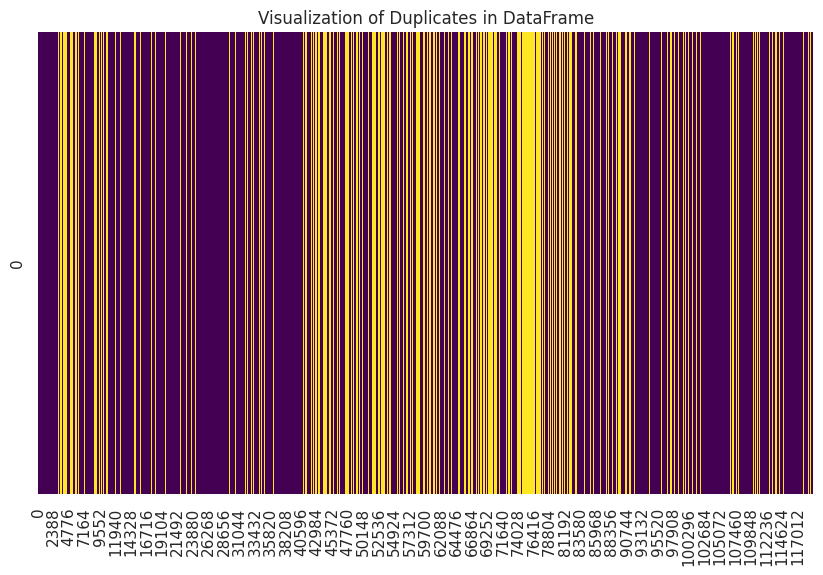

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
plt.figure(figsize=(10, 6))
sns.heatmap(df.duplicated().values.reshape(1, -1), cbar=False, cmap='viridis')

# Display the plot
# Display the plot
plt.title('Visualization of Duplicates in DataFrame')
plt.show()



There are duplicates.

**Drop duplicates**

---



In [ ]:
# Drop columns with duplicated values
df.drop(df[df.duplicated()].index, inplace=True)


In [ ]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,14.0,179.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,14.0,179.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.0,0,1,Check-Out,7/3/2015


In [ ]:
df.duplicated().sum()

0

In [ ]:
print(f'Duplicates in Hotel Booking data : {df.iloc[:,1:].duplicated().sum()},({np.round(100*df.iloc[:,1:].duplicated().sum()/len(df),1)}%)')

Duplicates in Hotel Booking data : 0,(0.0%)


Now there are no duplicated values in df.

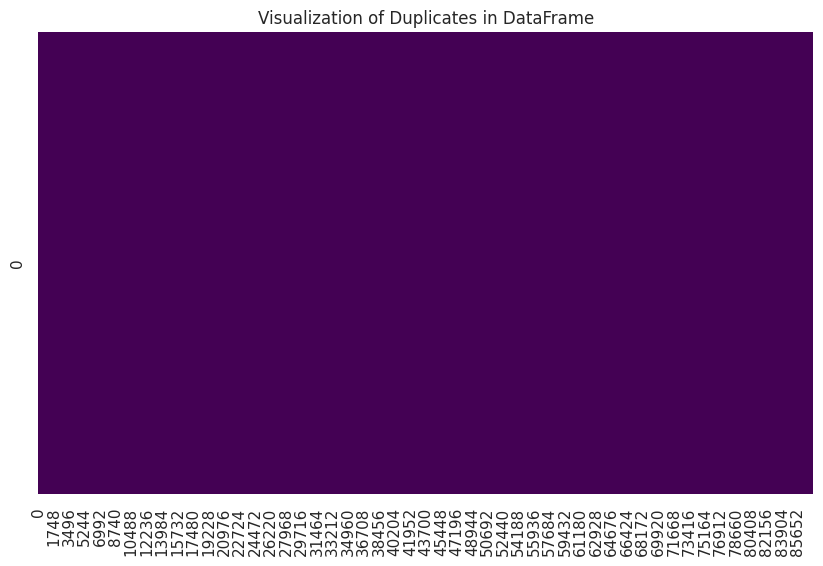

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
plt.figure(figsize=(10, 6))
sns.heatmap(df.duplicated().values.reshape(1, -1), cbar=False, cmap='viridis')

# Display the plot
# Display the plot
plt.title('Visualization of Duplicates in DataFrame')
plt.show()


Now all duplicates are cleaned.

In [ ]:
df.shape

(87377, 32)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 87377 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           87377 non-null  object 
 1   is_canceled                     87377 non-null  int64  
 2   lead_time                       87377 non-null  int64  
 3   arrival_date_year               87377 non-null  int64  
 4   arrival_date_month              87377 non-null  object 
 5   arrival_date_week_number        87377 non-null  int64  
 6   arrival_date_day_of_month       87377 non-null  int64  
 7   stays_in_weekend_nights         87377 non-null  int64  
 8   stays_in_week_nights            87377 non-null  int64  
 9   adults                          87377 non-null  int64  
 10  children                        87377 non-null  float64
 11  babies                          87377 non-null  int64  
 12  meal                           

In [ ]:
df.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

**Get Unique Values**

---



In [ ]:
# Get unique values for each column in the entire DataFrame
for col in df.columns:
    unique_values = df[col].unique()
    print(f"Unique values in {col}: {unique_values}")


Unique values in hotel: ['Resort Hotel' 'City Hotel']
Unique values in is_canceled: [0 1]
Unique values in lead_time: [342 737   7  13  14   0   9  85  75  23  35  68  18  37  12  72 127  78
  48  60  77  99 118  95  96  69  45  40  15  36  43  70  16 107  47 113
  90  50  93  76   3   1  10   5  17  51  71  63  62 101   2  81 368 364
 324  79  21 109 102   4  98  92  26  73 115  86  52  29  30  33  32   8
 100  44  80  97  64  39  34  27  82  94 110 111  84  66 104  28 258 112
  65  67  55  88  54 292  83 105 280 394  24 103 366 249  22  91  11 108
 106  31  87  41 304 117  59  53  58 116  42 321  38  56  49 317   6  57
  19  25 315 123  46  89  61 312 299 130  74 298 119  20 286 136 129 124
 327 131 460 140 114 139 122 137 126 120 128 135 150 143 151 132 125 157
 147 138 156 164 346 159 160 161 333 381 149 154 297 163 314 155 323 340
 356 142 328 144 336 248 302 175 344 382 146 170 166 338 167 310 148 165
 172 171 145 121 178 305 173 152 354 347 158 185 349 183 352 177 200 192
 361 2

In [ ]:
import pandas as pd

# Assuming 'df' is your DataFrame
unique_columns = []

for col in df.columns:
    if df[col].nunique() == len(df):
        unique_columns.append(col)

print("Columns with all unique values:", unique_columns)


Columns with all unique values: []


In [ ]:
df.nunique().any()

True

In [ ]:
if df.nunique().any():
    print("There is at least one column with non-unique values.")
else:
    print("All columns have only one unique value.")


There is at least one column with non-unique values.


In [ ]:
non_unique_columns = df.columns[df.nunique() < len(df)]
print("Columns with non-unique values:", non_unique_columns)


Columns with non-unique values: Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')


In [ ]:
unique_columns = df.columns[df.nunique() == len(df)]
print("Columns with all unique values:", unique_columns)


Columns with all unique values: Index([], dtype='object')


In [ ]:
unique_columns = df.columns[df.nunique() == len(df)]

for col in unique_columns:
    unique_values = df[col].unique()
print(f"Column '{col}' has all unique values: {unique_values}")


Column 'reservation_status_date' has all unique values: ['7/1/2015' '7/2/2015' '7/3/2015' '5/6/2015' '4/22/2015' '6/23/2015'
 '7/5/2015' '7/6/2015' '7/7/2015' '7/8/2015' '5/11/2015' '7/15/2015'
 '7/16/2015' '5/29/2015' '5/19/2015' '6/19/2015' '5/23/2015' '5/18/2015'
 '7/9/2015' '6/2/2015' '7/13/2015' '7/4/2015' '6/29/2015' '6/16/2015'
 '6/18/2015' '6/12/2015' '6/9/2015' '5/26/2015' '7/11/2015' '7/12/2015'
 '7/17/2015' '4/15/2015' '5/13/2015' '7/10/2015' '5/20/2015' '5/12/2015'
 '7/14/2015' '6/17/2015' '5/1/2015' '3/30/2015' '7/19/2015' '6/3/2015'
 '6/26/2015' '5/14/2015' '7/20/2015' '5/7/2015' '5/28/2015' '4/13/2015'
 '3/25/2015' '7/21/2015' '6/27/2015' '7/18/2015' '7/23/2015' '6/8/2015'
 '6/22/2015' '6/24/2015' '3/5/2015' '6/1/2015' '4/24/2015' '7/22/2015'
 '5/27/2015' '4/6/2015' '4/11/2015' '7/25/2015' '7/28/2015' '7/29/2015'
 '6/25/2015' '7/24/2015' '6/5/2015' '6/30/2015' '6/13/2015' '6/11/2015'
 '7/30/2015' '7/27/2015' '4/29/2015' '6/4/2015' '7/26/2015' '8/1/2015'
 '8/2/2015' '6/15

In [ ]:
list_cols = ["children", "adults", "babies"]

for i in list_cols:
    print(f"{i} has unique values as {df[i].unique()}")

children has unique values as [ 0.  1.  2. 10.  3.]
adults has unique values as [ 2  1  3  4 40 26 50 27 55  0 20  6  5 10]
babies has unique values as [ 0  1  2 10  9]


**Filter condition**

---



In [ ]:
# Define the condition for filtering
filter_condition = (df['children'] == 0) & (df['adults'] == 0) & (df['babies'] == 0)

# Apply the filter to obtain the cleaned data
final_data = df[~filter_condition]

# Display information about the original and cleaned data
print("Original DataFrame shape:", df.shape)
print("Cleaned DataFrame shape:", final_data.shape)


Original DataFrame shape: (87377, 32)
Cleaned DataFrame shape: (87211, 32)


The condition children == 0 & adults == 0 & babies == 0 is checking for rows where the number of children, adults, and babies are all equal to 0. The ~ (tilde) operator is used to negate the condition, meaning it selects rows where the condition is not true.

# **Replace df as Final_Data**

---



In [ ]:
#df= (df['children'] == 0) & (df['adults'] == 0) & (df['babies'] == 0)

In [ ]:
filter_condition

0         False
1         False
2         False
3         False
4         False
          ...  
119385    False
119386    False
119387    False
119388    False
119389    False
Length: 87377, dtype: bool

In [ ]:
df.shape

(87377, 32)

In [ ]:
final_data.shape

(87211, 32)

In [ ]:
final_data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,14.0,179.0,0,Transient,0.00,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,14.0,179.0,0,Transient,0.00,0,0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.00,0,0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.00,0,0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.00,0,1,Check-Out,7/3/2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,179.0,0,Transient,96.14,0,0,Check-Out,9/6/2017
119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,179.0,0,Transient,225.43,0,2,Check-Out,9/7/2017
119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,179.0,0,Transient,157.71,0,4,Check-Out,9/7/2017
119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,179.0,0,Transient,104.40,0,0,Check-Out,9/7/2017


# **EDA**

---



In [ ]:
final_data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,14.0,179.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,14.0,179.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.0,0,1,Check-Out,7/3/2015


In [ ]:
# Display descriptive statistics of the DataFrame
final_data.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000
mean,0.275286,79.985552,2016.210329,26.836867,15.815493,1.004736,2.624176,1.879476,0.138927,0.010847,0.038573,0.030409,0.184094,0.268544,83.039192,179.236771,0.746454,106.525949,0.084324,0.698983
std,0.446661,86.061875,0.686086,13.668065,8.835142,1.027447,2.039929,0.621705,0.456310,0.113716,0.192576,0.369384,1.733220,0.710695,108.634866,31.967401,10.002084,54.882301,0.281687,0.832047
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,11.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,179.000000,0.000000,72.250000,0.000000,0.000000
50%,0.000000,49.000000,2016.000000,27.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,98.250000,0.000000,0.000000
75%,1.000000,125.000000,2017.000000,37.000000,23.000000,2.000000,4.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,240.000000,179.000000,0.000000,134.100000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,18.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


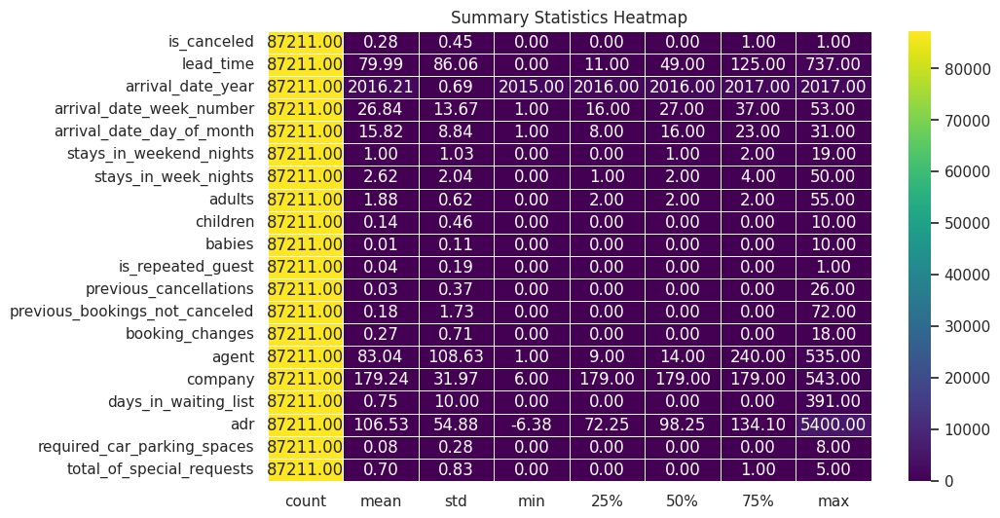

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Calculate the summary statistics
summary_stats = final_data.describe().T

# Set the color palette to "viridis"
cmap = sns.color_palette("viridis", as_cmap=True)

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(summary_stats, annot=True, cmap=cmap, fmt=".2f", linewidths=.5)
plt.title('Summary Statistics Heatmap')
plt.show()


In [ ]:
# Customize the appearance using a color palette
styled_summary1 = final_data.describe().style.background_gradient(cmap="Set2")

# Display the styled summary
styled_summary1

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000,87211.000000
mean,0.275286,79.985552,2016.210329,26.836867,15.815493,1.004736,2.624176,1.879476,0.138927,0.010847,0.038573,0.030409,0.184094,0.268544,83.039192,179.236771,0.746454,106.525949,0.084324,0.698983
std,0.446661,86.061875,0.686086,13.668065,8.835142,1.027447,2.039929,0.621705,0.456310,0.113716,0.192576,0.369384,1.733220,0.710695,108.634866,31.967401,10.002084,54.882301,0.281687,0.832047
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,11.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,179.000000,0.000000,72.250000,0.000000,0.000000
50%,0.000000,49.000000,2016.000000,27.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,98.250000,0.000000,0.000000
75%,1.000000,125.000000,2017.000000,37.000000,23.000000,2.000000,4.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,240.000000,179.000000,0.000000,134.100000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,18.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [ ]:
from pylab import rcParams
rcParams['figure.figsize'] = 15,12
LABELS = ['Not-Canceled', 'Canceled']

<Axes: >

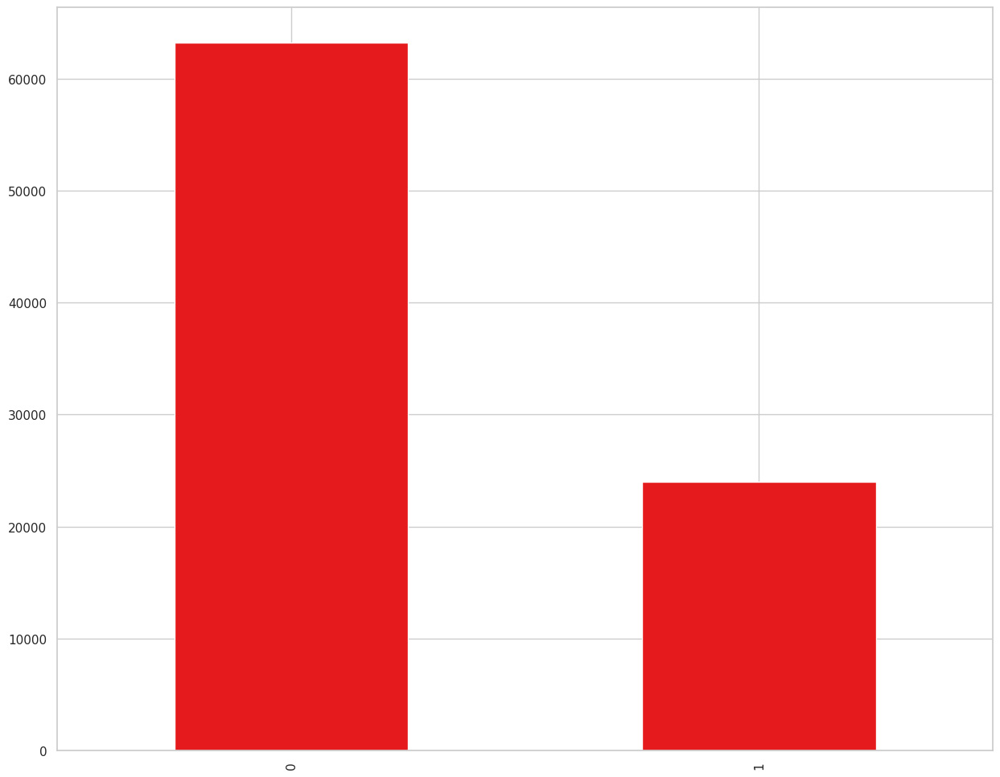

In [ ]:
final_data['is_canceled'].value_counts().plot(kind = 'bar')

In [ ]:
final_data['is_canceled'].value_counts()

0    63203
1    24008
Name: is_canceled, dtype: int64

In [ ]:
import plotly.express as px

# Assuming 'is_canceled' is a column in df
class_x = final_data['is_canceled'].value_counts().keys().tolist()
class_y = final_data['is_canceled'].value_counts().values.tolist()

fig = px.pie(final_data, labels=class_x, values=class_y,
             color_discrete_sequence=['grey', 'red'], hole=0.6)

fig.update_layout(title="Hotel Booking Canceled and Not-Canceled", template="plotly_dark")
fig.show()


In [ ]:
import plotly.express as px
%matplotlib inline

# Assuming 'is_canceled' is a column in df
canceled_counts = final_data['is_canceled'].value_counts()
class_x = canceled_counts.keys().tolist()
class_y = canceled_counts.values.tolist()

# Calculate percentages
total_bookings = len(final_data)
percentage_canceled = (canceled_counts[1] / total_bookings) * 100
percentage_non_canceled = (canceled_counts[0] / total_bookings) * 100

# Map numeric values to custom labels
label_mapping = {0: 'Non-Canceled', 1: 'Canceled'}
class_x_labels = [label_mapping[val] for val in class_x]

fig = px.pie(final_data, labels=class_x_labels, values=class_y,
             color_discrete_sequence=['grey', 'red'], hole=0.6,
             category_orders={"labels": ["Non-Canceled", "Canceled"]},
             title=f"Hotel Booking\nCanceled: {percentage_canceled:.2f}%, Non-Canceled: {percentage_non_canceled:.2f}%")

fig.update_layout(template="plotly_dark")
fig.show()


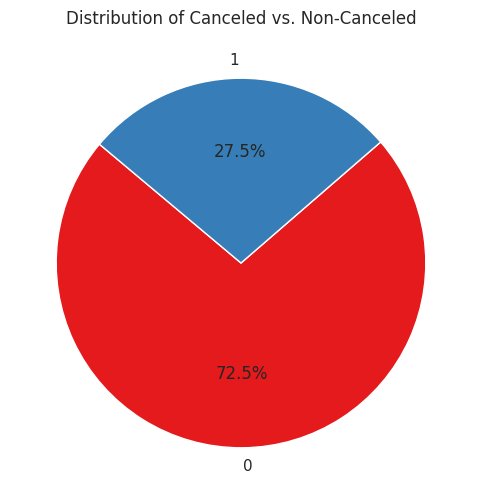

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(6, 6))

# Create the pie chart
plt.pie(final_data['is_canceled'].value_counts(), labels=final_data['is_canceled'].value_counts().index, autopct='%1.1f%%', startangle=140)

# Set the title
plt.title('Distribution of Canceled vs. Non-Canceled')

# Show the pie chart
plt.show()


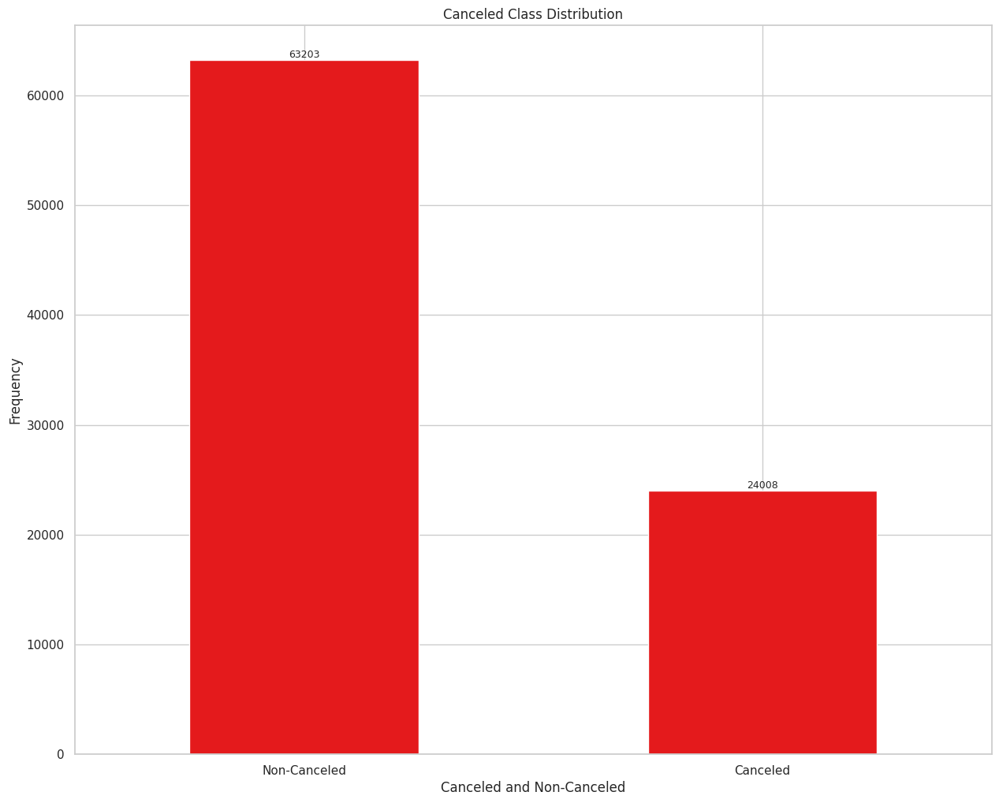

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming LABELS is defined somewhere in your code
LABELS = ['Non-Canceled', 'Canceled']

# Get the count of each class
class_count = pd.value_counts(final_data['is_canceled'], sort=True)

# Plot the bar chart
ax = class_count.plot(kind='bar', rot=0)

# Display the count on top of each bar
for i, v in enumerate(class_count):
    ax.text(i, v + 20, str(v), ha='center', va='bottom', fontsize=9)

plt.title("Canceled Class Distribution")
plt.xticks(range(2), LABELS)
plt.xlabel("Canceled and Non-Canceled")
plt.ylabel("Frequency")
plt.show()


**Canceled and Non Canceled count**

---



In [ ]:
Canceled = final_data[final_data['is_canceled'] == 1]
Non_Canceled = final_data[final_data['is_canceled'] == 0]
print(Canceled.shape, Non_Canceled.shape)


(24008, 32) (63203, 32)


Percentage of Canceled

---



In [ ]:
24008/(24024+63203)

0.27523587879899575

**Percentage of Canceled and Non-Canceled count in Hotel Bookings**

---



In [ ]:
canceled = final_data[final_data['is_canceled'] == 1]
non_canceled = final_data[final_data['is_canceled'] == 0]

percentage_canceled = (canceled.shape[0] / final_data.shape[0]) * 100
percentage_non_canceled = (non_canceled.shape[0] / final_data.shape[0]) * 100

print(f"Percentage of Canceled Bookings: {percentage_canceled:.2f}%")
print(f"Percentage of Non-Canceled Bookings: {percentage_non_canceled:.2f}%")


Percentage of Canceled Bookings: 27.53%
Percentage of Non-Canceled Bookings: 72.47%


In [ ]:
final_data.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

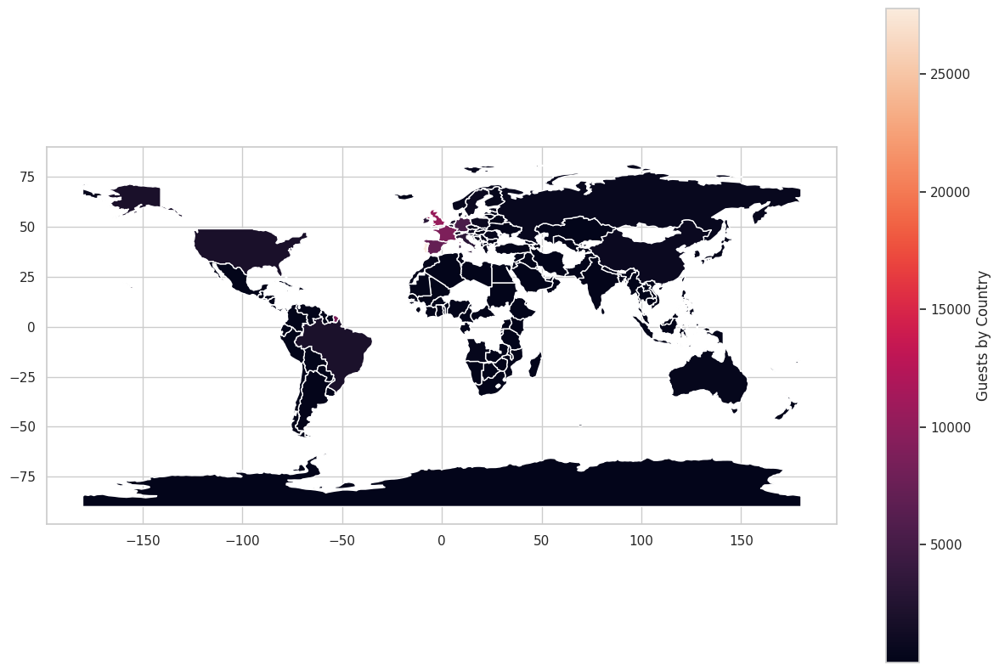

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming 'world' is a geopandas DataFrame with world geometries
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Merge world geometries with guest count by country
guests_by_country = final_data.groupby('country').size().reset_index(name='guest_count')
world = world.merge(guests_by_country, left_on='iso_a3', right_on='country', how='left')

# Plot a choropleth map
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
world.plot(column='guest_count', ax=ax, legend=True, legend_kwds={'label': "Guests by Country"})
plt.show()


In [ ]:
import plotly.express as px

# Assuming 'final_data' is your DataFrame
guests_by_country = final_data['country'].value_counts().reset_index(name='guest_count')

fig = px.choropleth(guests_by_country,
                    locations='index',
                    locationmode='country names',
                    color='guest_count',
                    color_continuous_scale="Viridis",
                    title='Guests by Country',
                    labels={'guest_count': 'Guest Count'}
                    )

fig.show()


In [ ]:
import folium
import pandas as pd
%matplotlib inline

# Assuming 'final_data' is your DataFrame
guests_by_country = final_data['country'].value_counts().reset_index(name='guest_count')

# Create a Folium map centered at a specific location (e.g., world center)
m = folium.Map(location=[0, 0], zoom_start=2)

# Create a choropleth map using Folium
folium.Choropleth(
    geo_data='https://raw.githubusercontent.com/johan/world.geo.json/master/countries.geo.json',  # GeoJSON file for world countries
    name='choropleth',
    data=guests_by_country,
    columns=['index', 'guest_count'],  # 'index' is the column containing country names
    key_on='feature.properties.name',  # GeoJSON property for country names
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Guests by Country',
).add_to(m)

# Display the map
m.save('guests_choropleth_map.html')


# **Where do the Guests come from?(Spatial Analysis)**

---



In [ ]:
final_data[final_data['is_canceled'] == 0]['country'].value_counts().reset_index()

,index,country
0,PRT,17973
1,GBR,8440
2,FRA,7091
3,ESP,5382
4,DEU,4332
5,IRL,2347
6,ITA,1986
7,BEL,1670
8,NLD,1560
9,USA,1412


we are displaying the values of people from counytries where they have not cancelled booking.In next line we are giving it a name as country wise data .We rename the index as country and the next column country as no of guests since we are taking their count from each country.

In [ ]:
country_wise_data =  final_data[final_data['is_canceled'] == 0]['country'].value_counts().reset_index()


country_wise_data.columns = ["Country", "No.of guests"]
print(country_wise_data)

    Country  No.of guests
0      PRT       17973   
1      GBR        8440   
2      FRA        7091   
3      ESP        5382   
4      DEU        4332   
5      IRL        2347   
6      ITA        1986   
7      BEL        1670   
8      NLD        1560   
9      USA        1412   
10     BRA        1266   
11     CHE        1182   
12      CN         868   
13     AUT         777   
14     SWE         656   
15     POL         600   
16     CHN         424   
17     NOR         370   
18     FIN         357   
19     ROU         340   
20     RUS         337   
21     DNK         293   
22     AUS         286   
23     ISR         270   
24     JPN         158   
25     LUX         158   
26     ARG         152   
27     AGO         149   
28     HUN         137   
29     MAR         128   
30     TUR         116   
31     IND         108   
32     CZE         103   
33     GRC          84   
34     KOR          76   
35     HRV          68   
36     LTU          66   
37     MEX  

In [ ]:
"""
country_wise_data = final_data[final_data['is_canceled'] == 0]['country'].value_counts().reset_index()
country_wise_data.columns = ["Country", "No. of Guests"]

# Display the DataFrame as a string
print(country_wise_data.to_string(index=False))
"""

'\ncountry_wise_data = final_data[final_data[\'is_canceled\'] == 0][\'country\'].value_counts().reset_index()\ncountry_wise_data.columns = ["Country", "No. of Guests"]\n\n# Display the DataFrame as a string\nprint(country_wise_data.to_string(index=False))\n'

In [ ]:
import plotly.express as px

In [ ]:
map_guests = px.choropleth(country_wise_data, locations = country_wise_data['Country'],
                           color = country_wise_data["No.of guests"],
                           hover_name = country_wise_data['Country'],
                           title = "Home country of guests"
                          )

map_guests.show()

In [ ]:
import folium
from folium.plugins import MarkerCluster

# Assuming 'country_wise_data' is your DataFrame
m = folium.Map(location=[0, 0], zoom_start=2)

# Create a choropleth map using Folium
folium.Choropleth(
    geo_data='https://raw.githubusercontent.com/johan/world.geo.json/master/countries.geo.json',  # GeoJSON file for world countries
    data=country_wise_data,
    columns=['Country', 'No.of guests'],
    key_on='feature.properties.name',  # GeoJSON property for country names
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of Guests',
).add_to(m)

# Display the map
m.save('guests_choropleth_map_folium.html')


In [ ]:
final_data.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

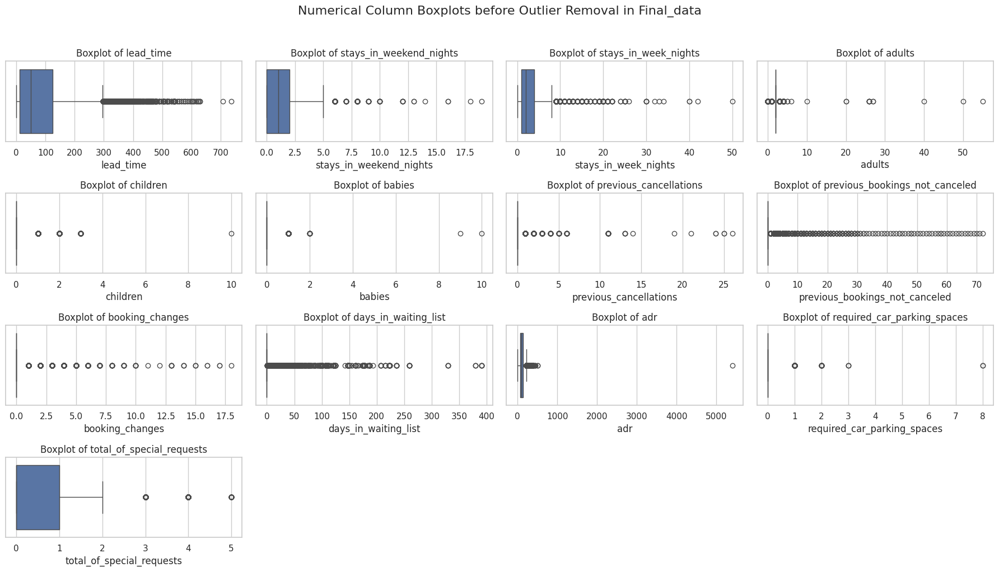

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'final_data' is your DataFrame
numerical_columns_outlier = ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies',
                      'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list',
                      'adr', 'required_car_parking_spaces', 'total_of_special_requests']

# Set the style of seaborn for better visualization
sns.set(style="whitegrid")

# Create boxplots for each numerical column
plt.figure(figsize=(18, 10))
for i, column in enumerate(numerical_columns_outlier, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=final_data[column], orient='vertical')
    plt.title(f'Boxplot of {column}')

# Set the main title for the entire plot
plt.suptitle("Numerical Column Boxplots before Outlier Removal in Final_data", y=1.02, fontsize=16)


plt.tight_layout()
plt.show()


# **OUTLIER REMOVAL FROM final_data**

---



In [ ]:
# Define a function to cap outliers in a column
def cap_outliers(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Cap values below the lower bound
    column[column < lower_bound] = lower_bound

    # Cap values above the upper bound
    column[column > upper_bound] = upper_bound

# Apply outlier treatment to all numerical columns
for column in numerical_columns_outlier:
    cap_outliers(final_data[column])

# Display the modified DataFrame
print("DataFrame after outlier treatment:")
final_data


DataFrame after outlier treatment:


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015
1,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.00,0,1.0,Check-Out,7/3/2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5.0,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,179.0,0,Transient,96.14,0,0.0,Check-Out,9/6/2017
119386,City Hotel,0,102,2017,August,35,31,2,5.0,2,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,179.0,0,Transient,225.43,0,2.0,Check-Out,9/7/2017
119387,City Hotel,0,34,2017,August,35,31,2,5.0,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,179.0,0,Transient,157.71,0,2.5,Check-Out,9/7/2017
119388,City Hotel,0,109,2017,August,35,31,2,5.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,179.0,0,Transient,104.40,0,0.0,Check-Out,9/7/2017


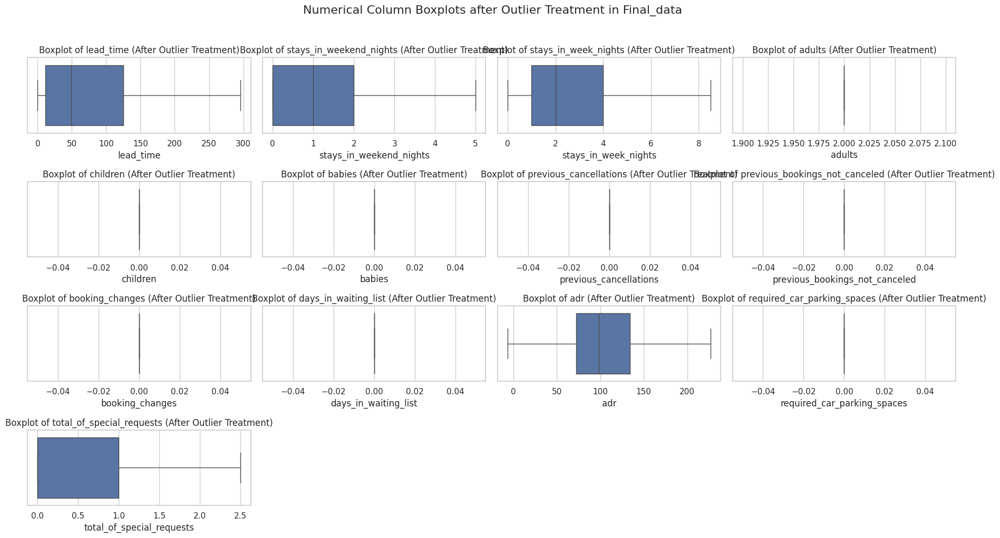

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of seaborn for better visualization
sns.set(style="whitegrid")

# Create boxplots for each numerical column in final_data
plt.figure(figsize=(18, 10))
for i, column in enumerate(numerical_columns_outlier, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=final_data[column], orient='vertical')
    plt.title(f'Boxplot of {column} (After Outlier Treatment)')

# Set the main title for the entire plot
plt.suptitle("Numerical Column Boxplots after Outlier Treatment in Final_data", y=1.02, fontsize=16)

plt.tight_layout()
plt.show()


In [ ]:
final_data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015
1,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.00,0,1.0,Check-Out,7/3/2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5.0,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,179.0,0,Transient,96.14,0,0.0,Check-Out,9/6/2017
119386,City Hotel,0,102,2017,August,35,31,2,5.0,2,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,179.0,0,Transient,225.43,0,2.0,Check-Out,9/7/2017
119387,City Hotel,0,34,2017,August,35,31,2,5.0,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,179.0,0,Transient,157.71,0,2.5,Check-Out,9/7/2017
119388,City Hotel,0,109,2017,August,35,31,2,5.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,179.0,0,Transient,104.40,0,0.0,Check-Out,9/7/2017


# **How much Guest pay for a Room per night?**

---



In [ ]:
final_data["hotel"].unique()

array(['Resort Hotel', 'City Hotel'], dtype=object)

we are taking unique values from hotel that is which all hotels are there involved.We got Resort Hotel and City Hotel.

In [ ]:
final_data.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [ ]:
import pandas as pd

# Assuming final_data is your DataFrame
resort_prices = final_data[final_data['hotel'] == 'Resort Hotel']['adr']
city_prices = final_data[final_data['hotel'] == 'City Hotel']['adr']

# Descriptive statistics
print("Resort Hotel Prices:")
print(resort_prices.describe())

print("\nCity Hotel Prices:")
print(city_prices.describe())


Resort Hotel Prices:
count    33937.000000
mean        97.276987
std         58.977688
min         -6.380000
25%         51.670000
50%         79.590000
75%        134.100000
max        226.875000
Name: adr, dtype: float64

City Hotel Prices:
count    53274.000000
mean       110.785931
std         40.602085
min          0.000000
25%         84.150000
50%        105.300000
75%        134.100000
max        226.875000
Name: adr, dtype: float64


We are considering all customers that are not cancelled so we create a new name 'data' where only customers are not cancelled.

In [ ]:
data = final_data[final_data["is_canceled"] == 0]

'adr is the room rate per person per night.We are taking reserved_room_type since rooms are reserved for not cancelled and to know the price of differnt rooms for both the hotels.So x is room types and y is the price of room per night and hue is the hotel classification on new data 'data' where we take only customers that has not cancelled booking.
We gave the titlt to boxplot as 'Price of room types per night per person' with size of title as 16 and for x axis instead of 'reserved_type' we gave title s 'Room type' and y axis as 'Price ' instead of 'adr',legend is the classification of hotel names 'Resort hotel and city hotel',y_lim is from 0 to 600 since we can see outliers beyond 500.

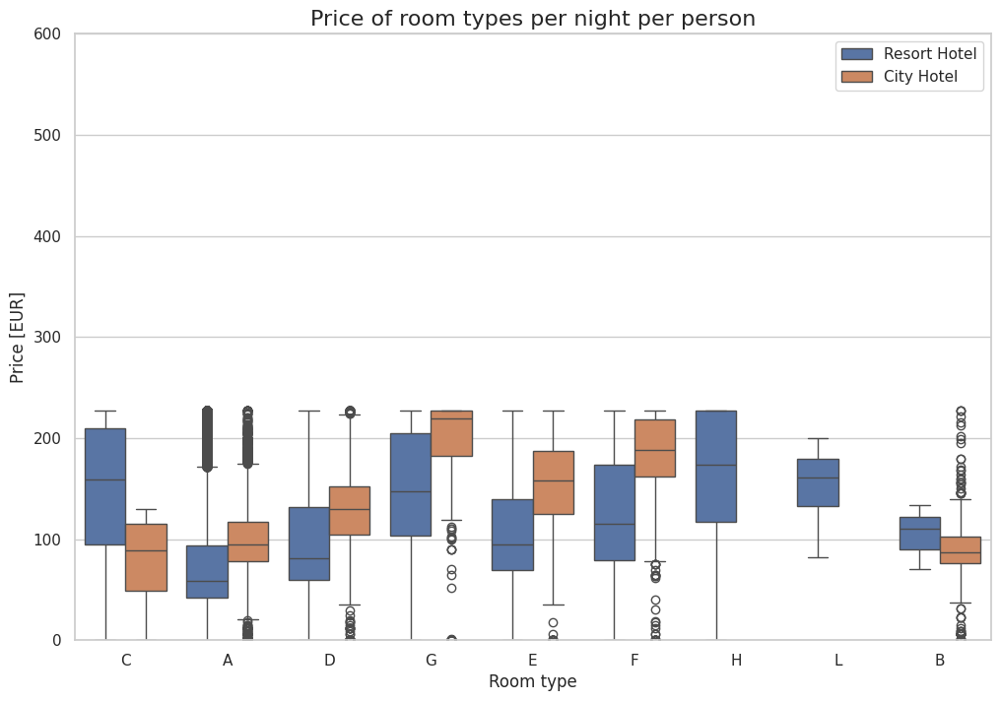

In [ ]:
#boxplot
plt.figure(figsize = (12,8)) #default figure size

sns.boxplot(x = "reserved_room_type",
           y = "adr",
           hue = "hotel", data = data)#it is the classification of hotel based on new data 'data' where people not cancelled

plt.title("Price of room types per night per person", fontsize = 16)
plt.xlabel("Room type")
plt.ylabel("Price [EUR]")
plt.legend(loc = "upper right")
plt.ylim(0,600)
plt.show()


Here we can see for Resort hotel which is blue the central median is higher that is the price is higher(H>150,C approx 150).A(~50) and B(~110) has lower median Price in Resort hotel(see the central median).That is If we want to book hotel with Economical low price we can book A and B in Resort hotels.To book hotels at higher price go with C and H in resort hotels.
IN city hotel orangish shade Higher price are for G ,F,E etc.
city hotel with G and F is more expensive.

In [ ]:
data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015
1,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.00,0,1.0,Check-Out,7/3/2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5.0,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,179.0,0,Transient,96.14,0,0.0,Check-Out,9/6/2017
119386,City Hotel,0,102,2017,August,35,31,2,5.0,2,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,179.0,0,Transient,225.43,0,2.0,Check-Out,9/7/2017
119387,City Hotel,0,34,2017,August,35,31,2,5.0,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,179.0,0,Transient,157.71,0,2.5,Check-Out,9/7/2017
119388,City Hotel,0,109,2017,August,35,31,2,5.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,179.0,0,Transient,104.40,0,0.0,Check-Out,9/7/2017


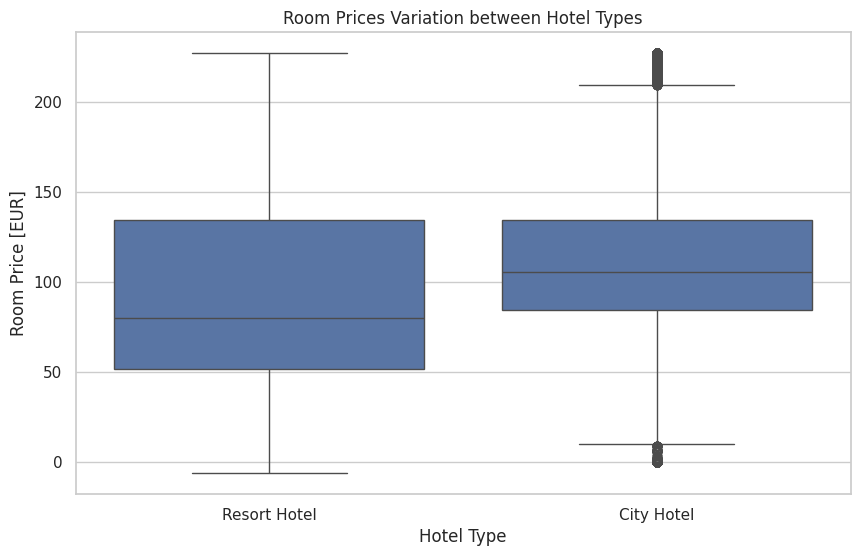

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(x='hotel', y='adr', data=final_data)
plt.title('Room Prices Variation between Hotel Types')
plt.xlabel('Hotel Type')
plt.ylabel('Room Price [EUR]')
plt.show()


**T-Test or Mann-Whitney U Test:**

---



In [ ]:
from scipy.stats import ttest_ind, mannwhitneyu

# T-Test
t_stat, p_value = ttest_ind(resort_prices, city_prices)
print(f'T-Test: t-statistic = {t_stat}, p-value = {p_value}')

# Mann-Whitney U Test
u_stat, mw_p_value = mannwhitneyu(resort_prices, city_prices)
print(f'Mann-Whitney U Test: U-statistic = {u_stat}, p-value = {mw_p_value}')


T-Test: t-statistic = -40.03322780048082, p-value = 0.0
Mann-Whitney U Test: U-statistic = 673076555.5, p-value = 0.0


In [ ]:
average_daily_rate =final_data['adr'].mean()
print("Average Daily Rate (ADR):", average_daily_rate)


Average Daily Rate (ADR): 105.5291048147596


SEASONAL ADR

---



In [ ]:
final_data.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [ ]:
# Assuming you have a column 'arrival_date_month' with month names
month_to_season = {
    'January': 'Winter',
    'February': 'Winter',
    'March': 'Spring',
    'April': 'Spring',
    'May': 'Spring',
    'June': 'Summer',
    'July': 'Summer',
    'August': 'Summer',
    'September': 'Fall',
    'October': 'Fall',
    'November': 'Fall',
    'December': 'Winter'
}

# Create a new 'season' column based on 'arrival_date_month'
final_data['season'] = final_data['arrival_date_month'].map(month_to_season)

# Now you can perform the seasonal analysis
seasonal_adr =final_data.groupby(['season', 'hotel'])['adr'].mean().reset_index()


Grouping ADR by seasons (e.g., spring, summer, fall, winter) and analyze how room prices vary across different seasons.

In [ ]:
seasonal_adr


,season,hotel,adr
0,Fall,City Hotel,107.027292
1,Fall,Resort Hotel,72.063258
2,Spring,City Hotel,113.370626
3,Spring,Resort Hotel,72.895612
4,Summer,City Hotel,122.566878
5,Summer,Resort Hotel,153.394751
6,Winter,City Hotel,89.230539
7,Winter,Resort Hotel,55.909858


Room Type Analysis:

---



In [ ]:
room_type_adr = final_data.groupby(['reserved_room_type', 'hotel'])['adr'].mean().reset_index()


In [ ]:
room_type_adr

,reserved_room_type,hotel,adr
0,A,City Hotel,99.049998
1,A,Resort Hotel,78.416072
2,B,City Hotel,90.372231
3,B,Resort Hotel,104.666667
4,C,City Hotel,92.057692
5,C,Resort Hotel,155.402320
6,D,City Hotel,132.355839
7,D,Resort Hotel,104.442729
8,E,City Hotel,157.181960
9,E,Resort Hotel,114.018741


Investigate how ADR varies for different room types.

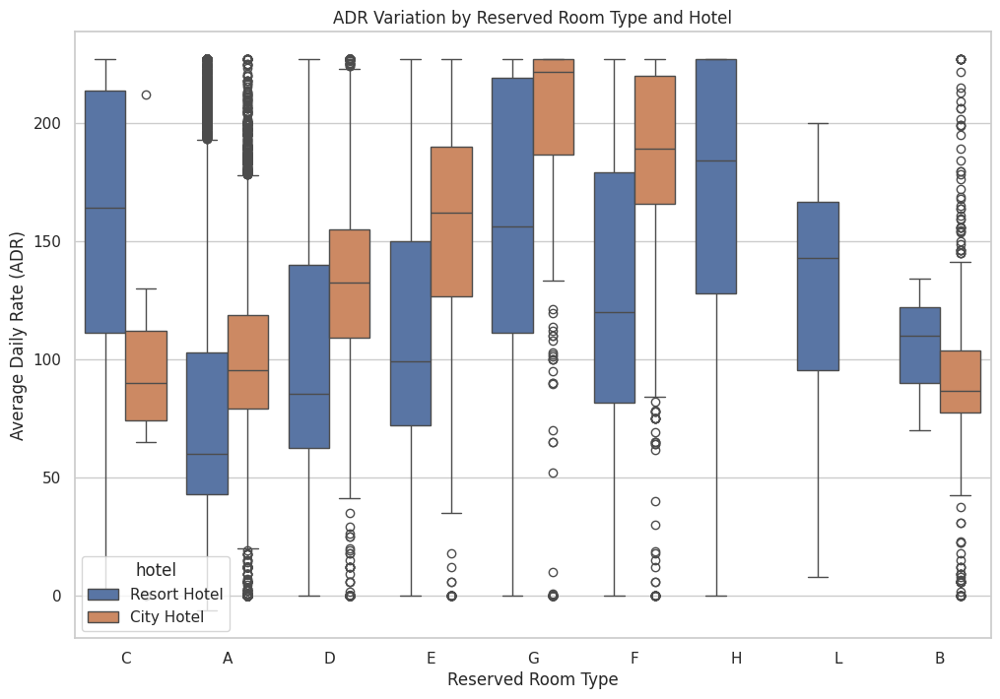

In [ ]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='reserved_room_type', y='adr', hue='hotel', data=final_data)
plt.title('ADR Variation by Reserved Room Type and Hotel')
plt.xlabel('Reserved Room Type')
plt.ylabel('Average Daily Rate (ADR)')
plt.show()


**Customer Segment Analysis:**

---



In [ ]:
segment_adr = final_data.groupby(['customer_type', 'hotel'])['adr'].mean().reset_index()


Explore ADR based on customer segments (e.g., transient, group, contract).

In [ ]:
segment_adr

,customer_type,hotel,adr
0,Contract,City Hotel,107.838667
1,Contract,Resort Hotel,79.692419
2,Group,City Hotel,92.755632
3,Group,Resort Hotel,75.376415
4,Transient,City Hotel,113.741122
5,Transient,Resort Hotel,101.750468
6,Transient-Party,City Hotel,93.340487
7,Transient-Party,Resort Hotel,78.661200


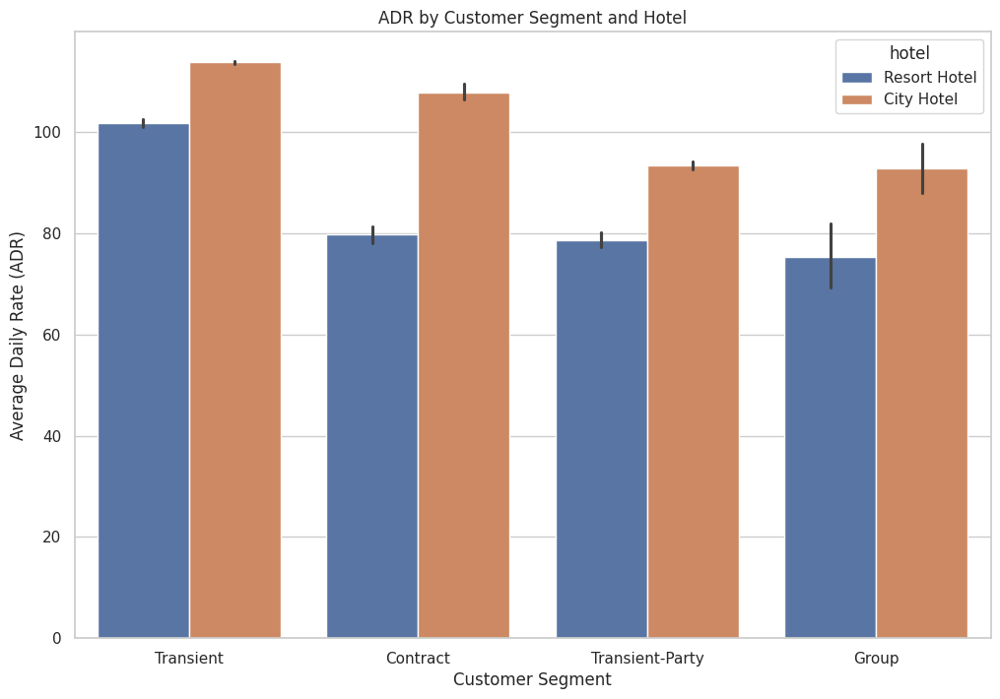

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(x='customer_type', y='adr', hue='hotel', data=final_data)
plt.title('ADR by Customer Segment and Hotel')
plt.xlabel('Customer Segment')
plt.ylabel('Average Daily Rate (ADR)')
plt.show()


**Length of Stay Analysis:**

---


Analyze ADR based on the length of stay to understand pricing strategies for different stay durations.

In [ ]:
# Calculate length of stay based on weekend and week nights
final_data['length_of_stay'] = final_data['stays_in_weekend_nights'] + final_data['stays_in_week_nights']

# Perform the analysis based on length of stay
stay_length_adr = final_data.groupby(['length_of_stay', 'hotel'])['adr'].mean().reset_index()


In [ ]:
stay_length_adr

,length_of_stay,hotel,adr
0,0.0,City Hotel,0.000000
1,0.0,Resort Hotel,0.000000
2,1.0,City Hotel,108.334308
3,1.0,Resort Hotel,76.474352
4,2.0,City Hotel,111.192356
5,2.0,Resort Hotel,92.955984
6,3.0,City Hotel,113.242549
7,3.0,Resort Hotel,100.697987
8,4.0,City Hotel,110.752834
9,4.0,Resort Hotel,102.594407


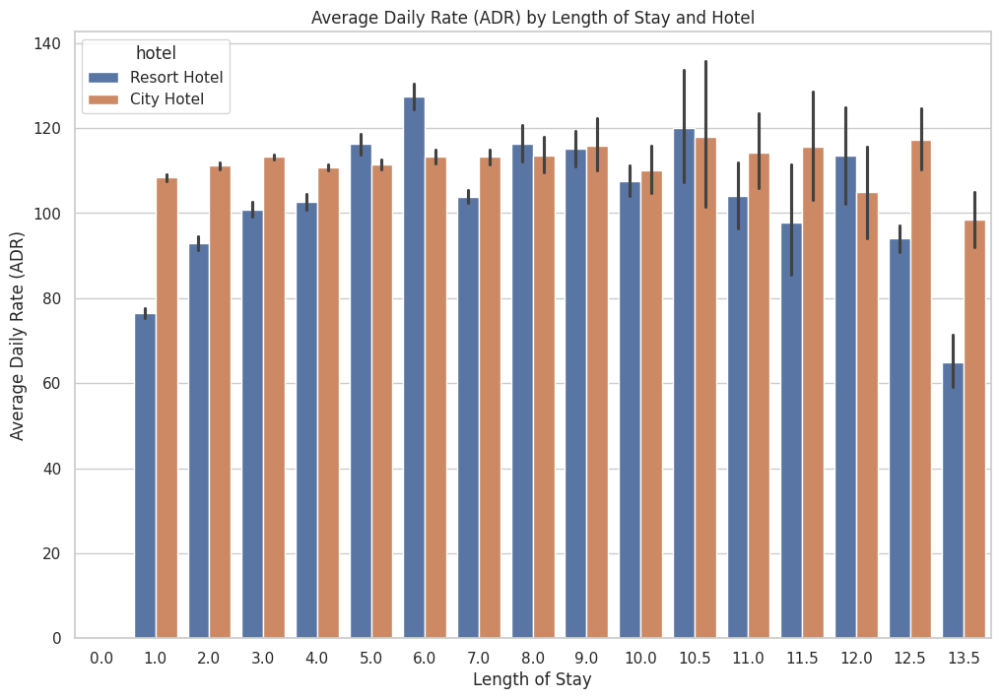

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.barplot(x='length_of_stay', y='adr', hue='hotel', data=final_data)
plt.title('Average Daily Rate (ADR) by Length of Stay and Hotel')
plt.xlabel('Length of Stay')
plt.ylabel('Average Daily Rate (ADR)')
plt.show()


In [ ]:
final_data.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'season',
       'length_of_stay'],
      dtype='object')

**Market Segment Analysis:**

---


Investigate ADR differences across various market segments.

In [ ]:
market_segment_adr = final_data.groupby(['market_segment', 'hotel'])['adr'].mean().reset_index()


In [ ]:
market_segment_adr

,market_segment,hotel,adr
0,Aviation,City Hotel,100.613628
1,Complementary,City Hotel,2.802048
2,Complementary,Resort Hotel,3.868466
3,Corporate,City Hotel,82.958805
4,Corporate,Resort Hotel,51.831437
5,Direct,City Hotel,119.995964
6,Direct,Resort Hotel,110.180459
7,Groups,City Hotel,85.193604
8,Groups,Resort Hotel,62.972545
9,Offline TA/TO,City Hotel,86.753425


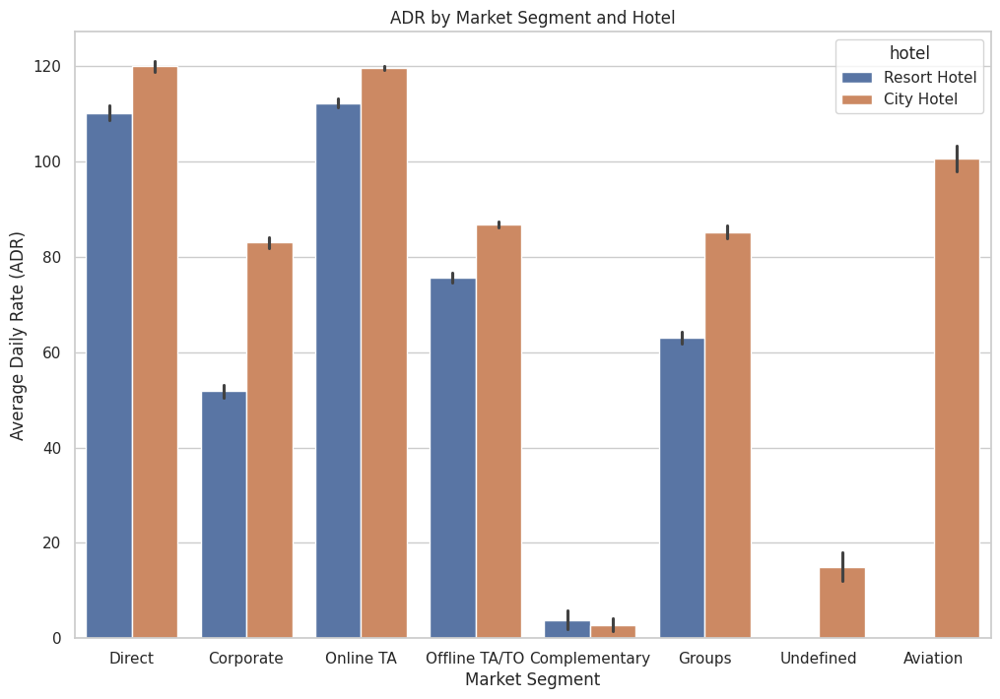

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(x='market_segment', y='adr', hue='hotel', data=final_data)
plt.title('ADR by Market Segment and Hotel')
plt.xlabel('Market Segment')
plt.ylabel('Average Daily Rate (ADR)')
plt.show()


**Booking Lead Time Analysis:**

---


Explore ADR patterns based on the lead time between booking and check-in.

In [ ]:
lead_time_adr = final_data.groupby(['lead_time', 'hotel'])['adr'].mean().reset_index()


In [ ]:
lead_time_adr

,lead_time,hotel,adr
0,0,City Hotel,97.520355
1,0,Resort Hotel,72.874417
2,1,City Hotel,104.118126
3,1,Resort Hotel,76.627147
4,2,City Hotel,106.613333
...,...,...,...
589,294,Resort Hotel,86.001364
590,295,City Hotel,103.473333
591,295,Resort Hotel,117.403750
592,296,City Hotel,94.728850


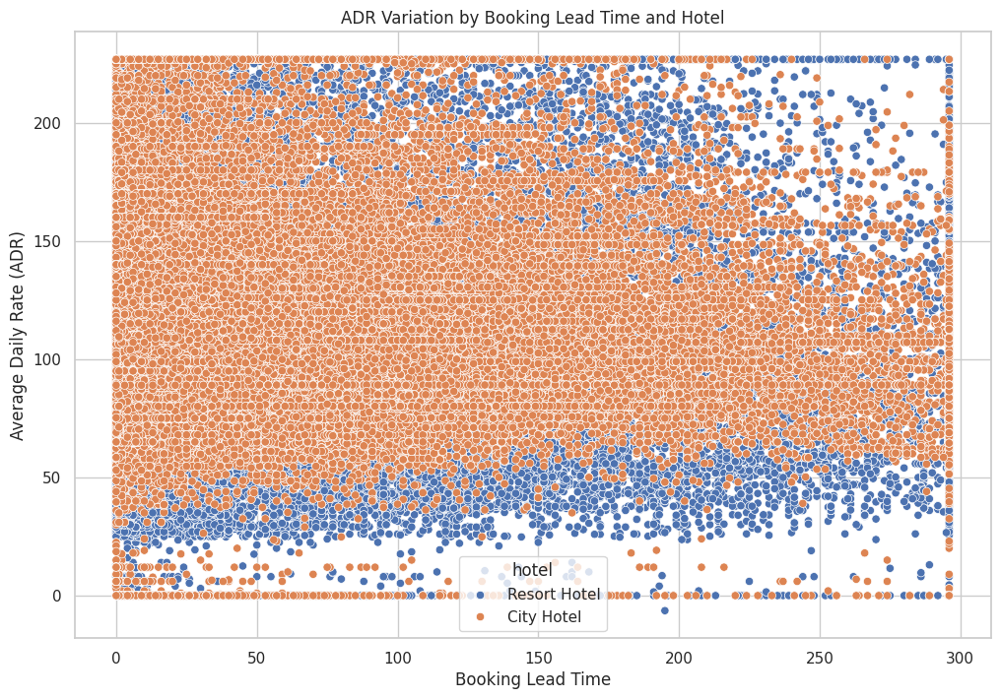

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='lead_time', y='adr', hue='hotel', data=final_data)
plt.title('ADR Variation by Booking Lead Time and Hotel')
plt.xlabel('Booking Lead Time')
plt.ylabel('Average Daily Rate (ADR)')
plt.show()


In [ ]:
import numpy as np

df['adr_log'] = np.log1p(df['adr'])


In [ ]:
fig = px.scatter(df, x='lead_time', y='adr_log', color='reserved_room_type',
                 title='Scatter Plot of Log-Transformed ADR and Lead Time by Room Type',
                 labels={'lead_time': 'Lead Time', 'adr_log': 'Log-Transformed ADR'})

fig.update_layout(
    legend=dict(x=1, y=1),
    font=dict(size=14)
)

fig.show()


**Make a data frame 'data' where filtering is done for those NOT-Canceled.**

---



In [ ]:
data = final_data[final_data["is_canceled"] == 0]

I have filtered DataFrame (df) to include only rows where the booking was not canceled (is_canceled == 0).

In [ ]:
data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,length_of_stay
0,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015,Summer,0.0
1,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015,Summer,0.0
2,Resort Hotel,0,7,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015,Summer,1.0
3,Resort Hotel,0,13,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015,Summer,1.0
4,Resort Hotel,0,14,2015,July,27,1,0,2.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.00,0,1.0,Check-Out,7/3/2015,Summer,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5.0,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,179.0,0,Transient,96.14,0,0.0,Check-Out,9/6/2017,Summer,7.0
119386,City Hotel,0,102,2017,August,35,31,2,5.0,2,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,179.0,0,Transient,225.43,0,2.0,Check-Out,9/7/2017,Summer,7.0
119387,City Hotel,0,34,2017,August,35,31,2,5.0,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,179.0,0,Transient,157.71,0,2.5,Check-Out,9/7/2017,Summer,7.0
119388,City Hotel,0,109,2017,August,35,31,2,5.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,179.0,0,Transient,104.40,0,0.0,Check-Out,9/7/2017,Summer,7.0


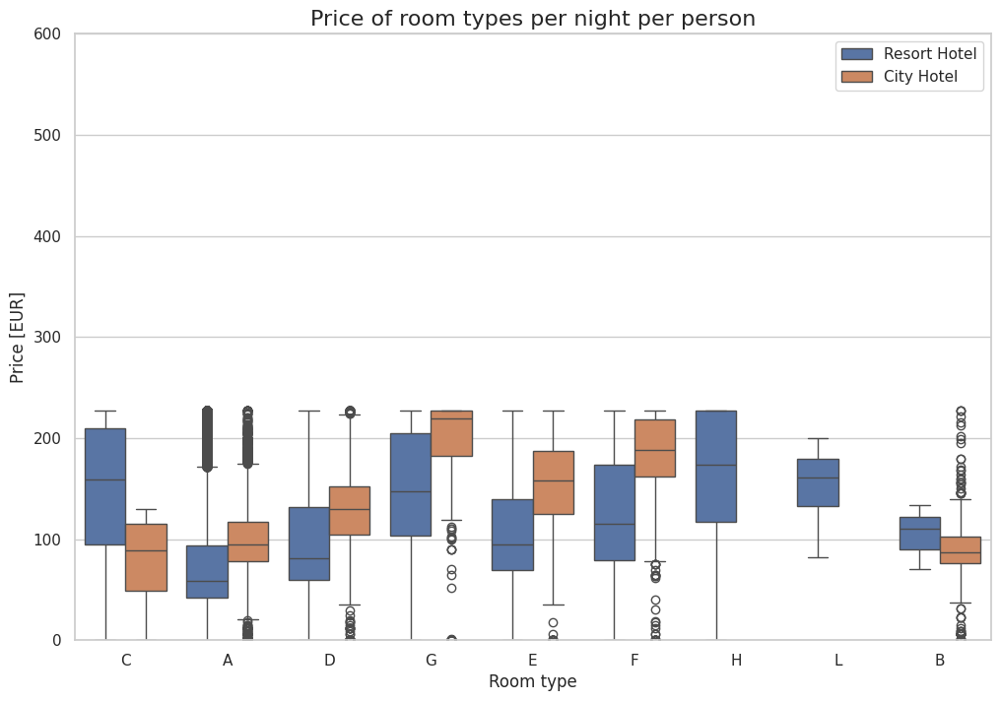

In [ ]:
#boxplot
plt.figure(figsize = (12,8)) #default

sns.boxplot(x = "reserved_room_type",
           y = "adr",
           hue = "hotel", data = data)

plt.title("Price of room types per night per person", fontsize = 16)
plt.xlabel("Room type")
plt.ylabel("Price [EUR]")
plt.legend(loc = "upper right")
plt.ylim(0,600)
plt.show()


There are outliers.

# **How does the Price per Night (adr) vary over year**

---



In [ ]:
final_data["hotel"].unique()

array(['Resort Hotel', 'City Hotel'], dtype=object)

In [ ]:
data_resort = final_data[(final_data["hotel"] == "Resort Hotel") & (final_data["is_canceled"] == 0)]


data_city = final_data[(final_data["hotel"] == "City Hotel") & (final_data["is_canceled"] == 0)]

This line selects rows from the final_data DataFrame where the "hotel" column has the value "Resort Hotel" and the "is_canceled" column has the value 0 (indicating that the reservation was not canceled). So, data_resort will contain only the rows representing reservations at the "Resort Hotel" that were not canceled.
Similar to the first line, this line selects rows from the final_data DataFrame where the "hotel" column has the value "City Hotel" and the "is_canceled" column has the value 0. Therefore, data_city will contain only the rows representing reservations at the "City Hotel" that were not canceled.

In [ ]:
data_resort

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,length_of_stay
0,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015,Summer,0.0
1,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015,Summer,0.0
2,Resort Hotel,0,7,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015,Summer,1.0
3,Resort Hotel,0,13,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015,Summer,1.0
4,Resort Hotel,0,14,2015,July,27,1,0,2.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.00,0,1.0,Check-Out,7/3/2015,Summer,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40055,Resort Hotel,0,212,2017,August,35,31,2,8.0,2,0.0,0,BB,GBR,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,143.0,179.0,0,Transient,89.75,0,0.0,Check-Out,9/10/2017,Summer,10.0
40056,Resort Hotel,0,169,2017,August,35,30,2,8.5,2,0.0,0,BB,IRL,Direct,Direct,0,0,0,E,E,0,No Deposit,250.0,179.0,0,Transient-Party,202.27,0,1.0,Check-Out,9/10/2017,Summer,10.5
40057,Resort Hotel,0,204,2017,August,35,29,4,8.5,2,0.0,0,BB,IRL,Direct,Direct,0,0,0,E,E,0,No Deposit,250.0,179.0,0,Transient,153.57,0,2.5,Check-Out,9/12/2017,Summer,12.5
40058,Resort Hotel,0,211,2017,August,35,31,4,8.5,2,0.0,0,HB,GBR,Offline TA/TO,TA/TO,0,0,0,D,D,0,No Deposit,40.0,179.0,0,Contract,112.80,0,1.0,Check-Out,9/14/2017,Summer,12.5


In [ ]:
data_city

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,length_of_stay
40060,City Hotel,0,6,2015,July,27,1,0,2.0,2,0.0,0,HB,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,6.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/3/2015,Summer,2.0
40066,City Hotel,0,3,2015,July,27,2,0,3.0,2,0.0,0,HB,PRT,Groups,TA/TO,0,0,0,A,A,0,No Deposit,1.0,179.0,0,Transient-Party,58.67,0,0.0,Check-Out,7/5/2015,Summer,3.0
40070,City Hotel,0,43,2015,July,27,3,0,2.0,2,0.0,0,HB,PRT,Groups,TA/TO,0,0,0,A,A,0,No Deposit,1.0,179.0,0,Transient-Party,86.00,0,0.0,Check-Out,7/5/2015,Summer,2.0
40071,City Hotel,0,43,2015,July,27,3,0,2.0,2,0.0,0,HB,PRT,Groups,TA/TO,0,0,0,A,A,0,No Deposit,1.0,179.0,0,Transient-Party,43.00,0,0.0,Check-Out,7/5/2015,Summer,2.0
40073,City Hotel,0,4,2015,July,27,3,0,2.0,2,0.0,0,HB,PRT,Groups,TA/TO,0,0,0,A,A,0,No Deposit,1.0,179.0,0,Transient-Party,63.00,0,0.0,Check-Out,7/5/2015,Summer,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5.0,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,179.0,0,Transient,96.14,0,0.0,Check-Out,9/6/2017,Summer,7.0
119386,City Hotel,0,102,2017,August,35,31,2,5.0,2,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,179.0,0,Transient,225.43,0,2.0,Check-Out,9/7/2017,Summer,7.0
119387,City Hotel,0,34,2017,August,35,31,2,5.0,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,179.0,0,Transient,157.71,0,2.5,Check-Out,9/7/2017,Summer,7.0
119388,City Hotel,0,109,2017,August,35,31,2,5.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,179.0,0,Transient,104.40,0,0.0,Check-Out,9/7/2017,Summer,7.0


In [ ]:
#resort hotel: variable: data_resort

#adr attribute :

#how many people came to resort hotel per month
resort_hotel = data_resort.groupby(['arrival_date_month'])['adr'].mean().reset_index()

In [ ]:
resort_hotel

,arrival_date_month,adr
0,April,76.829908
1,August,173.740891
2,December,62.960163
3,February,53.661314
4,January,48.603887
5,July,147.900559
6,June,108.742713
7,March,57.127537
8,May,77.725129
9,November,48.956548


In [ ]:
#how many people came to city hotel per month
city_hotel = data_city.groupby(['arrival_date_month'])['adr'].mean().reset_index()

In [ ]:
city_hotel

,arrival_date_month,adr
0,April,113.843605
1,August,122.004931
2,December,90.408499
3,February,88.106837
4,January,83.343603
5,July,119.361412
6,June,120.235731
7,March,91.230954
8,May,124.237929
9,November,88.232331


In [ ]:
final = resort_hotel.merge(city_hotel, on = "arrival_date_month")

final.columns = ["month", "price_for_resort_hotel", "price_for_city_hotel"]

In [ ]:
final

,month,price_for_resort_hotel,price_for_city_hotel
0,April,76.829908,113.843605
1,August,173.740891,122.004931
2,December,62.960163,90.408499
3,February,53.661314,88.106837
4,January,48.603887,83.343603
5,July,147.900559,119.361412
6,June,108.742713,120.235731
7,March,57.127537,91.230954
8,May,77.725129,124.237929
9,November,48.956548,88.232331


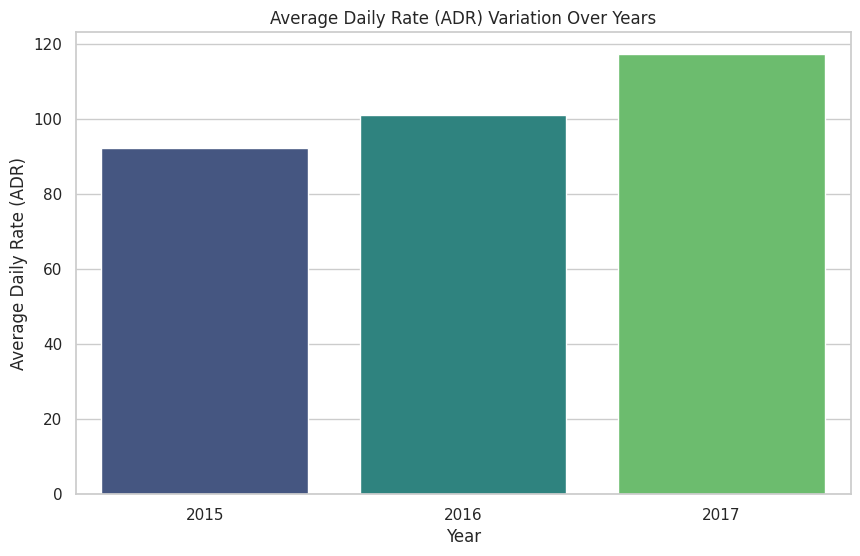

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group by 'arrival_date_year' and calculate the mean ADR for each year
adr_by_year = final_data.groupby('arrival_date_year')['adr'].mean().reset_index()

# Plot the variation of ADR over the years
plt.figure(figsize=(10, 6))
sns.barplot(x='arrival_date_year', y='adr', data=adr_by_year, palette='viridis')
plt.title('Average Daily Rate (ADR) Variation Over Years')
plt.xlabel('Year')
plt.ylabel('Average Daily Rate (ADR)')
plt.show()


# **Sort the Month**

---



In [ ]:
from calendar import month_name

def sort_month(df, colname):
    month_dict = { j:i for i, j in enumerate(month_name) } #dictionary comprehension
    df["month_num"] = df[colname].apply(lambda x: month_dict[x])
    return df.sort_values(by = "month_num").reset_index().drop(['index', 'month_num'], axis = 1)

create a function sort_month for sorting month in 'final'dataframe.here df is passed inside the function as arguments with colnames also.The month_dict will take month name and corresponding columns .A new column month_num is created and returns the sorted values.

In [ ]:
sort_month(final, "month")

,month,price_for_resort_hotel,price_for_city_hotel
0,January,48.603887,83.343603
1,February,53.661314,88.106837
2,March,57.127537,91.230954
3,April,76.829908,113.843605
4,May,77.725129,124.237929
5,June,108.742713,120.235731
6,July,147.900559,119.361412
7,August,173.740891,122.004931
8,September,98.753552,116.714757
9,October,62.656271,105.418088


<Axes: xlabel='month'>

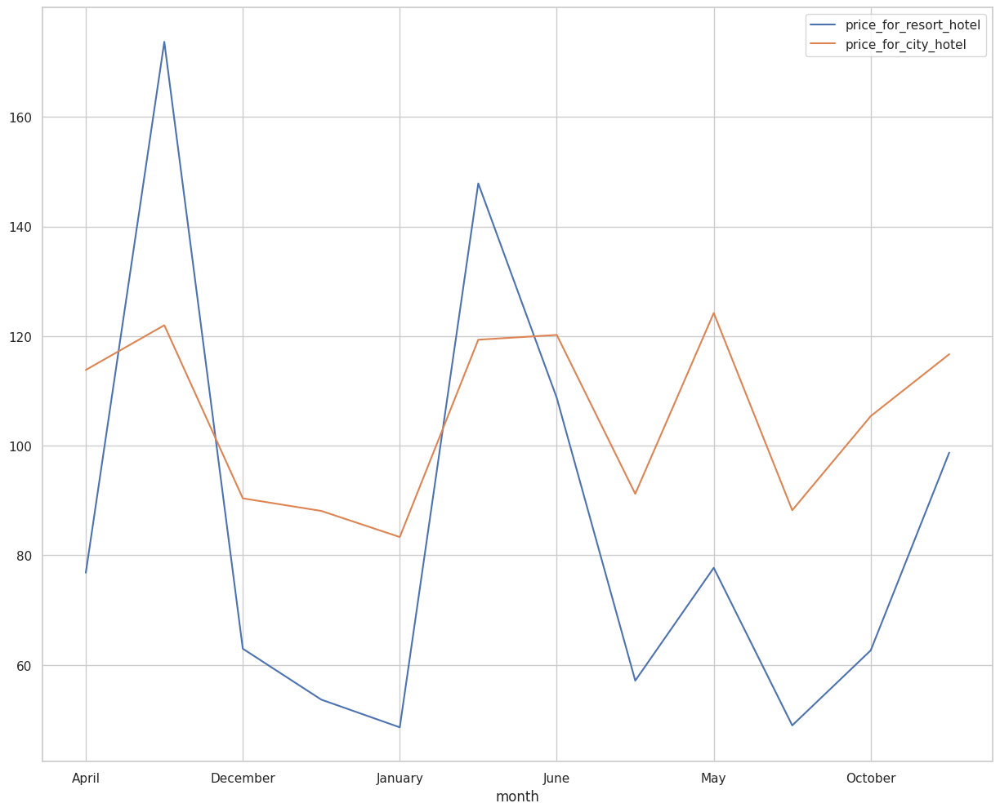

In [ ]:
final.plot(kind = "line", x = "month", y = ['price_for_resort_hotel','price_for_city_hotel'])

Her we can see the price of Resort hotel is high during summer season January to May.And lowest in December-January.
For city hotel the price increases from January to june .And the price is less in December-January thereafter it increases.In the month of May there is a sharp increase in price for city hotel.And there is decrese in september October month.After that it increases in Autumn season.

# **Which are the most busiest months or at which month is the Guests High?**

---



In [ ]:
data_resort.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,length_of_stay
0,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.0,0,0.0,Check-Out,7/1/2015,Summer,0.0
1,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.0,0,0.0,Check-Out,7/1/2015,Summer,0.0
2,Resort Hotel,0,7,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.0,0,0.0,Check-Out,7/2/2015,Summer,1.0
3,Resort Hotel,0,13,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.0,0,0.0,Check-Out,7/2/2015,Summer,1.0
4,Resort Hotel,0,14,2015,July,27,1,0,2.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.0,0,1.0,Check-Out,7/3/2015,Summer,2.0


In [ ]:
rush_resort = data_resort["arrival_date_month"].value_counts().reset_index()
rush_resort.columns = ["month", "no of guests"]

print(rush_resort)

     month     no of guests
0      August      3153    
1        July      3012    
2         May      2246    
3     October      2207    
4       March      2188    
5       April      2167    
6    February      2047    
7        June      1926    
8   September      1875    
9    November      1744    
10   December      1714    
11    January      1685    


In [ ]:
rush_resort

,month,no of guests
0,August,3153
1,July,3012
2,May,2246
3,October,2207
4,March,2188
5,April,2167
6,February,2047
7,June,1926
8,September,1875
9,November,1744


In [ ]:
rush_city = data_city["arrival_date_month"].value_counts().reset_index()
rush_city.columns = ["month", "no of guests"]

print(rush_city)

     month     no of guests
0      August      4467    
1        July      3834    
2         May      3656    
3        June      3477    
4       March      3469    
5       April      3325    
6   September      3166    
7     October      3070    
8    February      2618    
9    November      2177    
10   December      2019    
11    January      1961    


In [ ]:
rush_city

,month,no of guests
0,August,4467
1,July,3834
2,May,3656
3,June,3477
4,March,3469
5,April,3325
6,September,3166
7,October,3070
8,February,2618
9,November,2177


# **Merge two dataframes rush_resort and rush_city as final_rush**

---



In [ ]:
#merge two data frame rush_resort , rush_city

final_rush = rush_resort.merge(rush_city, on = "month")

final_rush.columns = ["month", "no of guests in resort hotel", "no of guests in city hotel"]

final_rush

,month,no of guests in resort hotel,no of guests in city hotel
0,August,3153,4467
1,July,3012,3834
2,May,2246,3656
3,October,2207,3070
4,March,2188,3469
5,April,2167,3325
6,February,2047,2618
7,June,1926,3477
8,September,1875,3166
9,November,1744,2177


In [ ]:
final_rush

,month,no of guests in resort hotel,no of guests in city hotel
0,August,3153,4467
1,July,3012,3834
2,May,2246,3656
3,October,2207,3070
4,March,2188,3469
5,April,2167,3325
6,February,2047,2618
7,June,1926,3477
8,September,1875,3166
9,November,1744,2177


In [ ]:
final_rush = sort_month(final_rush, "month")
print(final_rush)

     month     no of guests in resort hotel  no of guests in city hotel
0     January              1685                         1961           
1    February              2047                         2618           
2       March              2188                         3469           
3       April              2167                         3325           
4         May              2246                         3656           
5        June              1926                         3477           
6        July              3012                         3834           
7      August              3153                         4467           
8   September              1875                         3166           
9     October              2207                         3070           
10   November              1744                         2177           
11   December              1714                         2019           


In [ ]:
final_rush

,month,no of guests in resort hotel,no of guests in city hotel
0,January,1685,1961
1,February,2047,2618
2,March,2188,3469
3,April,2167,3325
4,May,2246,3656
5,June,1926,3477
6,July,3012,3834
7,August,3153,4467
8,September,1875,3166
9,October,2207,3070


**Line plot of No of guests and Month**

---



<Axes: xlabel='month'>

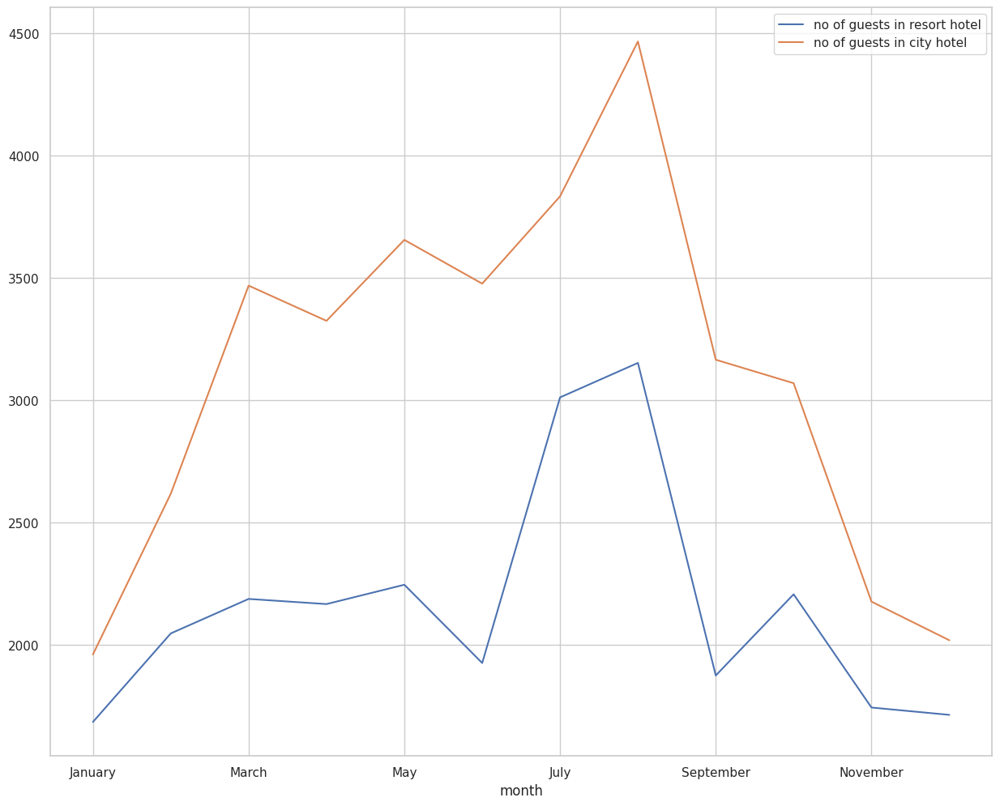

In [ ]:
#plot line plot month vs no of guests

final_rush.plot(kind = "line", x = "month",
                y = ["no of guests in resort hotel","no of guests in city hotel" ])


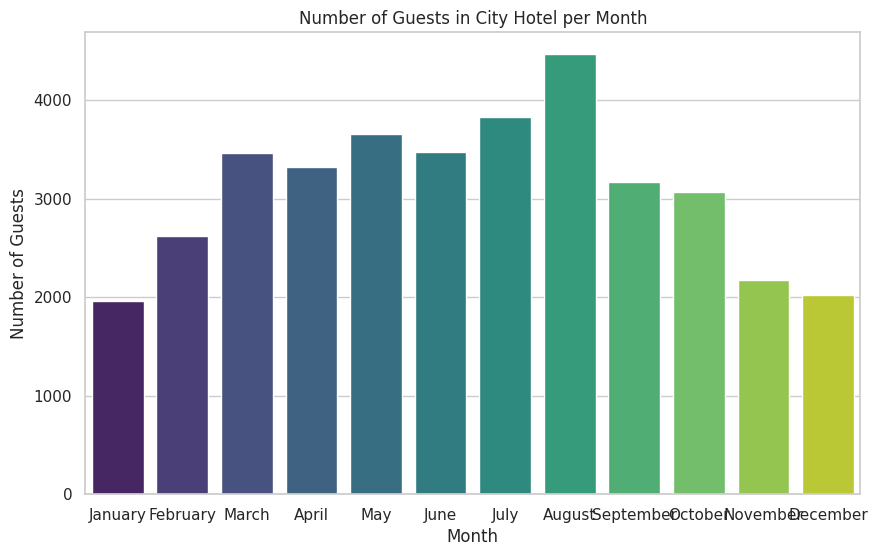

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the number of guests for each month in the City Hotel
rush_city = data_city["arrival_date_month"].value_counts().reset_index()
rush_city.columns = ["month", "no_of_guests"]

# Sort the DataFrame by month
sorted_rush_city = sort_month(rush_city, "month")

# Plot the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x="month", y="no_of_guests", data=sorted_rush_city, palette="viridis")
plt.title("Number of Guests in City Hotel per Month")
plt.xlabel("Month")
plt.ylabel("Number of Guests")
plt.show()


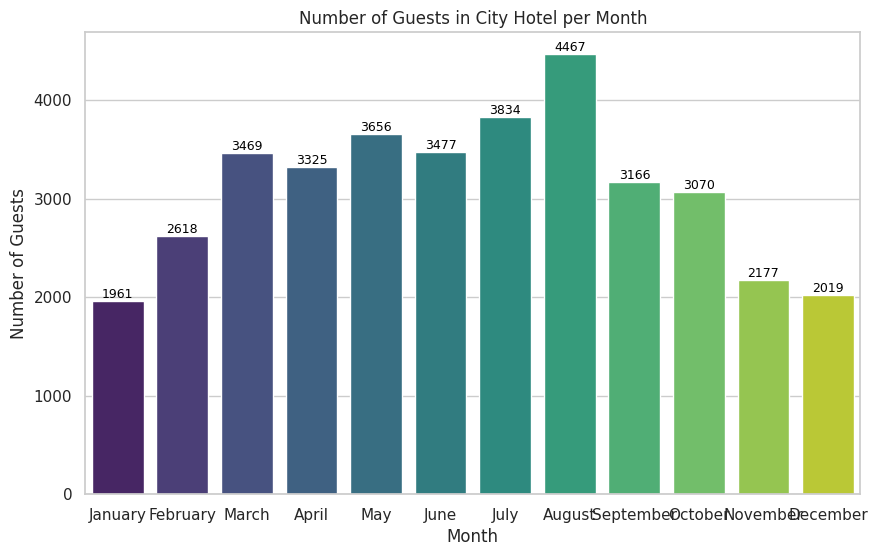

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the number of guests for each month in the City Hotel
rush_city = data_city["arrival_date_month"].value_counts().reset_index()
rush_city.columns = ["month", "no_of_guests"]

# Sort the DataFrame by month
sorted_rush_city = sort_month(rush_city, "month")

# Plot the bar chart with values inside
plt.figure(figsize=(10, 6))
ax = sns.barplot(x="month", y="no_of_guests", data=sorted_rush_city, palette="viridis")

# Add values inside the bars
for index, value in enumerate(sorted_rush_city["no_of_guests"]):
    ax.text(index, value + 1, str(value), ha='center', va='bottom', color='black', fontsize=9)

plt.title("Number of Guests in City Hotel per Month")
plt.xlabel("Month")
plt.ylabel("Number of Guests")
plt.show()


# **How Long does People stay in Hotel?**

---



In [ ]:
final_data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,length_of_stay
0,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015,Summer,0.0
1,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015,Summer,0.0
2,Resort Hotel,0,7,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015,Summer,1.0
3,Resort Hotel,0,13,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015,Summer,1.0
4,Resort Hotel,0,14,2015,July,27,1,0,2.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.00,0,1.0,Check-Out,7/3/2015,Summer,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5.0,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,179.0,0,Transient,96.14,0,0.0,Check-Out,9/6/2017,Summer,7.0
119386,City Hotel,0,102,2017,August,35,31,2,5.0,2,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,179.0,0,Transient,225.43,0,2.0,Check-Out,9/7/2017,Summer,7.0
119387,City Hotel,0,34,2017,August,35,31,2,5.0,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,179.0,0,Transient,157.71,0,2.5,Check-Out,9/7/2017,Summer,7.0
119388,City Hotel,0,109,2017,August,35,31,2,5.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,179.0,0,Transient,104.40,0,0.0,Check-Out,9/7/2017,Summer,7.0


**FILTER CONDITION**

---



In [ ]:
filter_condition = final_data['is_canceled'] == 0

clean_data = final_data[filter_condition]


This line creates a boolean Series (filter_condition) where each element is True if the corresponding row in the "is_canceled" column of the final_data DataFrame is equal to 0, and False otherwise. It checks whether the reservation was not canceled (0 means not canceled).
This line uses the boolean Series filter_condition to filter rows from the final_data DataFrame. It selects only those rows where the condition is_canceled == 0 is True. As a result, clean_data will contain only the rows from final_data where the reservations were not canceled.

In [ ]:
clean_data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,length_of_stay
0,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.0,0,0.0,Check-Out,7/1/2015,Summer,0.0
1,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.0,0,0.0,Check-Out,7/1/2015,Summer,0.0
2,Resort Hotel,0,7,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.0,0,0.0,Check-Out,7/2/2015,Summer,1.0
3,Resort Hotel,0,13,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.0,0,0.0,Check-Out,7/2/2015,Summer,1.0
4,Resort Hotel,0,14,2015,July,27,1,0,2.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.0,0,1.0,Check-Out,7/3/2015,Summer,2.0


In [ ]:
clean_data.tail()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,length_of_stay
119385,City Hotel,0,23,2017,August,35,30,2,5.0,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,179.0,0,Transient,96.14,0,0.0,Check-Out,9/6/2017,Summer,7.0
119386,City Hotel,0,102,2017,August,35,31,2,5.0,2,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,179.0,0,Transient,225.43,0,2.0,Check-Out,9/7/2017,Summer,7.0
119387,City Hotel,0,34,2017,August,35,31,2,5.0,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,179.0,0,Transient,157.71,0,2.5,Check-Out,9/7/2017,Summer,7.0
119388,City Hotel,0,109,2017,August,35,31,2,5.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,179.0,0,Transient,104.40,0,0.0,Check-Out,9/7/2017,Summer,7.0
119389,City Hotel,0,205,2017,August,35,29,2,7.0,2,0.0,0,HB,DEU,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,179.0,0,Transient,151.20,0,2.0,Check-Out,9/7/2017,Summer,9.0


In [ ]:
clean_data["total_nights"] = clean_data["stays_in_weekend_nights"] + clean_data["stays_in_week_nights"]

In [ ]:
clean_data["total_nights"]

0         0.0
1         0.0
2         1.0
3         1.0
4         2.0
         ... 
119385    7.0
119386    7.0
119387    7.0
119388    7.0
119389    9.0
Name: total_nights, Length: 63203, dtype: float64

In [ ]:
clean_data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,length_of_stay,total_nights
0,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.0,0,0.0,Check-Out,7/1/2015,Summer,0.0,0.0
1,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.0,0,0.0,Check-Out,7/1/2015,Summer,0.0,0.0
2,Resort Hotel,0,7,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.0,0,0.0,Check-Out,7/2/2015,Summer,1.0,1.0
3,Resort Hotel,0,13,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.0,0,0.0,Check-Out,7/2/2015,Summer,1.0,1.0
4,Resort Hotel,0,14,2015,July,27,1,0,2.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.0,0,1.0,Check-Out,7/3/2015,Summer,2.0,2.0


In [ ]:
stay = clean_data.groupby(["total_nights", "hotel"]).agg('count').reset_index()

stay = stay.iloc[:, 0:3]
print(stay)

    total_nights     hotel      is_canceled
0        0.0        City Hotel      218    
1        0.0      Resort Hotel      350    
2        1.0        City Hotel     7972    
3        1.0      Resort Hotel     6025    
4        2.0        City Hotel     7630    
5        2.0      Resort Hotel     3898    
6        3.0        City Hotel     9300    
7        3.0      Resort Hotel     3181    
8        4.0        City Hotel     6523    
9        4.0      Resort Hotel     2900    
10       5.0        City Hotel     2903    
11       5.0      Resort Hotel     1779    
12       6.0        City Hotel     1025    
13       6.0      Resort Hotel     1112    
14       7.0        City Hotel     1149    
15       7.0      Resort Hotel     4062    
16       8.0        City Hotel      195    
17       8.0      Resort Hotel      468    
18       9.0        City Hotel      111    
19       9.0      Resort Hotel      394    
20      10.0        City Hotel       78    
21      10.0      Resort Hotel  

In [ ]:
stay

,total_nights,hotel,is_canceled
0,0.0,City Hotel,218
1,0.0,Resort Hotel,350
2,1.0,City Hotel,7972
3,1.0,Resort Hotel,6025
4,2.0,City Hotel,7630
5,2.0,Resort Hotel,3898
6,3.0,City Hotel,9300
7,3.0,Resort Hotel,3181
8,4.0,City Hotel,6523
9,4.0,Resort Hotel,2900


In [ ]:
stay = stay.rename(columns = {'is_canceled': 'Number of stays'})

In [ ]:
stay

,total_nights,hotel,Number of stays
0,0.0,City Hotel,218
1,0.0,Resort Hotel,350
2,1.0,City Hotel,7972
3,1.0,Resort Hotel,6025
4,2.0,City Hotel,7630
5,2.0,Resort Hotel,3898
6,3.0,City Hotel,9300
7,3.0,Resort Hotel,3181
8,4.0,City Hotel,6523
9,4.0,Resort Hotel,2900


<Axes: xlabel='total_nights', ylabel='Number of stays'>

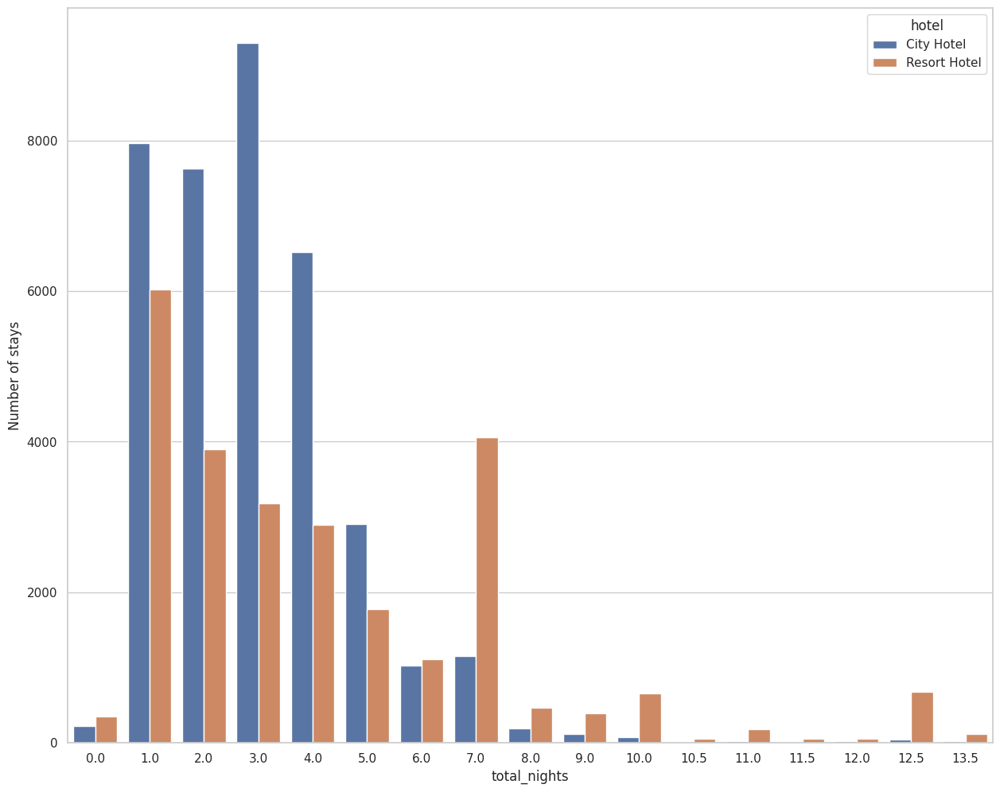

In [ ]:
#plot the barplot

sns.barplot(x = "total_nights", y = "Number of stays", hue = "hotel",
           hue_order = ["City Hotel", "Resort Hotel"], data = stay)


# **Select important Numerical Features using Co relation**

---



In [ ]:
correlation = final_data.corr()

In [ ]:
correlation

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,length_of_stay
is_canceled,1.000000,0.188284,0.088022,0.001627,0.005432,0.060533,0.086790,NaN,NaN,NaN,-0.088791,NaN,NaN,NaN,-0.007083,-0.001700,NaN,0.136510,NaN,-0.122138,0.088537
lead_time,0.188284,1.000000,0.140795,0.102157,0.009904,0.255396,0.353330,NaN,NaN,NaN,-0.151551,NaN,NaN,NaN,0.071888,0.028833,NaN,0.036177,NaN,0.038112,0.364078
arrival_date_year,0.088022,0.140795,1.000000,-0.513909,-0.009891,0.005056,0.003754,NaN,NaN,NaN,0.024687,NaN,NaN,NaN,-0.004605,0.060779,NaN,0.186837,NaN,0.062047,0.004818
arrival_date_week_number,0.001627,0.102157,-0.513909,1.000000,0.093204,0.031746,0.039722,NaN,NaN,NaN,-0.038254,NaN,NaN,NaN,0.019292,-0.025966,NaN,0.105366,NaN,0.046717,0.042161
arrival_date_day_of_month,0.005432,0.009904,-0.009891,0.093204,1.000000,-0.016391,-0.024509,NaN,NaN,NaN,-0.004531,NaN,NaN,NaN,0.006482,0.007449,NaN,0.022168,NaN,-0.001869,-0.024717
stays_in_weekend_nights,0.060533,0.255396,0.005056,0.031746,-0.016391,1.000000,0.488179,NaN,NaN,NaN,-0.109041,NaN,NaN,NaN,0.158699,0.006060,NaN,0.049078,NaN,0.032265,0.765541
stays_in_week_nights,0.086790,0.353330,0.003754,0.039722,-0.024509,0.488179,1.000000,NaN,NaN,NaN,-0.124226,NaN,NaN,NaN,0.200142,0.030383,NaN,0.077956,NaN,0.043388,0.935233
adults,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
children,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
babies,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Exclude the correlation of "is_canceled" with itself

---



In [ ]:
correlation = correlation["is_canceled"][1:]

This part is slicing the resulting column. The slice [1:] means that it starts from the second element (index 1) and includes all subsequent elements. This slicing operation removes the first element of the column.So, the overall line of code assigns to the variable correlation a subset of the "is_canceled" column from the DataFrame correlation, excluding the first element. The resulting correlation variable likely represents the correlation values of the "is_canceled" column with other columns, excluding the self-correlation of "is_canceled" with itself.

In [ ]:
correlation.abs().sort_values(ascending = False)

lead_time                         0.188284
adr                               0.136510
total_of_special_requests         0.122138
is_repeated_guest                 0.088791
length_of_stay                    0.088537
arrival_date_year                 0.088022
stays_in_week_nights              0.086790
stays_in_weekend_nights           0.060533
agent                             0.007083
arrival_date_day_of_month         0.005432
company                           0.001700
arrival_date_week_number          0.001627
adults                                 NaN
children                               NaN
babies                                 NaN
previous_cancellations                 NaN
previous_bookings_not_canceled         NaN
booking_changes                        NaN
days_in_waiting_list                   NaN
required_car_parking_spaces            NaN
Name: is_canceled, dtype: float64

In [ ]:
list_not =["days_in_waiting_list", "arrival_date_year"]

# **Numerical One**

---



In [ ]:
#numerical one
num_features =[ col for col in final_data.columns if final_data[col].dtype !="O" and col not in list_not]

In [ ]:
num_features

['is_canceled',
 'lead_time',
 'arrival_date_week_number',
 'arrival_date_day_of_month',
 'stays_in_weekend_nights',
 'stays_in_week_nights',
 'adults',
 'children',
 'babies',
 'is_repeated_guest',
 'previous_cancellations',
 'previous_bookings_not_canceled',
 'booking_changes',
 'agent',
 'company',
 'adr',
 'required_car_parking_spaces',
 'total_of_special_requests',
 'length_of_stay']

# **Select Important Catagorical Features**

---



In [ ]:
final_data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,length_of_stay
0,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015,Summer,0.0
1,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015,Summer,0.0
2,Resort Hotel,0,7,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015,Summer,1.0
3,Resort Hotel,0,13,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015,Summer,1.0
4,Resort Hotel,0,14,2015,July,27,1,0,2.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.00,0,1.0,Check-Out,7/3/2015,Summer,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5.0,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,179.0,0,Transient,96.14,0,0.0,Check-Out,9/6/2017,Summer,7.0
119386,City Hotel,0,102,2017,August,35,31,2,5.0,2,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,179.0,0,Transient,225.43,0,2.0,Check-Out,9/7/2017,Summer,7.0
119387,City Hotel,0,34,2017,August,35,31,2,5.0,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,179.0,0,Transient,157.71,0,2.5,Check-Out,9/7/2017,Summer,7.0
119388,City Hotel,0,109,2017,August,35,31,2,5.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,179.0,0,Transient,104.40,0,0.0,Check-Out,9/7/2017,Summer,7.0


In [ ]:
final_data["reservation_status"].value_counts()

Check-Out    63203
Canceled     22995
No-Show       1013
Name: reservation_status, dtype: int64

In [ ]:
final_data.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'season',
       'length_of_stay'],
      dtype='object')

In [ ]:
cat_not = ["country", "reservation_status", "booking_changes", "assigned_room_type", "days_in_waiting_list" ]

In [ ]:
cat_features = [col for col in final_data.columns
                if final_data[col].dtype == "O" and col not in cat_not]

In [ ]:
print(cat_features)

['hotel', 'arrival_date_month', 'meal', 'market_segment', 'distribution_channel', 'reserved_room_type', 'deposit_type', 'customer_type', 'reservation_status_date', 'season']


In [ ]:
print(num_features)

['is_canceled', 'lead_time', 'arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'agent', 'company', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'length_of_stay']


In [ ]:
data_cat = final_data[cat_features]

In [ ]:
data_cat

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,reservation_status_date,season
0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,7/1/2015,Summer
1,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,7/1/2015,Summer
2,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,7/2/2015,Summer
3,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,7/2/2015,Summer
4,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,7/3/2015,Summer
...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,August,BB,Offline TA/TO,TA/TO,A,No Deposit,Transient,9/6/2017,Summer
119386,City Hotel,August,BB,Online TA,TA/TO,E,No Deposit,Transient,9/7/2017,Summer
119387,City Hotel,August,BB,Online TA,TA/TO,D,No Deposit,Transient,9/7/2017,Summer
119388,City Hotel,August,BB,Online TA,TA/TO,A,No Deposit,Transient,9/7/2017,Summer


In [ ]:
import warnings
from warnings import filterwarnings
filterwarnings("ignore")

data_cat["reservation_status_date"] = pd.to_datetime(data_cat["reservation_status_date"])

In [ ]:
data_cat["year"] = data_cat["reservation_status_date"].dt.year

data_cat["month"] = data_cat["reservation_status_date"].dt.month

data_cat["day"] = data_cat["reservation_status_date"].dt.day

In [ ]:
data_cat.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,reservation_status_date,season,year,month,day
0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015-07-01,Summer,2015,7,1
1,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015-07-01,Summer,2015,7,1
2,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,2015-07-02,Summer,2015,7,2
3,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,2015-07-02,Summer,2015,7,2
4,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,2015-07-03,Summer,2015,7,3


In [ ]:
data_cat.drop("reservation_status_date", axis = 1, inplace = True)

In [ ]:
data_cat.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,season,year,month,day
0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,Summer,2015,7,1
1,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,Summer,2015,7,1
2,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,Summer,2015,7,2
3,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,Summer,2015,7,2
4,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,Summer,2015,7,3


# **Feature Encoding**

---



# **Mean Encoding Technique**

---



In [ ]:
data_cat.columns

Index(['hotel', 'arrival_date_month', 'meal', 'market_segment',
       'distribution_channel', 'reserved_room_type', 'deposit_type',
       'customer_type', 'season', 'year', 'month', 'day'],
      dtype='object')

In [ ]:
data_cat["cancellation"] = final_data['is_canceled']

In [ ]:
data_cat

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,season,year,month,day,cancellation
0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,Summer,2015,7,1,0
1,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,Summer,2015,7,1,0
2,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,Summer,2015,7,2,0
3,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,Summer,2015,7,2,0
4,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,Summer,2015,7,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,August,BB,Offline TA/TO,TA/TO,A,No Deposit,Transient,Summer,2017,9,6,0
119386,City Hotel,August,BB,Online TA,TA/TO,E,No Deposit,Transient,Summer,2017,9,7,0
119387,City Hotel,August,BB,Online TA,TA/TO,D,No Deposit,Transient,Summer,2017,9,7,0
119388,City Hotel,August,BB,Online TA,TA/TO,A,No Deposit,Transient,Summer,2017,9,7,0


# **Encoding Applied**

---



In [ ]:
def mean_encode(df, col, mean_col):
    df_dict = df.groupby([col])[mean_col].mean().to_dict()
    df[col] = df[col].map(df_dict)
    return df

for col in data_cat.columns[0:8]:
    data_cat = mean_encode(data_cat, col, "cancellation")


In [ ]:
data_cat

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,season,year,month,day,cancellation
0,0.234935,0.318263,0.265750,0.147528,0.148540,0.323851,0.267225,0.30147,Summer,2015,7,1,0
1,0.234935,0.318263,0.265750,0.147528,0.148540,0.323851,0.267225,0.30147,Summer,2015,7,1,0
2,0.234935,0.318263,0.265750,0.147528,0.148540,0.260209,0.267225,0.30147,Summer,2015,7,2,0
3,0.234935,0.318263,0.265750,0.121364,0.127769,0.260209,0.267225,0.30147,Summer,2015,7,2,0
4,0.234935,0.318263,0.265750,0.353863,0.310027,0.260209,0.267225,0.30147,Summer,2015,7,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,0.300991,0.322185,0.265750,0.148426,0.310027,0.260209,0.267225,0.30147,Summer,2017,9,6,0
119386,0.300991,0.322185,0.265750,0.353863,0.310027,0.272742,0.267225,0.30147,Summer,2017,9,7,0
119387,0.300991,0.322185,0.265750,0.353863,0.310027,0.301295,0.267225,0.30147,Summer,2017,9,7,0
119388,0.300991,0.322185,0.265750,0.353863,0.310027,0.260209,0.267225,0.30147,Summer,2017,9,7,0


In [ ]:
data_cat.drop(["cancellation","season"], axis = 1, inplace = True)

In [ ]:
data_cat

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,0.234935,0.318263,0.265750,0.147528,0.148540,0.323851,0.267225,0.30147,2015,7,1
1,0.234935,0.318263,0.265750,0.147528,0.148540,0.323851,0.267225,0.30147,2015,7,1
2,0.234935,0.318263,0.265750,0.147528,0.148540,0.260209,0.267225,0.30147,2015,7,2
3,0.234935,0.318263,0.265750,0.121364,0.127769,0.260209,0.267225,0.30147,2015,7,2
4,0.234935,0.318263,0.265750,0.353863,0.310027,0.260209,0.267225,0.30147,2015,7,3
...,...,...,...,...,...,...,...,...,...,...,...
119385,0.300991,0.322185,0.265750,0.148426,0.310027,0.260209,0.267225,0.30147,2017,9,6
119386,0.300991,0.322185,0.265750,0.353863,0.310027,0.272742,0.267225,0.30147,2017,9,7
119387,0.300991,0.322185,0.265750,0.353863,0.310027,0.301295,0.267225,0.30147,2017,9,7
119388,0.300991,0.322185,0.265750,0.353863,0.310027,0.260209,0.267225,0.30147,2017,9,7


# **Preparing our data**

---



In [ ]:
final_data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,season,length_of_stay
0,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015,Summer,0.0
1,Resort Hotel,0,296,2015,July,27,1,0,0.0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,14.0,179.0,0,Transient,0.00,0,0.0,Check-Out,7/1/2015,Summer,0.0
2,Resort Hotel,0,7,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,14.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015,Summer,1.0
3,Resort Hotel,0,13,2015,July,27,1,0,1.0,2,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,179.0,0,Transient,75.00,0,0.0,Check-Out,7/2/2015,Summer,1.0
4,Resort Hotel,0,14,2015,July,27,1,0,2.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,179.0,0,Transient,98.00,0,1.0,Check-Out,7/3/2015,Summer,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5.0,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,179.0,0,Transient,96.14,0,0.0,Check-Out,9/6/2017,Summer,7.0
119386,City Hotel,0,102,2017,August,35,31,2,5.0,2,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,179.0,0,Transient,225.43,0,2.0,Check-Out,9/7/2017,Summer,7.0
119387,City Hotel,0,34,2017,August,35,31,2,5.0,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,179.0,0,Transient,157.71,0,2.5,Check-Out,9/7/2017,Summer,7.0
119388,City Hotel,0,109,2017,August,35,31,2,5.0,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,179.0,0,Transient,104.40,0,0.0,Check-Out,9/7/2017,Summer,7.0


In [ ]:
final_data.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'season',
       'length_of_stay'],
      dtype='object')

In [ ]:
num_data = final_data[num_features] #numerical data

cat_data = data_cat #categorical data


dataframe = pd.concat([num_data, cat_data], axis = 1) #final dataframe

In [ ]:
dataframe.head()

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,adr,required_car_parking_spaces,total_of_special_requests,length_of_stay,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,0,296,27,1,0,0.0,2,0.0,0,0,0,0,0,14.0,179.0,0.0,0,0.0,0.0,0.234935,0.318263,0.26575,0.147528,0.148540,0.323851,0.267225,0.30147,2015,7,1
1,0,296,27,1,0,0.0,2,0.0,0,0,0,0,0,14.0,179.0,0.0,0,0.0,0.0,0.234935,0.318263,0.26575,0.147528,0.148540,0.323851,0.267225,0.30147,2015,7,1
2,0,7,27,1,0,1.0,2,0.0,0,0,0,0,0,14.0,179.0,75.0,0,0.0,1.0,0.234935,0.318263,0.26575,0.147528,0.148540,0.260209,0.267225,0.30147,2015,7,2
3,0,13,27,1,0,1.0,2,0.0,0,0,0,0,0,304.0,179.0,75.0,0,0.0,1.0,0.234935,0.318263,0.26575,0.121364,0.127769,0.260209,0.267225,0.30147,2015,7,2
4,0,14,27,1,0,2.0,2,0.0,0,0,0,0,0,240.0,179.0,98.0,0,1.0,2.0,0.234935,0.318263,0.26575,0.353863,0.310027,0.260209,0.267225,0.30147,2015,7,3


In [ ]:
dataframe.shape

(87211, 30)

In [ ]:
dataframe.dtypes

is_canceled                         int64
lead_time                           int64
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights              float64
adults                              int64
children                          float64
babies                              int64
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
booking_changes                     int64
agent                             float64
company                           float64
adr                               float64
required_car_parking_spaces         int64
total_of_special_requests         float64
length_of_stay                    float64
hotel                             float64
arrival_date_month                float64
meal                              float64
market_segment                    float64
distribution_channel              

In [ ]:
#dataframe.drop(["length_of_stay"] ,axis=1,inplace = True)

In [ ]:
dataframe.columns

Index(['is_canceled', 'lead_time', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent', 'company',
       'adr', 'required_car_parking_spaces', 'total_of_special_requests',
       'length_of_stay', 'hotel', 'arrival_date_month', 'meal',
       'market_segment', 'distribution_channel', 'reserved_room_type',
       'deposit_type', 'customer_type', 'year', 'month', 'day'],
      dtype='object')

In [ ]:
print(dataframe.head())

   is_canceled  lead_time  arrival_date_week_number  \
0       0          296                27              
1       0          296                27              
2       0            7                27              
3       0           13                27              
4       0           14                27              

   arrival_date_day_of_month  stays_in_weekend_nights  stays_in_week_nights  \
0              1                         0                      0.0           
1              1                         0                      0.0           
2              1                         0                      1.0           
3              1                         0                      1.0           
4              1                         0                      2.0           

   adults  children  babies  is_repeated_guest  previous_cancellations  \
0     2       0.0       0            0                     0             
1     2       0.0       0            0        

In [ ]:
dataframe.head()

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,adr,required_car_parking_spaces,total_of_special_requests,length_of_stay,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,0,296,27,1,0,0.0,2,0.0,0,0,0,0,0,14.0,179.0,0.0,0,0.0,0.0,0.234935,0.318263,0.26575,0.147528,0.148540,0.323851,0.267225,0.30147,2015,7,1
1,0,296,27,1,0,0.0,2,0.0,0,0,0,0,0,14.0,179.0,0.0,0,0.0,0.0,0.234935,0.318263,0.26575,0.147528,0.148540,0.323851,0.267225,0.30147,2015,7,1
2,0,7,27,1,0,1.0,2,0.0,0,0,0,0,0,14.0,179.0,75.0,0,0.0,1.0,0.234935,0.318263,0.26575,0.147528,0.148540,0.260209,0.267225,0.30147,2015,7,2
3,0,13,27,1,0,1.0,2,0.0,0,0,0,0,0,304.0,179.0,75.0,0,0.0,1.0,0.234935,0.318263,0.26575,0.121364,0.127769,0.260209,0.267225,0.30147,2015,7,2
4,0,14,27,1,0,2.0,2,0.0,0,0,0,0,0,240.0,179.0,98.0,0,1.0,2.0,0.234935,0.318263,0.26575,0.353863,0.310027,0.260209,0.267225,0.30147,2015,7,3


In [ ]:
dataframe.dtypes

is_canceled                         int64
lead_time                           int64
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights              float64
adults                              int64
children                          float64
babies                              int64
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
booking_changes                     int64
agent                             float64
company                           float64
adr                               float64
required_car_parking_spaces         int64
total_of_special_requests         float64
length_of_stay                    float64
hotel                             float64
arrival_date_month                float64
meal                              float64
market_segment                    float64
distribution_channel              

In [ ]:
dataframe.head()

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,adr,required_car_parking_spaces,total_of_special_requests,length_of_stay,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,0,296,27,1,0,0.0,2,0.0,0,0,0,0,0,14.0,179.0,0.0,0,0.0,0.0,0.234935,0.318263,0.26575,0.147528,0.148540,0.323851,0.267225,0.30147,2015,7,1
1,0,296,27,1,0,0.0,2,0.0,0,0,0,0,0,14.0,179.0,0.0,0,0.0,0.0,0.234935,0.318263,0.26575,0.147528,0.148540,0.323851,0.267225,0.30147,2015,7,1
2,0,7,27,1,0,1.0,2,0.0,0,0,0,0,0,14.0,179.0,75.0,0,0.0,1.0,0.234935,0.318263,0.26575,0.147528,0.148540,0.260209,0.267225,0.30147,2015,7,2
3,0,13,27,1,0,1.0,2,0.0,0,0,0,0,0,304.0,179.0,75.0,0,0.0,1.0,0.234935,0.318263,0.26575,0.121364,0.127769,0.260209,0.267225,0.30147,2015,7,2
4,0,14,27,1,0,2.0,2,0.0,0,0,0,0,0,240.0,179.0,98.0,0,1.0,2.0,0.234935,0.318263,0.26575,0.353863,0.310027,0.260209,0.267225,0.30147,2015,7,3


In [ ]:
dataframe.dtypes

is_canceled                         int64
lead_time                           int64
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights              float64
adults                              int64
children                          float64
babies                              int64
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
booking_changes                     int64
agent                             float64
company                           float64
adr                               float64
required_car_parking_spaces         int64
total_of_special_requests         float64
length_of_stay                    float64
hotel                             float64
arrival_date_month                float64
meal                              float64
market_segment                    float64
distribution_channel              

# **Handle Outliers**

---



In [ ]:
dataframe.describe()["adr"]

count    87211.000000
mean       105.529105
std         49.029943
min         -6.380000
25%         72.250000
50%         98.250000
75%        134.100000
max        226.875000
Name: adr, dtype: float64

<Axes: xlabel='lead_time', ylabel='Density'>

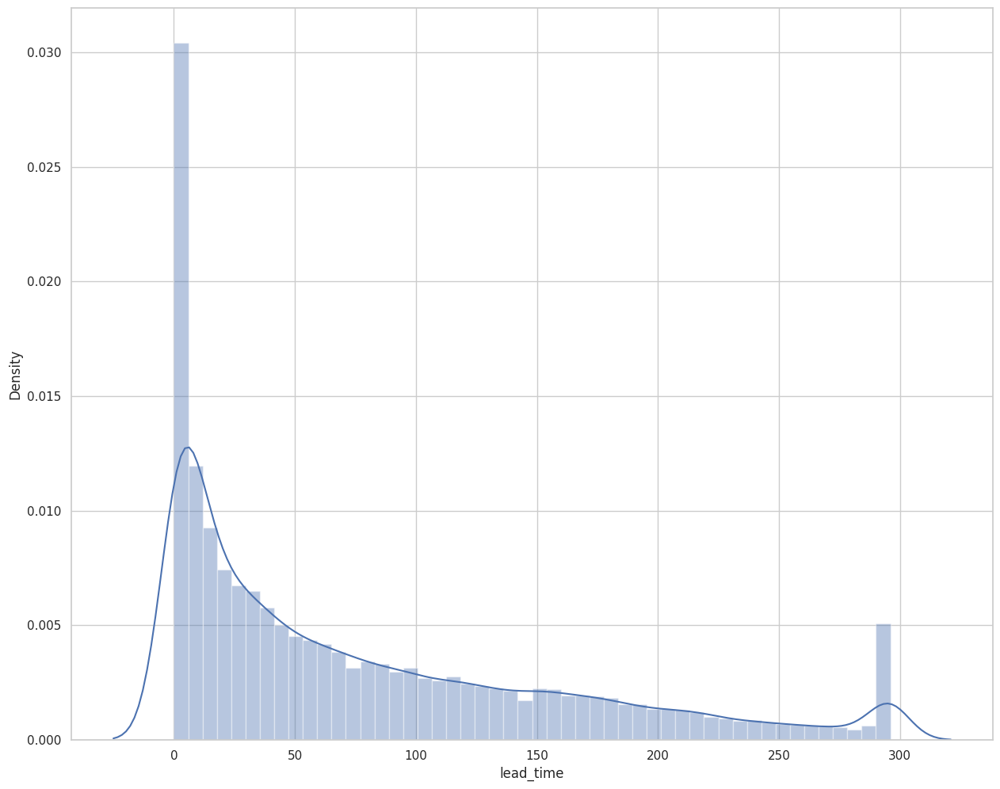

In [ ]:

#using seaborn library
sns.distplot(dataframe["lead_time"])

In [ ]:
def handle_outlier(col):
    dataframe[col] = np.log1p(dataframe[col])

In [ ]:
handle_outlier("lead_time")

<Axes: xlabel='lead_time', ylabel='Density'>

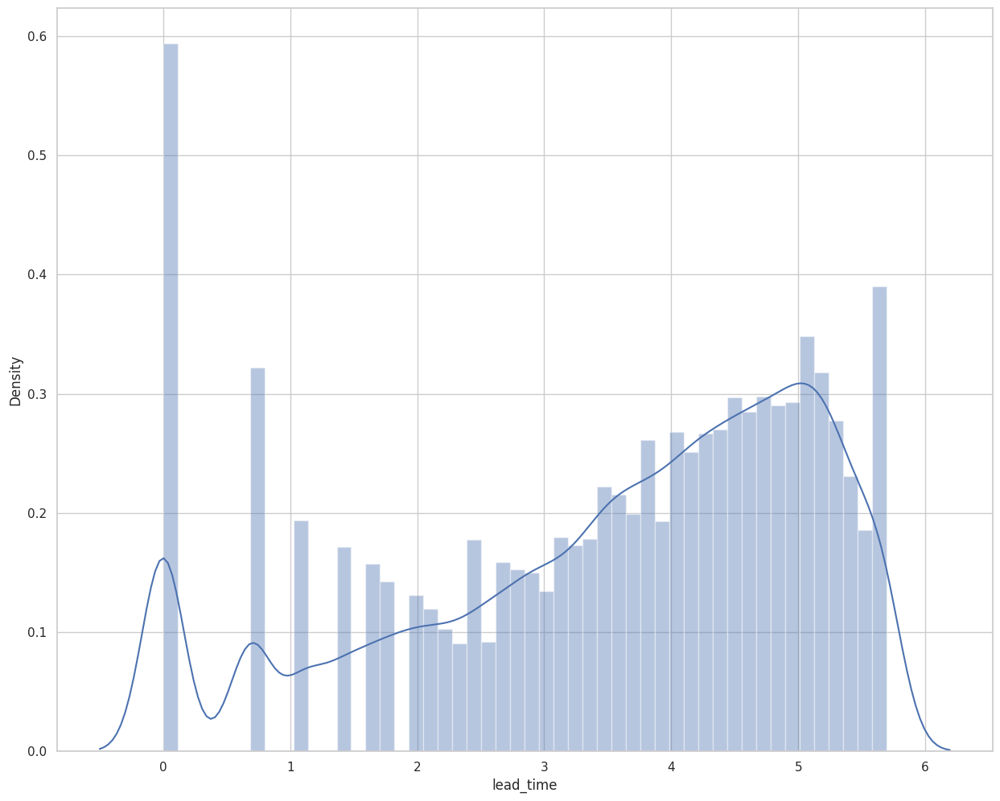

In [ ]:
sns.distplot(dataframe["lead_time"].dropna())

<Axes: xlabel='adr', ylabel='Density'>

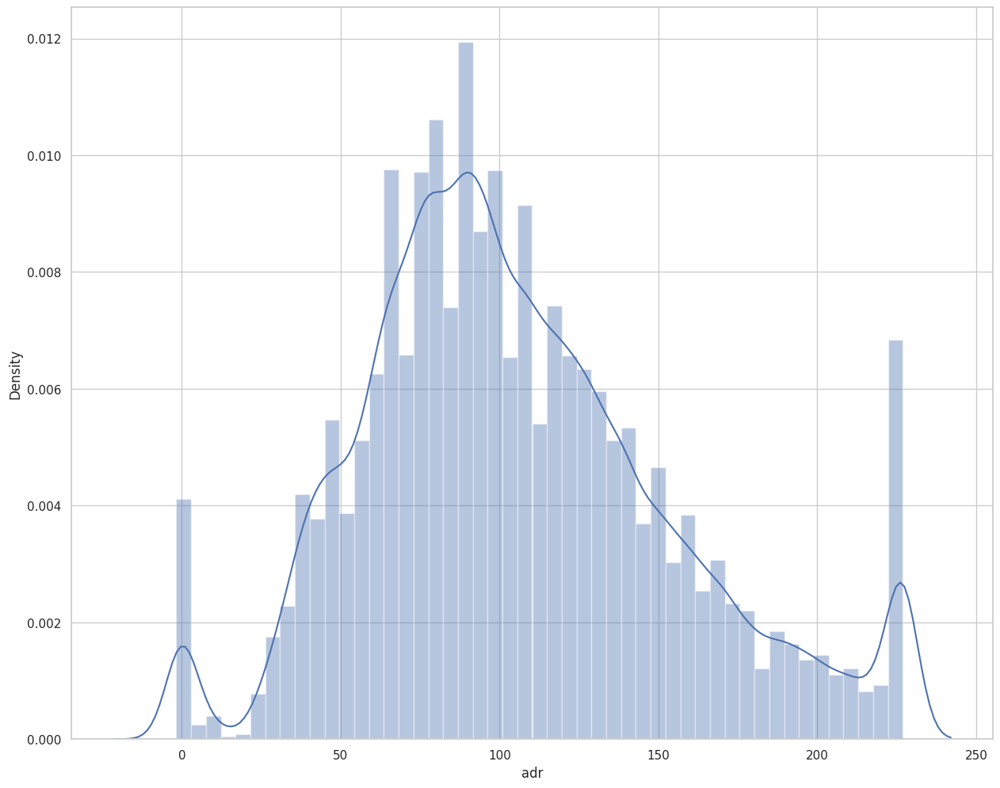

In [ ]:
sns.distplot(dataframe["adr"])

In [ ]:
handle_outlier("adr")

<Axes: xlabel='adr', ylabel='Density'>

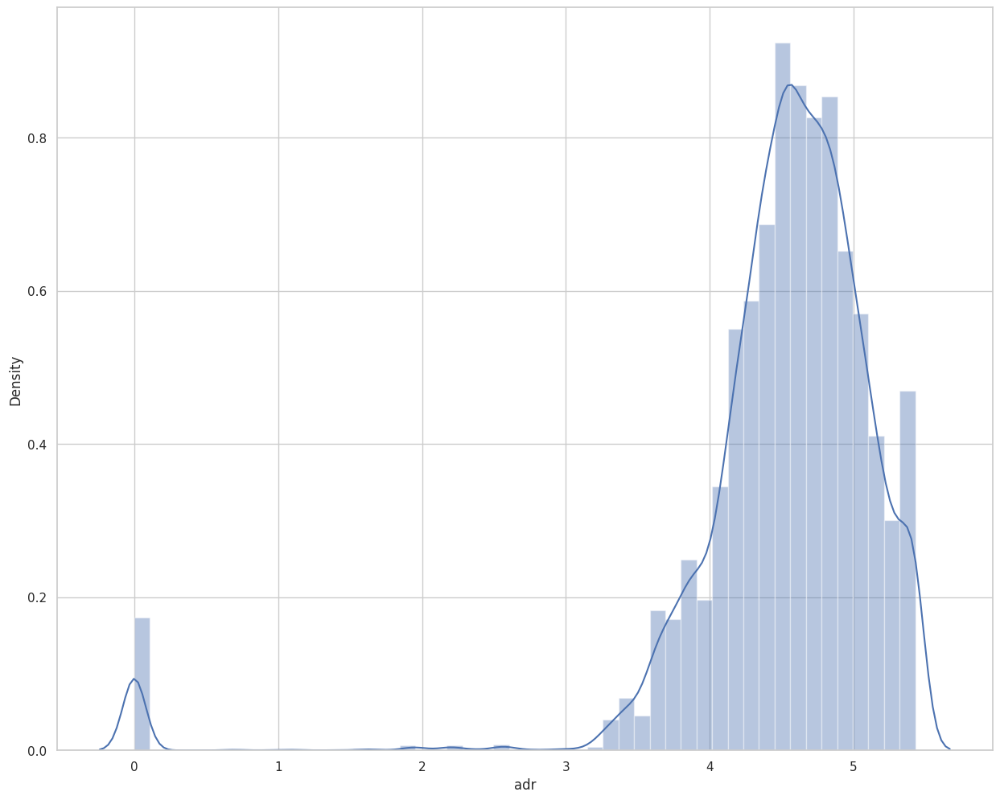

In [ ]:
sns.distplot(dataframe['adr'])

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler_columns = ['lead_time','stays_in_week_nights','agent','company','adr','total_of_special_requests','hotel',
                 'arrival_date_month','meal','market_segment','distribution_channel','reserved_room_type','deposit_type','customer_type']
dataframe[scaler_columns] = scaler.fit_transform(dataframe[scaler_columns])

In [ ]:
dataframe.head()

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,adr,required_car_parking_spaces,total_of_special_requests,length_of_stay,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,0,1.336280,27,1,0,-1.427966,2,0.0,0,0,0,0,0,-0.635520,-0.007407,-5.755413,0,-0.874549,0.0,-1.252913,1.126731,-0.331485,-1.293094,-1.862825,1.922998,-0.109337,0.46079,2015,7,1
1,0,1.336280,27,1,0,-1.427966,2,0.0,0,0,0,0,0,-0.635520,-0.007407,-5.755413,0,-0.874549,0.0,-1.252913,1.126731,-0.331485,-1.293094,-1.862825,1.922998,-0.109337,0.46079,2015,7,1
2,0,-0.893894,27,1,0,-0.873914,2,0.0,0,0,0,0,0,-0.635520,-0.007407,-0.214970,0,-0.874549,1.0,-1.252913,1.126731,-0.331485,-1.293094,-1.862825,-0.597006,-0.109337,0.46079,2015,7,2
3,0,-0.548587,27,1,0,-0.873914,2,0.0,0,0,0,0,0,2.033989,-0.007407,-0.214970,0,-0.874549,1.0,-1.252913,1.126731,-0.331485,-1.557918,-2.168104,-0.597006,-0.109337,0.46079,2015,7,2
4,0,-0.506015,27,1,0,-0.319861,2,0.0,0,0,0,0,0,1.444856,-0.007407,0.123268,0,0.413094,2.0,-1.252913,1.126731,-0.331485,0.795310,0.510594,-0.597006,-0.109337,0.46079,2015,7,3


In [ ]:
dataframe.isnull().sum()

is_canceled                       0
lead_time                         0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
booking_changes                   0
agent                             0
company                           0
adr                               1
required_car_parking_spaces       0
total_of_special_requests         0
length_of_stay                    0
hotel                             0
arrival_date_month                0
meal                              0
market_segment                    0
distribution_channel              0
reserved_room_type                0
deposit_type                      0
customer_type                     0
year                        

In [ ]:
dataframe.dropna(inplace = True)

# **FEATURE IMPORTANCE**

---



In [ ]:
##separate dependent and independent variables

y = dataframe["is_canceled"] #dependent variable

X = dataframe.drop("is_canceled", axis = 1) #independent



In [ ]:
X.columns

Index(['lead_time', 'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent', 'company',
       'adr', 'required_car_parking_spaces', 'total_of_special_requests',
       'length_of_stay', 'hotel', 'arrival_date_month', 'meal',
       'market_segment', 'distribution_channel', 'reserved_room_type',
       'deposit_type', 'customer_type', 'year', 'month', 'day'],
      dtype='object')

In [ ]:
X.shape

(87210, 29)

In [ ]:
y.shape

(87210,)

# **SMOTE**

---



In [ ]:
import imblearn
from imblearn.over_sampling import SMOTE
smote= SMOTE()
X_smote,y_smote = smote.fit_resample(X,y)
print(y.value_counts())
print("***************"*10)
print(y_smote.value_counts())

0    63202
1    24008
Name: is_canceled, dtype: int64
******************************************************************************************************************************************************
0    63202
1    63202
Name: is_canceled, dtype: int64


In [ ]:
X_smote.head()

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,adr,required_car_parking_spaces,total_of_special_requests,length_of_stay,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,1.336280,27,1,0,-1.427966,2,0.0,0,0,0,0,0,-0.635520,-0.007407,-5.755413,0,-0.874549,0.0,-1.252913,1.126731,-0.331485,-1.293094,-1.862825,1.922998,-0.109337,0.46079,2015,7,1
1,1.336280,27,1,0,-1.427966,2,0.0,0,0,0,0,0,-0.635520,-0.007407,-5.755413,0,-0.874549,0.0,-1.252913,1.126731,-0.331485,-1.293094,-1.862825,1.922998,-0.109337,0.46079,2015,7,1
2,-0.893894,27,1,0,-0.873914,2,0.0,0,0,0,0,0,-0.635520,-0.007407,-0.214970,0,-0.874549,1.0,-1.252913,1.126731,-0.331485,-1.293094,-1.862825,-0.597006,-0.109337,0.46079,2015,7,2
3,-0.548587,27,1,0,-0.873914,2,0.0,0,0,0,0,0,2.033989,-0.007407,-0.214970,0,-0.874549,1.0,-1.252913,1.126731,-0.331485,-1.557918,-2.168104,-0.597006,-0.109337,0.46079,2015,7,2
4,-0.506015,27,1,0,-0.319861,2,0.0,0,0,0,0,0,1.444856,-0.007407,0.123268,0,0.413094,2.0,-1.252913,1.126731,-0.331485,0.795310,0.510594,-0.597006,-0.109337,0.46079,2015,7,3


In [ ]:
y_smote.head()

0    0
1    0
2    0
3    0
4    0
Name: is_canceled, dtype: int64

In [ ]:
print(X_smote.shape,y_smote.shape)

(126404, 29) (126404,)


# **SPLIT THE DATA AND MODEL BUILDING**

---



In [ ]:
"""
# X -> independent variables

# y -> dependent variable


from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X_smote, y_smote, train_size = 0.75, random_state = 45)
"""

'\n# X -> independent variables\n\n# y -> dependent variable\n\n\nfrom sklearn.model_selection import train_test_split\n\nx_train, x_test, y_train, y_test = train_test_split(X_smote, y_smote, train_size = 0.75, random_state = 45)\n'

# **CREATE LASSO MODEL**

---



In [ ]:
from sklearn.linear_model import Lasso

In [ ]:

# Create a Lasso model
lasso_model = Lasso(alpha=0.001, random_state=1)

# Fit the Lasso model to your training data
lasso_model.fit(X_smote, y_smote)


Lasso(alpha=0.001, random_state=1)

In [ ]:
from sklearn.feature_selection import SelectFromModel
# Use SelectFromModel to select features based on Lasso coefficients
feature_selector = SelectFromModel(lasso_model, prefit=True)

In [ ]:
feature_selector.fit(X_smote, y_smote)

SelectFromModel(estimator=Lasso(alpha=0.001, random_state=1), prefit=True)

In [ ]:
feature_selector.get_support()

array([ True,  True,  True,  True,  True, False, False, False, False,
       False, False, False,  True, False,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True])

In [ ]:
cols = X_smote.columns
print(cols)

Index(['lead_time', 'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent', 'company',
       'adr', 'required_car_parking_spaces', 'total_of_special_requests',
       'length_of_stay', 'hotel', 'arrival_date_month', 'meal',
       'market_segment', 'distribution_channel', 'reserved_room_type',
       'deposit_type', 'customer_type', 'year', 'month', 'day'],
      dtype='object')


In [ ]:
selected_feature = cols[(feature_selector.get_support())]

In [ ]:
print(selected_feature)

Index(['lead_time', 'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'agent', 'adr',
       'total_of_special_requests', 'length_of_stay', 'hotel',
       'arrival_date_month', 'meal', 'market_segment', 'distribution_channel',
       'reserved_room_type', 'deposit_type', 'customer_type', 'year', 'month',
       'day'],
      dtype='object')


In [ ]:
print(f"Total features {X_smote.shape[1]}")

Total features 29


In [ ]:
print(f"Selected features {len(selected_feature)}")

Selected features 20


In [ ]:
X_smote.columns

Index(['lead_time', 'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent', 'company',
       'adr', 'required_car_parking_spaces', 'total_of_special_requests',
       'length_of_stay', 'hotel', 'arrival_date_month', 'meal',
       'market_segment', 'distribution_channel', 'reserved_room_type',
       'deposit_type', 'customer_type', 'year', 'month', 'day'],
      dtype='object')

In [ ]:
X_smote = X_smote[selected_feature]

In [ ]:
X_smote.columns

Index(['lead_time', 'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'agent', 'adr',
       'total_of_special_requests', 'length_of_stay', 'hotel',
       'arrival_date_month', 'meal', 'market_segment', 'distribution_channel',
       'reserved_room_type', 'deposit_type', 'customer_type', 'year', 'month',
       'day'],
      dtype='object')

In [ ]:
X_smote.head()

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,agent,adr,total_of_special_requests,length_of_stay,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,1.336280,27,1,0,-1.427966,-0.635520,-5.755413,-0.874549,0.0,-1.252913,1.126731,-0.331485,-1.293094,-1.862825,1.922998,-0.109337,0.46079,2015,7,1
1,1.336280,27,1,0,-1.427966,-0.635520,-5.755413,-0.874549,0.0,-1.252913,1.126731,-0.331485,-1.293094,-1.862825,1.922998,-0.109337,0.46079,2015,7,1
2,-0.893894,27,1,0,-0.873914,-0.635520,-0.214970,-0.874549,1.0,-1.252913,1.126731,-0.331485,-1.293094,-1.862825,-0.597006,-0.109337,0.46079,2015,7,2
3,-0.548587,27,1,0,-0.873914,2.033989,-0.214970,-0.874549,1.0,-1.252913,1.126731,-0.331485,-1.557918,-2.168104,-0.597006,-0.109337,0.46079,2015,7,2
4,-0.506015,27,1,0,-0.319861,1.444856,0.123268,0.413094,2.0,-1.252913,1.126731,-0.331485,0.795310,0.510594,-0.597006,-0.109337,0.46079,2015,7,3


In [ ]:
y_smote.head()

0    0
1    0
2    0
3    0
4    0
Name: is_canceled, dtype: int64

In [ ]:
"""
# Transform the training and test data to keep only selected features
x_train_selected = feature_selector.transform(x_train)
x_test_selected = feature_selector.transform(x_test)
"""

'\n# Transform the training and test data to keep only selected features\nx_train_selected = feature_selector.transform(x_train)\nx_test_selected = feature_selector.transform(x_test)\n'

In [ ]:
#feature_selector.fit(x_train_selected, y_train)

In [ ]:
#feature_selector.get_support()

# **split for model building**

---



In [ ]:
# X -> independent variables

# y -> dependent variable


from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X_smote, y_smote, train_size = 0.75, random_state = 45)

# **IMPLEMENT DIFFERENT MODELS**

---



In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.linear_model import Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.feature_selection import RFE

In [ ]:
from sklearn.ensemble import VotingRegressor, StackingRegressor

# **Logistic Regression**

---



In [ ]:
# Logistic Regression
logit = LogisticRegression(random_state=1)
logit.fit(x_train, y_train)

LogisticRegression(random_state=1)

**PREDICTIONS FOR LR**

---



In [ ]:
# Make predictions on the train and test data
y_pred_logit_train = logit.predict(x_train)
y_pred_logit_test = logit.predict(x_test)


**EVALUATION FOR LR**

---



In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

In [ ]:
#Classification Report with Train and Test Data
print(classification_report(y_train,y_pred_logit_train))
print("***********************************************"*10)
print(classification_report(y_test,y_pred_logit_test))

              precision    recall  f1-score   support

           0       0.71      0.70      0.71     47403
           1       0.71      0.72      0.71     47400

    accuracy                           0.71     94803
   macro avg       0.71      0.71      0.71     94803
weighted avg       0.71      0.71      0.71     94803

**************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************
              precision    recall  f1-score   support

           0       0.71      0.70      0.71     15799
           1       0.71      0.72      0.71     15802

    accuracy                          

In [ ]:
print("Training Accuracy of Logistic Regression is {:.2f}%".format(accuracy_score(y_train, y_pred_logit_train)*100))
print("***************"*10)
print("Test Accuracy of Logistic Regressione is {:.2f}%".format(accuracy_score(y_test, y_pred_logit_test)*100))

Training Accuracy of Logistic Regression is 71.12%
******************************************************************************************************************************************************
Test Accuracy of Logistic Regressione is 71.06%


**CONFUSION MATRIX FOR TRAIN AND TEST**

---



In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_train, y_pred_logit_train))

confusion_matrix:
 [[33411 13992]
 [13389 34011]]


In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_test, y_pred_logit_test))

confusion_matrix:
 [[11100  4699]
 [ 4447 11355]]


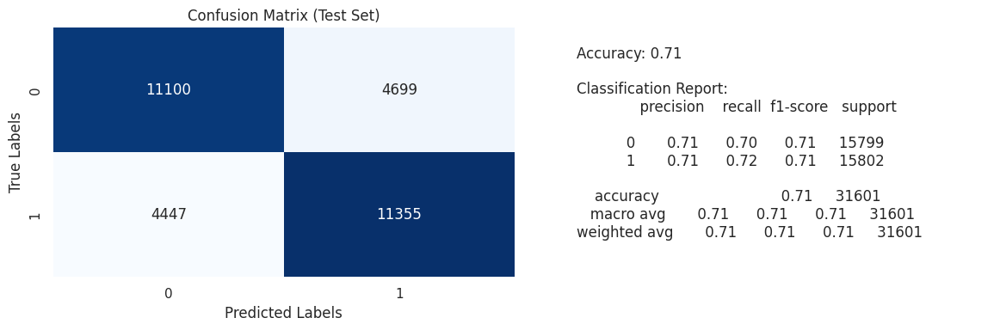

In [ ]:
# Assuming y_test is the true labels for x_test

# Calculate the confusion matrix for the test set predictions
conf_matrix_test = confusion_matrix(y_test, y_pred_logit_test)

# Calculate other evaluation metrics
accuracy_test = accuracy_score(y_test, y_pred_logit_test)
classification_rep_test = classification_report(y_test, y_pred_logit_test)

# Plot confusion matrix
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_test:.2f}\n\nClassification Report:\n{classification_rep_test}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

plt.tight_layout()
plt.show()

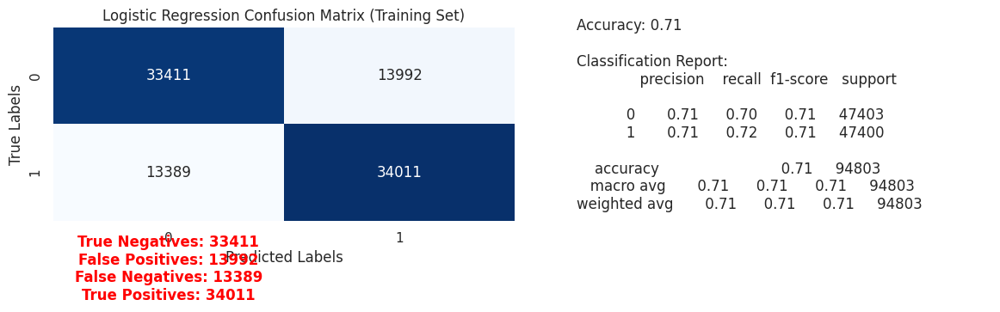

Training Accuracy of Logistic Regression is 71.12%
******************************************************************************************************************************************************
Test Accuracy of Logistic Regression is 71.06%


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# Assuming y_train is the true labels for x_train and y_pred_logit_train is the predicted labels for Logistic Regression
# Assuming y_test is the true labels for x_test and y_pred_logit_test is the predicted labels for Logistic Regression

# Calculate the confusion matrix for the training set predictions (for Logistic Regression)
conf_matrix_train_logit = confusion_matrix(y_train, y_pred_logit_train)

# Calculate other evaluation metrics (for Logistic Regression)
accuracy_train_logit = accuracy_score(y_train, y_pred_logit_train)
classification_rep_train_logit = classification_report(y_train, y_pred_logit_train)

# Extract values from confusion matrix
tn_logit, fp_logit, fn_logit, tp_logit = conf_matrix_train_logit.ravel()

# Plot confusion matrix and additional metrics for Logistic Regression
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train_logit, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Logistic Regression Confusion Matrix (Training Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.text(0.5, 2.5, f'True Negatives: {tn_logit}\nFalse Positives: {fp_logit}\nFalse Negatives: {fn_logit}\nTrue Positives: {tp_logit}',
         fontsize=12, ha='center', va='center', color='red', fontweight='bold')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_train_logit:.2f}\n\nClassification Report:\n{classification_rep_train_logit}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

plt.tight_layout()
plt.show()

# Print overall training and testing accuracy for Logistic Regression
print("Training Accuracy of Logistic Regression is {:.2f}%".format(accuracy_train_logit * 100))
print("***************" * 10)
print("Test Accuracy of Logistic Regression is {:.2f}%".format(accuracy_score(y_test, y_pred_logit_test) * 100))


# **RIDGE CLASSIFIER**

---



In [ ]:
from sklearn.linear_model import RidgeClassifier

# **PREDICTIONS FOR RC**

---



In [ ]:
# Ridge Classifier
ridge_classifier = RidgeClassifier(random_state=1)
ridge_classifier.fit(x_train, y_train)

RidgeClassifier(random_state=1)

# **PREDICTIONS OF TRAIN AND TEST DATA BY RC**

---



In [ ]:
# Make predictions for train and test data
y_pred_train_rc = ridge_classifier.predict(x_train)
y_pred_test_rc = ridge_classifier.predict(x_test)

**EVALUATION OF RC**

In [ ]:
#Classification Report with Train and Test Data
print(classification_report(y_train,y_pred_train_rc))
print("***********************************************"*10)
print(classification_report(y_test,y_pred_test_rc))

              precision    recall  f1-score   support

           0       0.74      0.78      0.76     47403
           1       0.76      0.73      0.75     47400

    accuracy                           0.75     94803
   macro avg       0.75      0.75      0.75     94803
weighted avg       0.75      0.75      0.75     94803

**************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************
              precision    recall  f1-score   support

           0       0.74      0.77      0.76     15799
           1       0.76      0.73      0.74     15802

    accuracy                          

In [ ]:
print("Training Accuracy of Ridge classifier is {:.2f}%".format(accuracy_score(y_train, y_pred_train_rc)*100))
print("***************"*10)
print("Test Accuracy of Ridge classifier is {:.2f}%".format(accuracy_score(y_test, y_pred_test_rc)*100))

Training Accuracy of Ridge classifier is 75.16%
******************************************************************************************************************************************************
Test Accuracy of Ridge classifier is 74.97%


**Confusion matrix for train and test in RC**

---



In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_train, y_pred_train_rc))


confusion_matrix:
 [[36799 10604]
 [12945 34455]]


In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_test, y_pred_test_rc))

confusion_matrix:
 [[12223  3576]
 [ 4333 11469]]


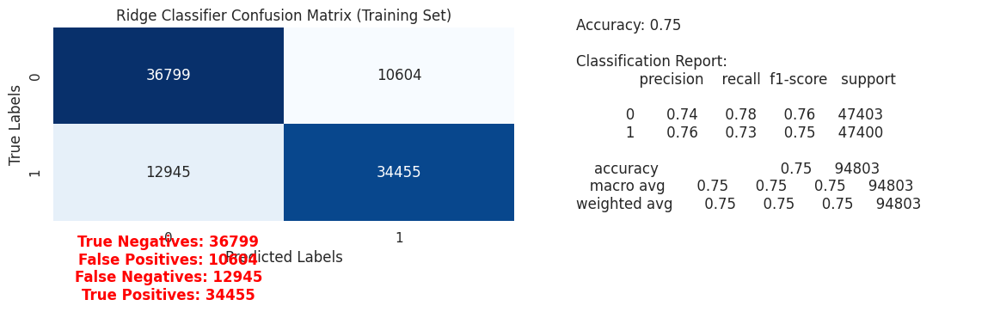

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_train is the true labels for x_train and y_pred_train_dt is the predicted labels

# Calculate the confusion matrix for the training set predictions (for Decision Tree)
conf_matrix_train_rc = confusion_matrix(y_train, y_pred_train_rc)

# Calculate other evaluation metrics (for Ridge classifier)
accuracy_train_rc = accuracy_score(y_train, y_pred_train_rc)
classification_rep_train_rc = classification_report(y_train, y_pred_train_rc)

# Extract values from confusion matrix
tn, fp, fn, tp = conf_matrix_train_rc.ravel()

# Plot confusion matrix and additional metrics
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train_rc, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Ridge Classifier Confusion Matrix (Training Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.text(0.5, 2.5, f'True Negatives: {tn}\nFalse Positives: {fp}\nFalse Negatives: {fn}\nTrue Positives: {tp}',
         fontsize=12, ha='center', va='center', color='red', fontweight='bold')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_train_rc:.2f}\n\nClassification Report:\n{classification_rep_train_rc}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

plt.tight_layout()
plt.show()


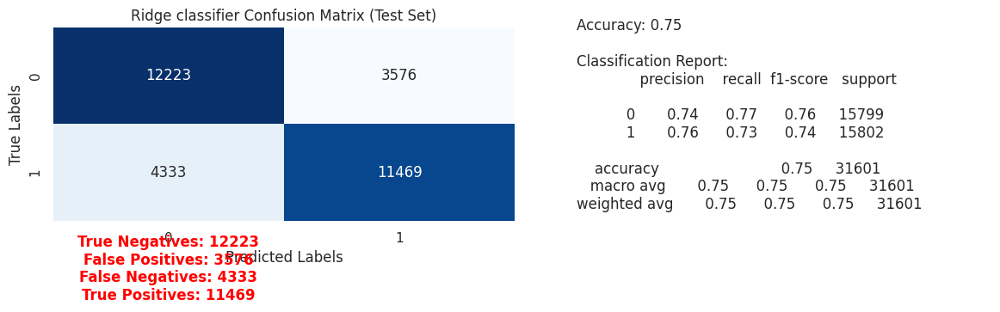

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_test is the true labels for x_test and y_pred_test_dt is the predicted labels

# Calculate the confusion matrix for the test set predictions (for Ridge classifier)
conf_matrix_test_rc = confusion_matrix(y_test, y_pred_test_rc)

# Calculate other evaluation metrics (for Ridge classifier)
accuracy_test_rc = accuracy_score(y_test, y_pred_test_rc)
classification_rep_test_rc = classification_report(y_test, y_pred_test_rc)

# Extract values from confusion matrix
tn_test, fp_test, fn_test, tp_test = conf_matrix_test_rc.ravel()

# Plot confusion matrix and additional metrics
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_test_rc, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Ridge classifier Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.text(0.5, 2.5, f'True Negatives: {tn_test}\nFalse Positives: {fp_test}\nFalse Negatives: {fn_test}\nTrue Positives: {tp_test}',
         fontsize=12, ha='center', va='center', color='red', fontweight='bold')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_test_rc:.2f}\n\nClassification Report:\n{classification_rep_test_rc}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

plt.tight_layout()
plt.show()



In [ ]:
# Get feature coefficients and flatten the array
feature_coefficients = ridge_classifier.coef_.flatten()

# Create a Pandas Series
feature_coefficients_series = pd.Series(feature_coefficients)

# Print or analyze the coefficients
print("Feature Coefficients:")
print(feature_coefficients_series)


Feature Coefficients:
0     0.244046
1     0.005584
2    -0.000302
3    -1.203599
4    -2.093145
5     0.026633
6     0.051151
7    -0.185004
8     1.176784
9     0.058077
10    0.002769
11    0.018067
12    0.266659
13   -0.081038
14    0.016778
15    0.069189
16    0.141142
17   -0.229129
18   -0.059754
19   -0.002505
dtype: float64


In [ ]:
# Get feature coefficients
#feature_coefficients = pd.Series(ridge_classifier.coef_)

In [ ]:
#feature_coefficients

In [ ]:
# Get feature coefficients
#feature_coefficients_test = pd.Series(ridge_classifier.coef_[0], index=df.columns)

In [ ]:
#feature_coefficients_test

# **NAIVE BAYES**

---



In [ ]:
from sklearn.naive_bayes import GaussianNB

In [ ]:
nb = GaussianNB()
nb.fit(x_train, y_train)

GaussianNB()

# **Prediction of train and test by NB**

---



In [ ]:
# Make predictions on the train and test set
y_pred_train_nb = nb.predict(x_train)
y_pred_test_nb = nb.predict(x_test)


# **Evaluation of NB**

---



In [ ]:
#Classification Report with Train and Test Data
print(classification_report(y_train,y_pred_train_nb))
print("***********************************************"*10)
print(classification_report(y_test,y_pred_test_nb))

              precision    recall  f1-score   support

           0       0.67      0.79      0.73     47403
           1       0.75      0.62      0.68     47400

    accuracy                           0.70     94803
   macro avg       0.71      0.70      0.70     94803
weighted avg       0.71      0.70      0.70     94803

**************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************
              precision    recall  f1-score   support

           0       0.67      0.79      0.73     15799
           1       0.74      0.62      0.67     15802

    accuracy                          

In [ ]:
print("Training Accuracy of NB is {:.2f}%".format(accuracy_score(y_train, y_pred_train_nb)*100))
print("***************"*10)
print("Test Accuracy of NB is {:.2f}%".format(accuracy_score(y_test, y_pred_test_nb)*100))

Training Accuracy of NB is 70.47%
******************************************************************************************************************************************************
Test Accuracy of NB is 70.17%


# **Confusion Matrix for Train and Test data by NB**

---



In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_train, y_pred_train_nb))

confusion_matrix:
 [[37611  9792]
 [18202 29198]]


In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_test, y_pred_test_nb))

confusion_matrix:
 [[12441  3358]
 [ 6069  9733]]


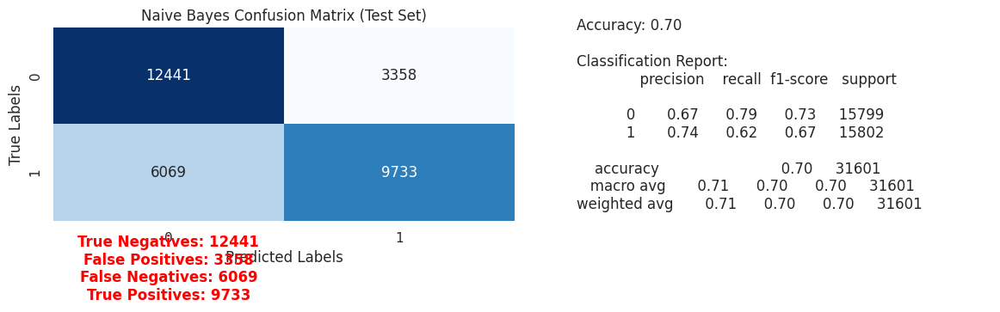

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_test is the true labels for x_test and y_pred_test_dt is the predicted labels

# Calculate the confusion matrix for the test set predictions (for Naive Bayes)
conf_matrix_test_nb = confusion_matrix(y_test, y_pred_test_nb)

# Calculate other evaluation metrics (for Naive Bayes)
accuracy_test_nb = accuracy_score(y_test, y_pred_test_nb)
classification_rep_test_nb = classification_report(y_test, y_pred_test_nb)

# Extract values from confusion matrix
tn_test, fp_test, fn_test, tp_test = conf_matrix_test_nb.ravel()

# Plot confusion matrix and additional metrics
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_test_nb, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Naive Bayes Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.text(0.5, 2.5, f'True Negatives: {tn_test}\nFalse Positives: {fp_test}\nFalse Negatives: {fn_test}\nTrue Positives: {tp_test}',
         fontsize=12, ha='center', va='center', color='red', fontweight='bold')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_test_nb:.2f}\n\nClassification Report:\n{classification_rep_test_nb}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

plt.tight_layout()
plt.show()


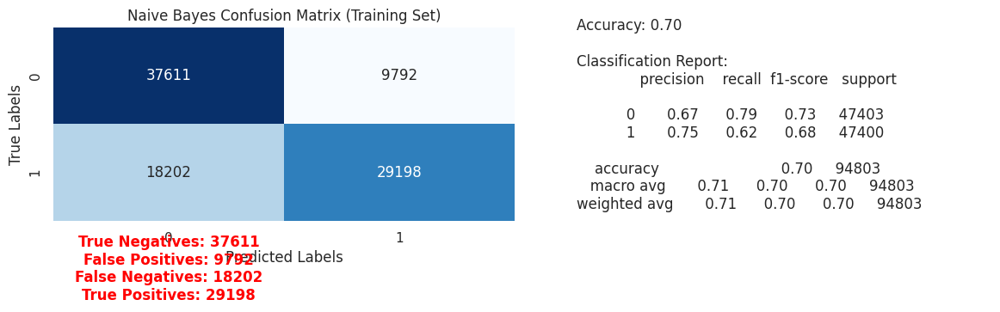

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_train is the true labels for x_train and y_pred_train_dt is the predicted labels

# Calculate the confusion matrix for the training set predictions (for Naive Bayes)
conf_matrix_train_nb = confusion_matrix(y_train, y_pred_train_nb)

# Calculate other evaluation metrics (for Naive Bayes)
accuracy_train_nb = accuracy_score(y_train, y_pred_train_nb)
classification_rep_train_nb = classification_report(y_train, y_pred_train_nb)

# Extract values from confusion matrix
tn, fp, fn, tp = conf_matrix_train_nb.ravel()

# Plot confusion matrix and additional metrics
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train_nb, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Naive Bayes Confusion Matrix (Training Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.text(0.5, 2.5, f'True Negatives: {tn}\nFalse Positives: {fp}\nFalse Negatives: {fn}\nTrue Positives: {tp}',
         fontsize=12, ha='center', va='center', color='red', fontweight='bold')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_train_nb:.2f}\n\nClassification Report:\n{classification_rep_train_nb}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

plt.tight_layout()
plt.show()


# **KNN**

---



In [ ]:
# Import necessary libraries
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
# K-Nearest Neighbors
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train, y_train)

KNeighborsClassifier()

# **PREDICTIONS OF TRAIN AND TEST DATA BY KNN**

---



In [ ]:
# Make predictions on the train and test set
y_pred_train_knn= knn.predict(x_train)
y_pred_test_knn= knn.predict(x_test)


# **Evaluation of KNN**

---



In [ ]:
#Classification Report with Train and Test Data
print(classification_report(y_train,y_pred_train_knn))
print("***********************************************"*10)
print(classification_report(y_test,y_pred_test_knn))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     47403
           1       0.99      0.97      0.98     47400

    accuracy                           0.98     94803
   macro avg       0.98      0.98      0.98     94803
weighted avg       0.98      0.98      0.98     94803

**************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************
              precision    recall  f1-score   support

           0       0.96      0.99      0.97     15799
           1       0.99      0.96      0.97     15802

    accuracy                          

In [ ]:
print("Training Accuracy of KNN is {:.2f}%".format(accuracy_score(y_train, y_pred_train_knn)*100))
print("***************"*10)
print("Test Accuracy of KNN is {:.2f}%".format(accuracy_score(y_test, y_pred_test_knn)*100))

Training Accuracy of KNN is 98.28%
******************************************************************************************************************************************************
Test Accuracy of KNN is 97.04%


# **Confusion Matrix of Train and Test data by KNN**

---



In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_train, y_pred_train_knn))

confusion_matrix:
 [[47033   370]
 [ 1265 46135]]


In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_test, y_pred_test_knn))

confusion_matrix:
 [[15573   226]
 [  709 15093]]


(0.0, 1.0, 0.0, 1.0)

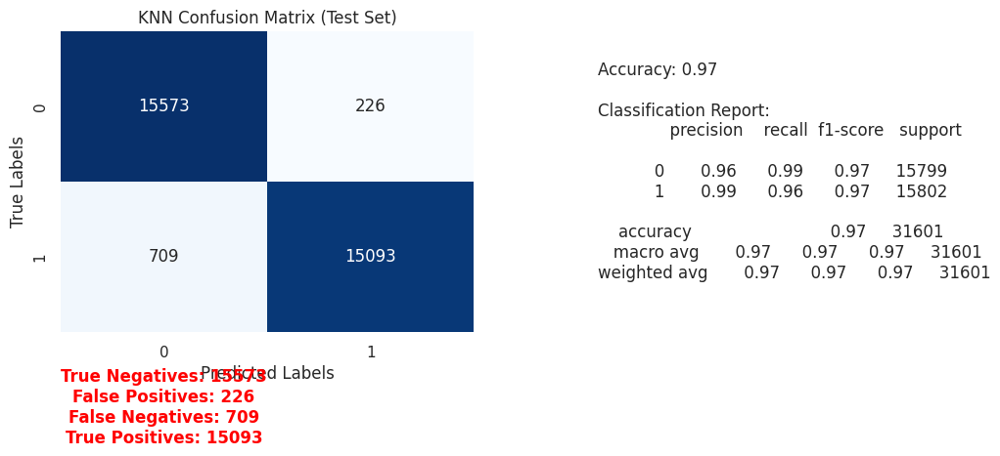

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_test is the true labels for x_test and y_pred_test_knn is the predicted labels

# Calculate the confusion matrix for the test set predictions (for knn)
conf_matrix_test_knn = confusion_matrix(y_test, y_pred_test_knn)

# Calculate other evaluation metrics (for Decision Tree)
accuracy_test_knn = accuracy_score(y_test, y_pred_test_knn)
classification_rep_test_knn = classification_report(y_test, y_pred_test_knn)

# Extract values from confusion matrix
tn_test, fp_test, fn_test, tp_test = conf_matrix_test_knn.ravel()

# Plot confusion matrix and additional metrics
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_test_knn, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('KNN Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.text(0.5, 2.5, f'True Negatives: {tn_test}\nFalse Positives: {fp_test}\nFalse Negatives: {fn_test}\nTrue Positives: {tp_test}',
         fontsize=12, ha='center', va='center', color='red', fontweight='bold')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_test_knn:.2f}\n\nClassification Report:\n{classification_rep_test_knn}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

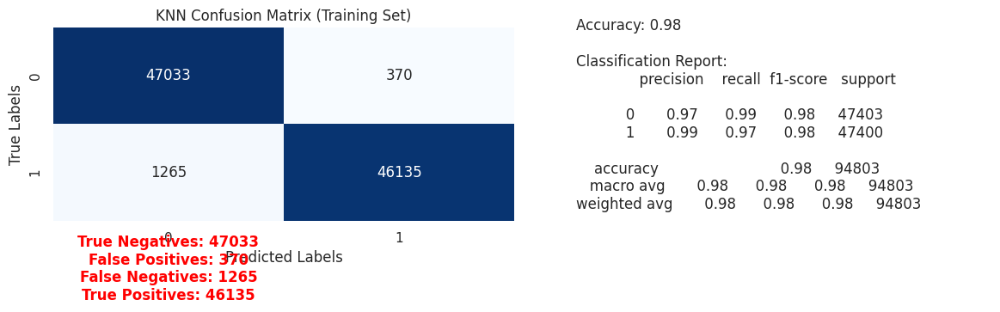

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_train is the true labels for x_train and y_pred_train_dt is the predicted labels

# Calculate the confusion matrix for the training set predictions (for KNN)
conf_matrix_train_knn = confusion_matrix(y_train, y_pred_train_knn)

# Calculate other evaluation metrics (for KNN)
accuracy_train_knn = accuracy_score(y_train, y_pred_train_knn)
classification_rep_train_knn = classification_report(y_train, y_pred_train_knn)

# Extract values from confusion matrix
tn, fp, fn, tp = conf_matrix_train_knn.ravel()

# Plot confusion matrix and additional metrics
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train_knn, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('KNN Confusion Matrix (Training Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.text(0.5, 2.5, f'True Negatives: {tn}\nFalse Positives: {fp}\nFalse Negatives: {fn}\nTrue Positives: {tp}',
         fontsize=12, ha='center', va='center', color='red', fontweight='bold')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_train_knn:.2f}\n\nClassification Report:\n{classification_rep_train_knn}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

plt.tight_layout()
plt.show()


# **DECISION TREE CLASSIFIER**

---



In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
# Decision Tree
dt = DecisionTreeClassifier(random_state=1)
dt.fit(x_train, y_train)

DecisionTreeClassifier(random_state=1)

# **PREDICTIONS FOR TRAIN AND TEST BY DT**

---



In [ ]:
# Make predictions on the train and test set
y_pred_train_dt = dt.predict(x_train)
y_pred_test_dt = dt.predict(x_test)


In [ ]:
#Classification Report with Train and Test Data
print(classification_report(y_train,y_pred_train_dt))
print("***********************************************"*10)
print(classification_report(y_test,y_pred_test_dt))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     47403
           1       1.00      1.00      1.00     47400

    accuracy                           1.00     94803
   macro avg       1.00      1.00      1.00     94803
weighted avg       1.00      1.00      1.00     94803

**************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************
              precision    recall  f1-score   support

           0       0.94      0.94      0.94     15799
           1       0.94      0.94      0.94     15802

    accuracy                          

In [ ]:
print("Training Accuracy of Decision Tree is {:.2f}%".format(accuracy_score(y_train, y_pred_train_dt)*100))
print("***************"*10)
print("Test Accuracy of Decision Tree is {:.2f}%".format(accuracy_score(y_test, y_pred_test_dt)*100))

Training Accuracy of Decision Tree is 100.00%
******************************************************************************************************************************************************
Test Accuracy of Decision Tree is 94.39%


In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_train, y_pred_train_dt))

confusion_matrix:
 [[47403     0]
 [    0 47400]]


In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_test, y_pred_test_dt))

confusion_matrix:
 [[14903   896]
 [  878 14924]]


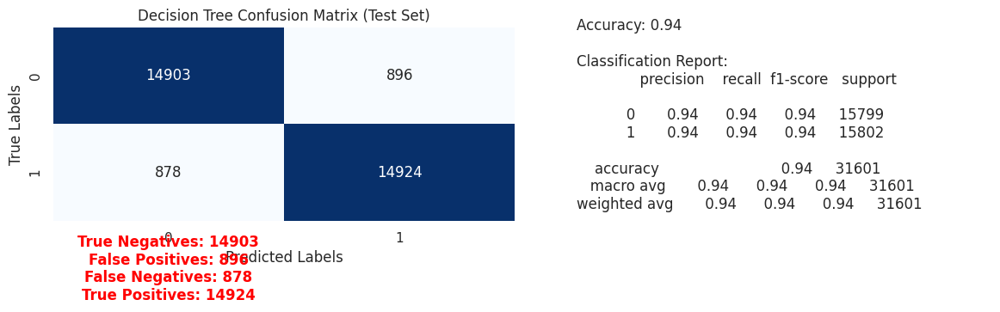

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_test is the true labels for x_test and y_pred_test_dt is the predicted labels

# Calculate the confusion matrix for the test set predictions (for Decision Tree)
conf_matrix_test_dt = confusion_matrix(y_test, y_pred_test_dt)

# Calculate other evaluation metrics (for Decision Tree)
accuracy_test_dt = accuracy_score(y_test, y_pred_test_dt)
classification_rep_test_dt = classification_report(y_test, y_pred_test_dt)

# Extract values from confusion matrix
tn_test, fp_test, fn_test, tp_test = conf_matrix_test_dt.ravel()

# Plot confusion matrix and additional metrics
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_test_dt, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Decision Tree Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.text(0.5, 2.5, f'True Negatives: {tn_test}\nFalse Positives: {fp_test}\nFalse Negatives: {fn_test}\nTrue Positives: {tp_test}',
         fontsize=12, ha='center', va='center', color='red', fontweight='bold')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_test_dt:.2f}\n\nClassification Report:\n{classification_rep_test_dt}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

plt.tight_layout()
plt.show()



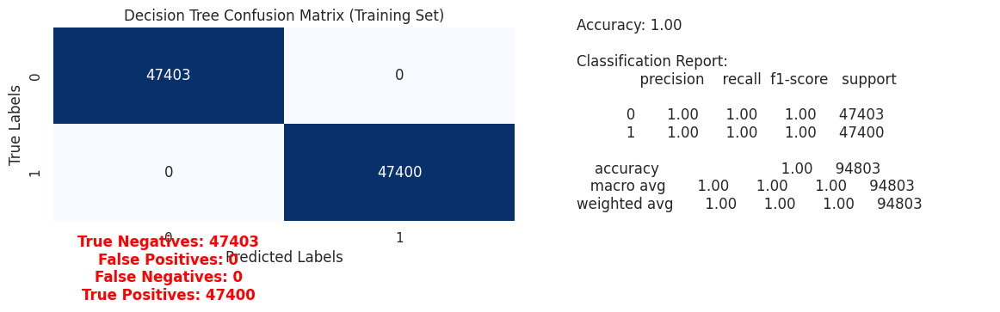

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_train is the true labels for x_train and y_pred_train_dt is the predicted labels

# Calculate the confusion matrix for the training set predictions (for Decision Tree)
conf_matrix_train_dt = confusion_matrix(y_train, y_pred_train_dt)

# Calculate other evaluation metrics (for Decision Tree)
accuracy_train_dt = accuracy_score(y_train, y_pred_train_dt)
classification_rep_train_dt = classification_report(y_train, y_pred_train_dt)

# Extract values from confusion matrix
tn, fp, fn, tp = conf_matrix_train_dt.ravel()

# Plot confusion matrix and additional metrics
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train_dt, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Decision Tree Confusion Matrix (Training Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.text(0.5, 2.5, f'True Negatives: {tn}\nFalse Positives: {fp}\nFalse Negatives: {fn}\nTrue Positives: {tp}',
         fontsize=12, ha='center', va='center', color='red', fontweight='bold')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_train_dt:.2f}\n\nClassification Report:\n{classification_rep_train_dt}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

plt.tight_layout()
plt.show()


# **RANDOM FOREST CLASSIFIER(FOR OVERFITTING)**

---



In [ ]:
# Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=1)
rf.fit(x_train, y_train)

RandomForestClassifier(random_state=1)

# **PREDICTIONS FOR TRAIN AND TEST BY RF**

---



In [ ]:
# Make predictions on the train and test data
y_pred_train_rf = rf.predict(x_train)
y_pred_test_rf = rf.predict(x_test)

**EVALUATION BY RF**

---



In [ ]:
#Classification Report with Train and Test Data
print(classification_report(y_train,y_pred_train_rf))
print("***********************************************"*10)
print(classification_report(y_test,y_pred_test_rf))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     47403
           1       1.00      1.00      1.00     47400

    accuracy                           1.00     94803
   macro avg       1.00      1.00      1.00     94803
weighted avg       1.00      1.00      1.00     94803

**************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     15799
           1       0.98      0.92      0.95     15802

    accuracy                          

In [ ]:
print("Training Accuracy of Random Forest Tree is {:.2f}%".format(accuracy_score(y_train, y_pred_train_rf)*100))
print("***************"*10)
print("Test Accuracy of Random Forest Tree is {:.2f}%".format(accuracy_score(y_test, y_pred_test_rf)*100))

Training Accuracy of Random Forest Tree is 100.00%
******************************************************************************************************************************************************
Test Accuracy of Random Forest Tree is 95.19%


# **CONFUSION MATRIX FOR TRAIN AND TEST DATA BY RF**

---



In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_train, y_pred_train_rf))

confusion_matrix:
 [[47403     0]
 [    1 47399]]


In [ ]:
print("confusion_matrix:\n",confusion_matrix(y_test, y_pred_test_rf))

confusion_matrix:
 [[15560   239]
 [ 1280 14522]]


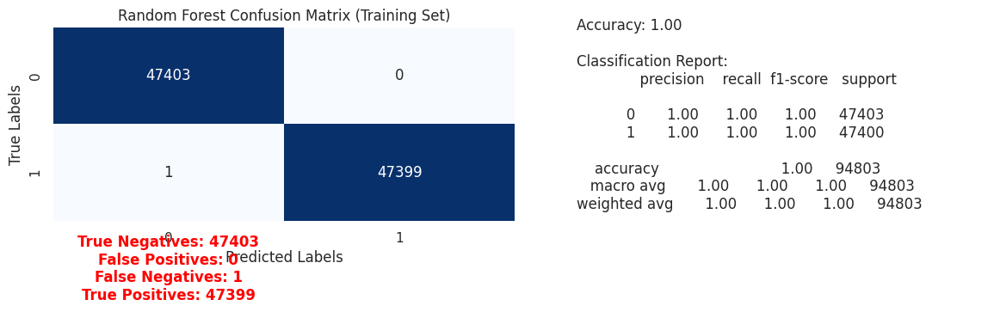

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_train is the true labels for x_train and y_pred_train_rf is the predicted labels

# Calculate the confusion matrix for the training set predictions (for Random Forest)
conf_matrix_train_rf = confusion_matrix(y_train, y_pred_train_rf)

# Calculate other evaluation metrics (for Random Forest)
accuracy_train_rf = accuracy_score(y_train, y_pred_train_rf)
classification_rep_train_rf = classification_report(y_train, y_pred_train_rf)

# Extract values from confusion matrix
tn_train_rf, fp_train_rf, fn_train_rf, tp_train_rf = conf_matrix_train_rf.ravel()

# Plot confusion matrix and additional metrics
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train_rf, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Random Forest Confusion Matrix (Training Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.text(0.5, 2.5, f'True Negatives: {tn_train_rf}\nFalse Positives: {fp_train_rf}\nFalse Negatives: {fn_train_rf}\nTrue Positives: {tp_train_rf}',
         fontsize=12, ha='center', va='center', color='red', fontweight='bold')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_train_rf:.2f}\n\nClassification Report:\n{classification_rep_train_rf}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

plt.tight_layout()
plt.show()

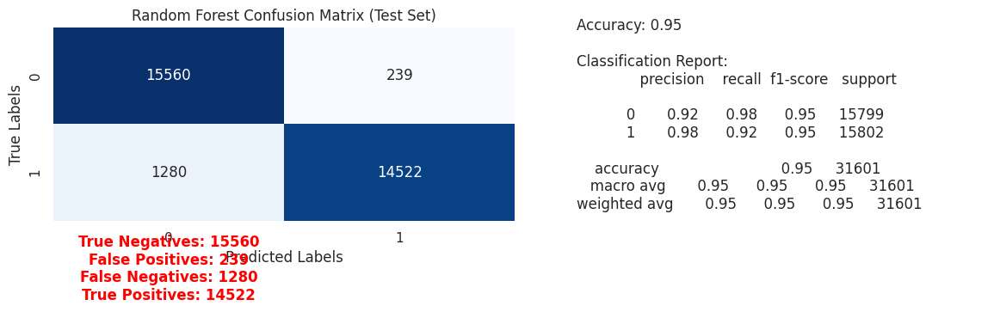

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_test is the true labels for x_test and y_pred_test_rf is the predicted labels

# Calculate the confusion matrix for the test set predictions (for Random Forest)
conf_matrix_test_rf = confusion_matrix(y_test, y_pred_test_rf)

# Calculate other evaluation metrics (for Random Forest)
accuracy_test_rf = accuracy_score(y_test, y_pred_test_rf)
classification_rep_test_rf = classification_report(y_test, y_pred_test_rf)

# Extract values from confusion matrix
tn_test_rf, fp_test_rf, fn_test_rf, tp_test_rf = conf_matrix_test_rf.ravel()

# Plot confusion matrix and additional metrics
plt.figure(figsize=(12, 4))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_test_rf, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Random Forest Confusion Matrix (Test Set)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.text(0.5, 2.5, f'True Negatives: {tn_test_rf}\nFalse Positives: {fp_test_rf}\nFalse Negatives: {fn_test_rf}\nTrue Positives: {tp_test_rf}',
         fontsize=12, ha='center', va='center', color='red', fontweight='bold')

# Subplot 2: Additional Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.5, f"Accuracy: {accuracy_test_rf:.2f}\n\nClassification Report:\n{classification_rep_test_rf}",
         fontsize=12, ha='left', va='center')
plt.axis('off')

plt.tight_layout()
plt.show()


**PREDICT PROBABILITIES BY RF**

---



In [ ]:
# Predict probabilities for the positive class
y_prob_rf = rf.predict_proba(x_test)[:, 1]

# **predict probability of is canceled**

---



In [ ]:
y_prob_rf

array([0.39, 0.99, 0.97, ..., 0.95, 0.02, 0.9 ])

In [ ]:
dataframe['Probability1'] =rf.predict_proba(dataframe[x_test.columns])[:, 1]

In [ ]:
dataframe[['hotel','adr','Probability1']].head()

,hotel,adr,Probability1
0,-1.252913,-5.755413,0.06
1,-1.252913,-5.755413,0.06
2,-1.252913,-0.214970,0.06
3,-1.252913,-0.214970,0.22
4,-1.252913,0.123268,0.17


# **PREDICT PROBABILITY OF NOT CANCELED**

---



In [ ]:
# Predict probabilities for the positive class
y_prob_rf = rf.predict_proba(x_test)[:, 0]

In [ ]:
dataframe['Probability0'] =rf.predict_proba(dataframe[x_test.columns])[:, 0]

In [ ]:
dataframe[['hotel','adr','Probability0']].head()

,hotel,adr,Probability0
0,-1.252913,-5.755413,0.94
1,-1.252913,-5.755413,0.94
2,-1.252913,-0.214970,0.94
3,-1.252913,-0.214970,0.78
4,-1.252913,0.123268,0.83


# **Feature importances**

---



            Feature            Importance
0                   lead_time   0.111305 
7   total_of_special_requests   0.110899 
18                      month   0.098646 
12             market_segment   0.087360 
1    arrival_date_week_number   0.080758 
19                        day   0.069421 
6                         adr   0.056984 
2   arrival_date_day_of_month   0.056270 
5                       agent   0.045404 
10         arrival_date_month   0.044468 
4        stays_in_week_nights   0.039063 
16              customer_type   0.038954 
8              length_of_stay   0.037313 
14         reserved_room_type   0.025784 
13       distribution_channel   0.022640 
17                       year   0.020905 
9                       hotel   0.014783 
11                       meal   0.013908 
3     stays_in_weekend_nights   0.012648 
15               deposit_type   0.012486 


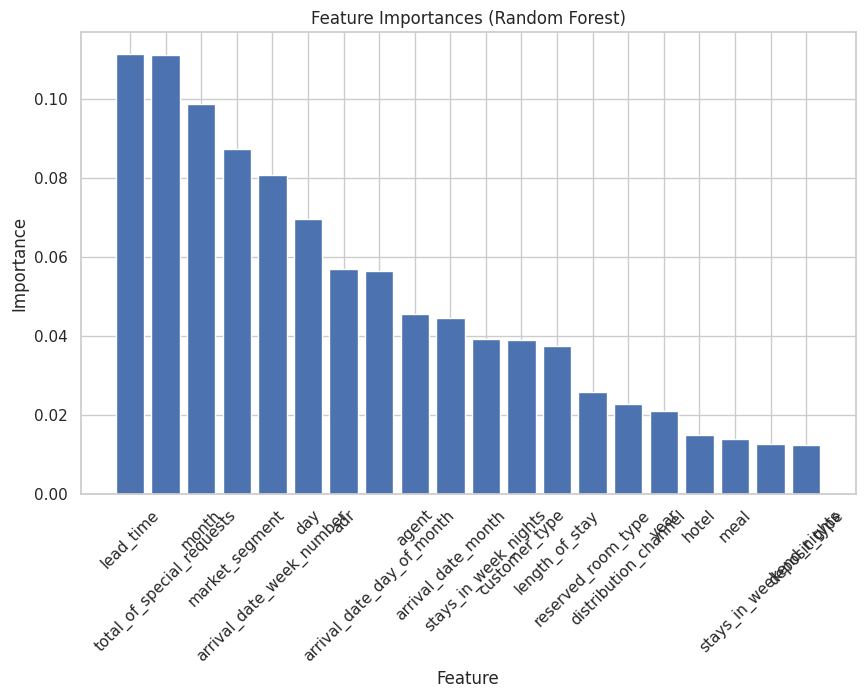

In [ ]:
# Assuming rf is your RandomForestClassifier
# Fit the model to your data
rf.fit(x_train, y_train)

# Get feature importances
feature_importances = rf.feature_importances_

# Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': x_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Display the sorted feature importances
print(feature_importance_df)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances (Random Forest)')
plt.xticks(rotation=45)
plt.show()


# **CROSS VALIDATION**

---



In [ ]:

# Cross Validation required
from sklearn.model_selection import cross_val_score
train_accuracy = cross_val_score(rf, x_train, y_train, cv=10,n_jobs=-1)
test_accuracy = cross_val_score(rf, x_test, y_test, cv=10,n_jobs=-1)
print("TRAIN-ACCURACY :",train_accuracy)
print("***************"*5)
print("MEAN TRAIN-ACCURACY:",train_accuracy.mean())
print("***************"*5)
print("TEST ACCURACY:", test_accuracy)
print("***************"*5)
print("MEAN TEST-ACCURACY:",test_accuracy.mean())

TRAIN-ACCURACY : [0.95179833 0.95359139 0.95253665 0.95031646 0.95221519 0.95189873
 0.95179325 0.95200422 0.95327004 0.95137131]
***************************************************************************
MEAN TRAIN-ACCURACY: 0.9520795577386174
***************************************************************************
TEST ACCURACY: [0.92280924 0.92658228 0.93386076 0.92594937 0.92373418 0.94050633
 0.92943038 0.92025316 0.92594937 0.92816456]
***************************************************************************
MEAN TEST-ACCURACY: 0.927723961732988


# **Hyperparameter tuning of Random Forest**

---



In [ ]:
from sklearn.model_selection import RandomizedSearchCV

# Create a Random Forest Classifier
rf = RandomForestClassifier()

# Define the hyperparameters and their possible values
param_dist = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(rf, param_distributions=param_dist, n_iter=10, cv=3, scoring='accuracy', random_state=42)

# Fit the random search to the data
random_search.fit(x_train, y_train)

# Print the best hyperparameters
print("Best Hyperparameters:", random_search.best_params_)

# Get the best model
best_rf_model = random_search.best_estimator_

# Evaluate the best model on the validation set
accuracy_val = best_rf_model.score(x_test, y_test)
print("Validation Accuracy with Best Model:", accuracy_val)


Best Hyperparameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': None}
Validation Accuracy with Best Model: 0.9523749248441505


In [ ]:
# Concatenate the training and validation sets
x_train_final = pd.concat([x_train, x_test], axis=0)
y_train_final = pd.concat([y_train, y_test], axis=0)

# Train your final model on the combined training and validation sets
best_rf_model.fit(x_train_final, y_train_final)

# Test your final model on the separate test set
y_pred_test_final = best_rf_model.predict(x_test)

# Evaluate the performance on the test set if needed
accuracy_final = accuracy_score(y_test, y_pred_test_final)
classification_report_final = classification_report(y_test, y_pred_test_final)

# Print or analyze the final model's performance on the test set
print(f"Accuracy on test set: {accuracy_final:.2f}")
print("***********************************************"*5)
print("Classification Report on test set:\n", classification_report_final)


Accuracy on test set: 0.99
*******************************************************************************************************************************************************************************************************************************************
Classification Report on test set:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     15799
           1       1.00      0.99      0.99     15802

    accuracy                           0.99     31601
   macro avg       0.99      0.99      0.99     31601
weighted avg       0.99      0.99      0.99     31601



In [ ]:
# Make predictions on the combined training and validation data
y_pred_train_final = best_rf_model.predict(x_train_final)

# Evaluate the performance on the combined training and validation data
accuracy_train_final = accuracy_score(y_train_final, y_pred_train_final)
classification_report_train_final = classification_report(y_train_final, y_pred_train_final)

# Print or analyze the final model's performance on the combined training and validation data
print(f"Accuracy on combined training and validation set: {accuracy_train_final:.2f}")
print("*********************************************************************************"*5)
print("Classification Report on combined training and validation set:\n", classification_report_train_final)


Accuracy on combined training and validation set: 0.99
*********************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************
Classification Report on combined training and validation set:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     63202
           1       1.00      0.99      0.99     63202

    accuracy                           0.99    126404
   macro avg       0.99      0.99      0.99    126404
weighted avg       0.99      0.99      0.99    126404



# **Conclusion:**


---


The Hotel Booking Prediction System provides valuable insights for hotel management, allowing them to anticipate cancellations and optimize their operations effectively. The choice of models and the ensemble approach are determined through thorough experimentation and evaluation of model performance.

**Insights Gained**

---



The Hotel Booking Prediction System provides several insights and benefits for hotel management. Here are some of the key insights gained from the predictive models:

Cancellation Probability:

The models accurately predict the probability of a hotel booking being canceled. This insight allows hotel managers to assess the risk of cancellations for individual reservations.
Feature Importance:

Feature importance analysis from models like Random Forest and Lasso Regression helps identify the most influential factors affecting booking cancellations. This information guides management in understanding the critical features that contribute to cancellations.
Resource Optimization:

By anticipating cancellations, hotel management can optimize resource allocation, including staff scheduling, room assignments, and inventory management. This proactive approach minimizes the impact of cancellations on operational efficiency.
Booking Patterns and Trends:

The models reveal patterns and trends in booking data, such as peak booking periods, popular room types, and seasonal variations. This information assists in strategic decision-making and marketing efforts.
Customer Segmentation:

Segmentation of customers based on their booking behavior and characteristics allows for targeted strategies. Identifying different customer segments helps tailor marketing campaigns and loyalty programs.
Model Ensemble Benefits:

The ensemble of various models provides a more robust and accurate prediction. Combining the strengths of different algorithms improves the overall performance and generalization of the predictive system.
Hyperparameter Tuning Impact:

The hyperparameter tuning process enhances the performance of individual models. Fine-tuning hyperparameters through techniques like GridSearchCV and RandomizedSearchCV helps in achieving the best model configuration.
Interpretability and Explainability:

Models like Logistic Regression and Decision Trees offer interpretability and explainability, providing insights into how specific features influence the prediction. This transparency is crucial for gaining trust in the predictive system.
Operational Efficiency:

Overall, the Hotel Booking Prediction System contributes to improved operational efficiency. It empowers hotel managers with actionable insights to make informed decisions, reduce revenue loss due to cancellations, and enhance the overall guest experience.
Continuous Improvement:

The system allows for continuous monitoring and improvement. Regular updates to the model based on new data and feedback contribute to its adaptability and reliability over time.
In conclusion, the Hotel Booking Prediction System not only predicts cancellations but also empowers hotel management with valuable insights to optimize operations, enhance customer satisfaction, and stay competitive in the dynamic hospitality industry.